# Preprocessing



In [2]:
import sys, platform, numpy, pandas, sklearn
print("Executable:", sys.executable)
print("Python:", sys.version.split()[0])
print("Platform:", platform.platform())
print("numpy:", numpy.__version__, "pandas:", pandas.__version__, "sklearn:", sklearn.__version__)


Executable: C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\python.exe
Python: 3.13.9
Platform: Windows-11-10.0.26100-SP0
numpy: 2.3.4 pandas: 2.3.3 sklearn: 1.7.2


In [3]:
import subprocess
try:
    print(subprocess.check_output(["nvidia-smi"]).decode().splitlines()[0])
except Exception as e:
    print("GPU not visible to CUDA:", e)


Mon Nov 10 12:51:27 2025       


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
import seaborn as sns
from scipy.sparse import hstack
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV, StratifiedKFold, learning_curve
from sklearn.metrics import classification_report, f1_score, confusion_matrix, accuracy_score, roc_curve, roc_auc_score, precision_recall_curve, matthews_corrcoef
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb
import lightgbm as lgb


In [2]:
# Load your dataset (update the file path accordingly)
df = pd.read_csv('C:/Users/vn212/Downloads/OneDrive_1_11-7-2025/TruthSeeke 2024/TruthSeeker2023/Features_For_Traditional_ML_Techniques.csv')# Display basic information
print("Dataset Shape:", df.shape)
df.head()  # Show the first few rows


Dataset Shape: (134198, 64)


,Unnamed: 0,majority_target,statement,BinaryNumTarget,tweet,followers_count,friends_count,favourites_count,statuses_count,listed_count,...,determiners,conjunctions,dots,exclamation,questions,ampersand,capitals,digits,long_word_freq,short_word_freq
0,0,True,End of eviction moratorium means millions of A...,1.0,@POTUS Biden Blunders - 6 Month Update\n\nInfl...,4262.0,3619.0,34945.0,16423.0,44.0,...,0,0,5,0,1,0,33,3,5,19
1,1,True,End of eviction moratorium means millions of A...,1.0,@S0SickRick @Stairmaster_ @6d6f636869 Not as m...,1393.0,1621.0,31436.0,37184.0,64.0,...,0,2,1,0,0,0,14,0,2,34
2,2,True,End of eviction moratorium means millions of A...,1.0,THE SUPREME COURT is siding with super rich pr...,9.0,84.0,219.0,1184.0,0.0,...,0,1,0,0,0,0,3,0,4,10
3,3,True,End of eviction moratorium means millions of A...,1.0,@POTUS Biden Blunders\n\nBroken campaign promi...,4262.0,3619.0,34945.0,16423.0,44.0,...,0,1,3,0,0,1,6,8,1,30
4,4,True,End of eviction moratorium means millions of A...,1.0,@OhComfy I agree. The confluence of events rig...,70.0,166.0,15282.0,2194.0,0.0,...,0,1,3,0,1,0,11,3,2,19


In [3]:
df.columns

Index(['Unnamed: 0', 'majority_target', 'statement', 'BinaryNumTarget',
       'tweet', 'followers_count', 'friends_count', 'favourites_count',
       'statuses_count', 'listed_count', 'following', 'embeddings', 'BotScore',
       'BotScoreBinary', 'cred', 'normalize_influence', 'mentions', 'quotes',
       'replies', 'retweets', 'favourites', 'hashtags', 'URLs', 'unique_count',
       'total_count', 'ORG_percentage', 'NORP_percentage', 'GPE_percentage',
       'PERSON_percentage', 'MONEY_percentage', 'DATE_percentage',
       'CARDINAL_percentage', 'PERCENT_percentage', 'ORDINAL_percentage',
       'FAC_percentage', 'LAW_percentage', 'PRODUCT_percentage',
       'EVENT_percentage', 'TIME_percentage', 'LOC_percentage',
       'WORK_OF_ART_percentage', 'QUANTITY_percentage', 'LANGUAGE_percentage',
       'Word count', 'Max word length', 'Min word length',
       'Average word length', 'present_verbs', 'past_verbs', 'adjectives',
       'adverbs', 'adpositions', 'pronouns', 'TOs', 'deter

In [4]:
df.info()
    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134198 entries, 0 to 134197
Data columns (total 64 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Unnamed: 0              134198 non-null  int64  
 1   majority_target         134198 non-null  bool   
 2   statement               134198 non-null  object 
 3   BinaryNumTarget         134198 non-null  float64
 4   tweet                   134198 non-null  object 
 5   followers_count         134198 non-null  float64
 6   friends_count           134198 non-null  float64
 7   favourites_count        134198 non-null  float64
 8   statuses_count          134198 non-null  float64
 9   listed_count            134198 non-null  float64
 10  following               134198 non-null  float64
 11  embeddings              134198 non-null  object 
 12  BotScore                134198 non-null  float64
 13  BotScoreBinary          134198 non-null  float64
 14  cred                

In [5]:
df = df.drop('Unnamed: 0', axis=1)
display(df.describe())

,BinaryNumTarget,followers_count,friends_count,favourites_count,statuses_count,listed_count,following,BotScore,BotScoreBinary,cred,...,determiners,conjunctions,dots,exclamation,questions,ampersand,capitals,digits,long_word_freq,short_word_freq
count,134198.000000,1.341980e+05,134198.000000,1.341980e+05,1.341980e+05,134198.000000,134198.0,134198.000000,134198.000000,134198.000000,...,134198.000000,134198.000000,134198.000000,134198.000000,134198.000000,134198.000000,134198.000000,134198.000000,134198.000000,134198.000000
mean,0.513644,1.129308e+04,1893.454455,3.298123e+04,3.419576e+04,73.300198,0.0,0.059106,0.032355,0.405852,...,0.135583,1.003495,2.366116,0.259408,0.307151,0.121537,12.831905,3.559494,2.249557,21.438658
std,0.499816,4.374971e+05,6997.695671,6.878021e+04,7.510120e+04,1083.274277,0.0,0.167819,0.176942,0.239223,...,0.379235,1.086844,2.140459,0.903957,0.774367,0.453865,15.557524,6.674458,2.912136,9.625147
min,0.000000,0.000000e+00,0.000000,0.000000e+00,1.000000e+00,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,7.000000e+01,168.000000,1.356000e+03,3.046000e+03,0.000000,0.0,0.030000,0.000000,0.223684,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,6.000000,0.000000,1.000000,14.000000
50%,1.000000,3.540000e+02,567.000000,8.377000e+03,1.101900e+04,2.000000,0.0,0.030000,0.000000,0.386691,...,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,10.000000,2.000000,2.000000,21.000000
75%,1.000000,1.573000e+03,1726.000000,3.352650e+04,3.357375e+04,11.000000,0.0,0.030000,0.000000,0.525020,...,0.000000,2.000000,3.000000,0.000000,0.000000,0.000000,15.000000,4.000000,3.000000,28.000000
max,1.000000,1.306019e+08,586901.000000,1.765080e+06,2.958918e+06,222193.000000,0.0,1.000000,1.000000,1.000000,...,5.000000,13.000000,50.000000,66.000000,43.000000,13.000000,250.000000,138.000000,47.000000,164.000000


In [6]:
df.isnull().sum()

majority_target    0
statement          0
BinaryNumTarget    0
tweet              0
followers_count    0
                  ..
ampersand          0
capitals           0
digits             0
long_word_freq     0
short_word_freq    0
Length: 63, dtype: int64

In [7]:
%pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


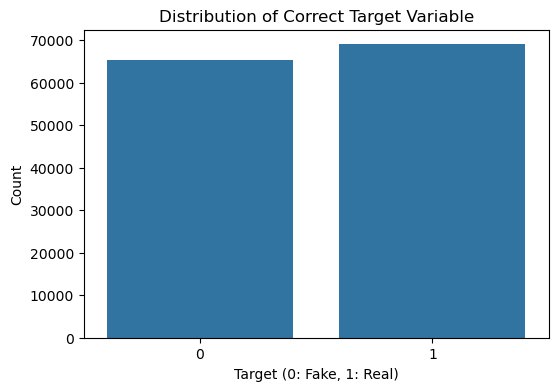

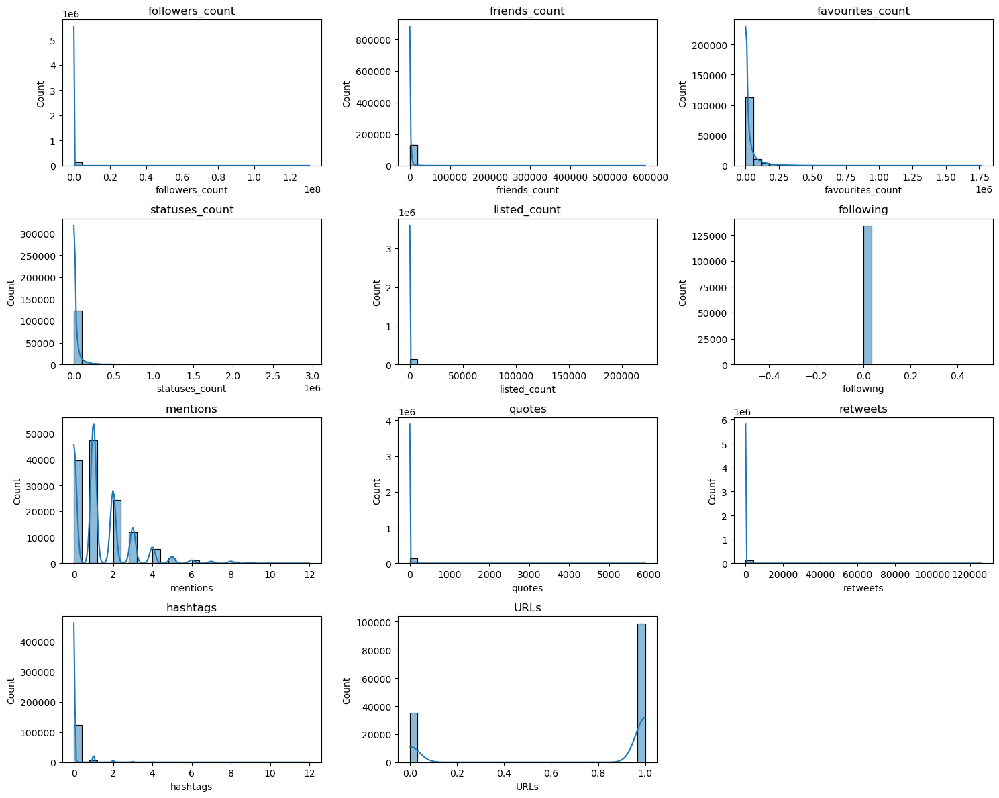

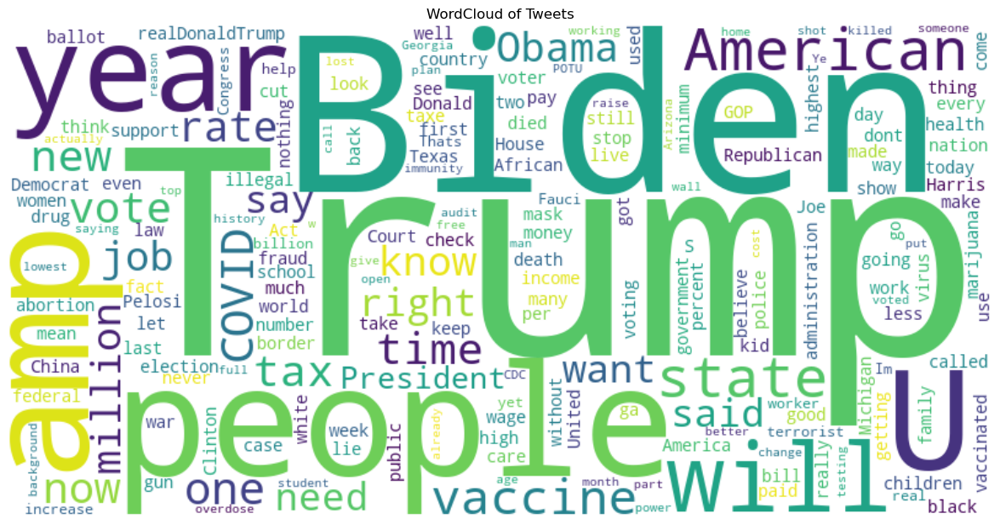

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

%matplotlib inline

# Create correct target variable from majority_target
df['correct_target'] = (df['majority_target'] == True).astype(int)

# Distribution of the target variable (using correct target)
plt.figure(figsize=(6,4))
sns.countplot(x='correct_target', data=df)
plt.title("Distribution of Correct Target Variable")
plt.xlabel("Target (0: Fake, 1: Real)")
plt.ylabel("Count")
plt.show()

# Plot histograms for selected user and engagement metrics
user_engagement_features = ['followers_count', 'friends_count', 'favourites_count', 
                              'statuses_count', 'listed_count', 'following',
                              'mentions', 'quotes', 'retweets', 'hashtags', 'URLs']
plt.figure(figsize=(15, 12))
for i, feature in enumerate(user_engagement_features):
    plt.subplot(4, 3, i+1)
    sns.histplot(df[feature], bins=30, kde=True)
    plt.title(feature)
    plt.tight_layout()
plt.show()

# Generate a WordCloud for tweet text
all_tweets = " ".join(tweet for tweet in df['tweet'].dropna())
wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False).generate(all_tweets)
plt.figure(figsize=(15, 7.5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("WordCloud of Tweets")
plt.show()

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# df = your dataframe
# Expected columns:
#   - "clean_tweet"  (preprocessed tweet text)
#   - "correct_target" (0 = fake, 1 = real)

# ---- 1) Compute tweet length ----
# Option A: length in WORDS (recommended)
df["tweet_len"] = df["clean_tweet"].astype(str).apply(lambda x: len(x.split()))

# Option B: length in CHARACTERS (uncomment to use instead)
# df["tweet_len"] = df["clean_tweet"].astype(str).apply(len)

# ---- 2) Split by class ----
fake_lens = df.loc[df["correct_target"] == 0, "tweet_len"]
real_lens = df.loc[df["correct_target"] == 1, "tweet_len"]

# ---- 3) Plot distribution (overlapping histograms) ----
plt.figure(figsize=(9, 5))
bins = 40  # adjust if needed

plt.hist(fake_lens, bins=bins, alpha=0.6, label="Fake (0)", density=True)
plt.hist(real_lens, bins=bins, alpha=0.6, label="Real (1)", density=True)

plt.title("Tweet Length Distribution by Class")
plt.xlabel("Tweet Length (words)" )  # change to "characters" if using Option B
plt.ylabel("Density")
plt.legend()
plt.grid(axis="y", alpha=0.2)
plt.show()

# ---- (Optional) Quick summary stats to mention in PPT ----
print("Fake length stats:\n", fake_lens.describe())
print("\nReal length stats:\n", real_lens.describe())


KeyError: 'clean_tweet'

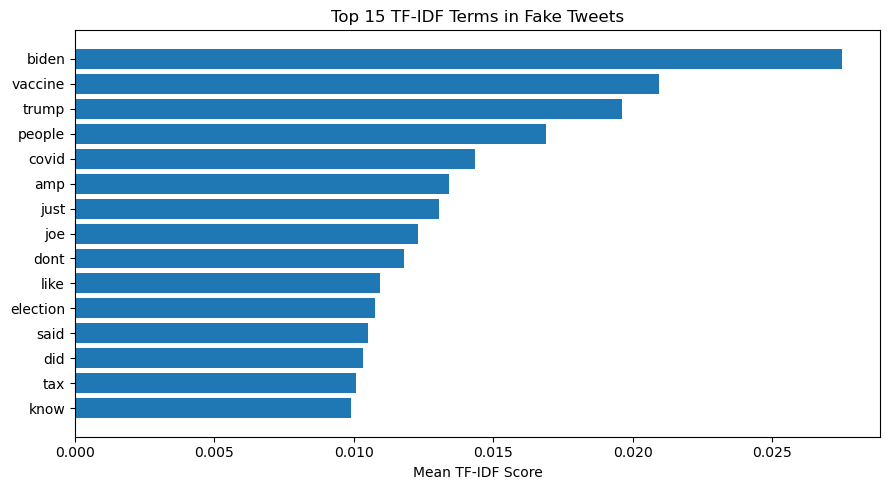

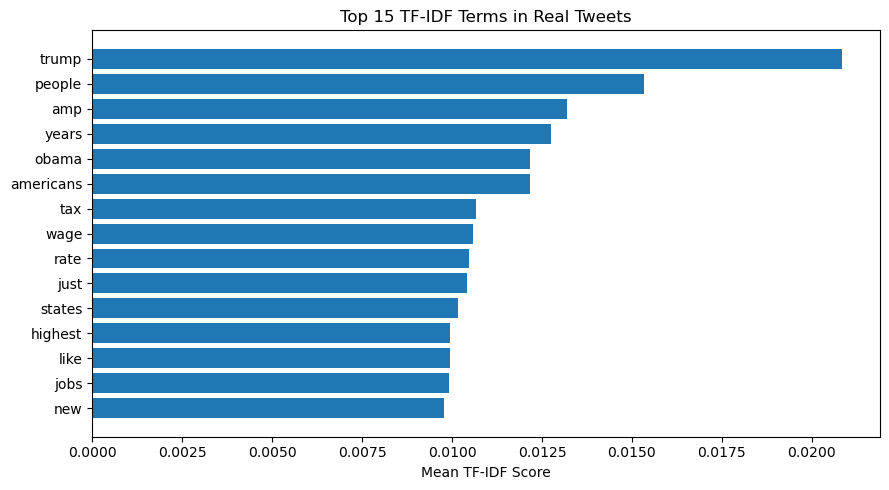

In [102]:
import numpy as np
import matplotlib.pyplot as plt

# Labels: 0 = Fake, 1 = Real
labels = df["correct_target"].values

# Feature/word names from your TF-IDF vectorizer
feature_names = np.array(tfidf_vectorizer.get_feature_names_out())

def mean_tfidf_by_class(X, y, cls):
    X_cls = X[y == cls]
    mean_vec = X_cls.mean(axis=0)
    return np.asarray(mean_vec).ravel()

mean_fake = mean_tfidf_by_class(X_text, labels, 0)
mean_real = mean_tfidf_by_class(X_text, labels, 1)

TOP_K = 15

# ---- Top terms for Fake tweets ----
top_fake_idx = np.argsort(mean_fake)[-TOP_K:]
top_fake_terms = feature_names[top_fake_idx]
top_fake_vals = mean_fake[top_fake_idx]

plt.figure(figsize=(9,5))
plt.barh(top_fake_terms, top_fake_vals)
plt.title(f"Top {TOP_K} TF-IDF Terms in Fake Tweets")
plt.xlabel("Mean TF-IDF Score")
plt.tight_layout()
plt.show()

# ---- Top terms for Real tweets ----
top_real_idx = np.argsort(mean_real)[-TOP_K:]
top_real_terms = feature_names[top_real_idx]
top_real_vals = mean_real[top_real_idx]

plt.figure(figsize=(9,5))
plt.barh(top_real_terms, top_real_vals)
plt.title(f"Top {TOP_K} TF-IDF Terms in Real Tweets")
plt.xlabel("Mean TF-IDF Score")
plt.tight_layout()
plt.show()


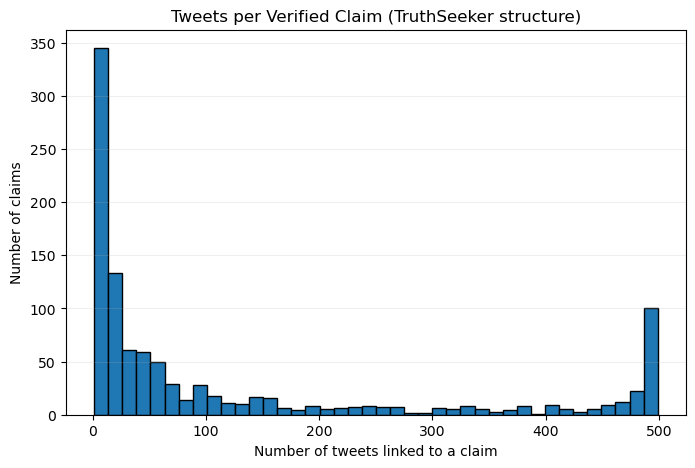

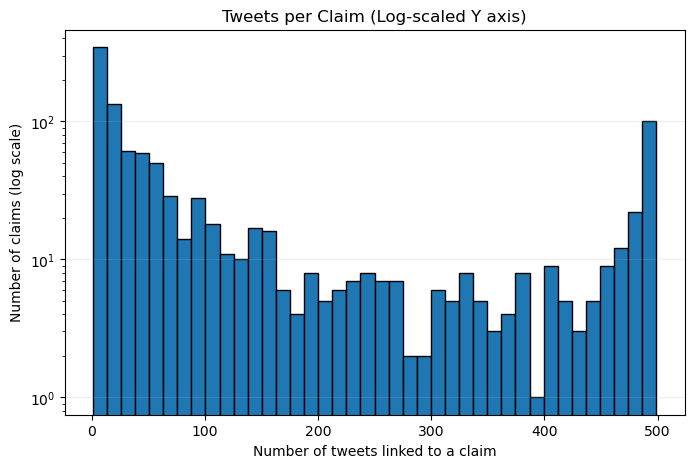

count    1058.000000
mean      126.841210
std       171.480832
min         1.000000
25%        10.000000
50%        37.000000
75%       165.750000
max       499.000000
dtype: float64


In [ ]:
import matplotlib.pyplot as plt

# --- Set your claim/statement column here ---
# Change this to the correct column in your df.
CLAIM_COL = None

# If you want auto-detect, list candidates:
candidates = ["statement", "claim", "news_statement", "statement_id", "BinaryNumTarget"]
for c in candidates:
    if c in df.columns:
        CLAIM_COL = c
        break

if CLAIM_COL is None:
    print("❌ No claim/statement column found. Set CLAIM_COL manually to run this plot.")
else:
    claim_counts = df.groupby(CLAIM_COL).size()

    # Histogram of tweets per claim (long-tail)
    plt.figure(figsize=(8, 5))
    plt.hist(claim_counts, bins=40, edgecolor="black")
    plt.title("Tweets per Verified Claim (TruthSeeker structure)")
    plt.xlabel("Number of tweets linked to a claim")
    plt.ylabel("Number of claims")
    plt.grid(axis="y", alpha=0.2)
    plt.show()

    # Optional: show long tail more clearly
    plt.figure(figsize=(8, 5))
    plt.hist(claim_counts, bins=40, edgecolor="black")
    plt.yscale("log")
    plt.title("Tweets per Claim (Log-scaled Y axis)")
    plt.xlabel("Number of tweets linked to a claim")
    plt.ylabel("Number of claims (log scale)")
    plt.grid(axis="y", alpha=0.2)
    plt.show()

    print(claim_counts.describe())


In [ ]:
import re
import pandas as pd


def preprocess_text(text):
    text = text.lower()                          
    text = re.sub(r"http\S+", "", text)           
    text = re.sub(r"@\S+", "", text)              
    text = re.sub(r"#\S+", "", text)              
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)     
    return text

df['clean_tweet'] = df['tweet'].apply(preprocess_text)


print(df[['tweet', 'clean_tweet']].head())

                                               tweet  \
0  @POTUS Biden Blunders - 6 Month Update\n\nInfl...   
1  @S0SickRick @Stairmaster_ @6d6f636869 Not as m...   
2  THE SUPREME COURT is siding with super rich pr...   
3  @POTUS Biden Blunders\n\nBroken campaign promi...   
4  @OhComfy I agree. The confluence of events rig...   

                                         clean_tweet  
0   biden blunders  6 month update\n\ninflation d...  
1     not as many people are literally starving a...  
2  the supreme court is siding with super rich pr...  
3   biden blunders\n\nbroken campaign promises in...  
4   i agree the confluence of events right now is...  


In [11]:
df.columns


Index(['majority_target', 'statement', 'BinaryNumTarget', 'tweet',
       'followers_count', 'friends_count', 'favourites_count',
       'statuses_count', 'listed_count', 'following', 'embeddings', 'BotScore',
       'BotScoreBinary', 'cred', 'normalize_influence', 'mentions', 'quotes',
       'replies', 'retweets', 'favourites', 'hashtags', 'URLs', 'unique_count',
       'total_count', 'ORG_percentage', 'NORP_percentage', 'GPE_percentage',
       'PERSON_percentage', 'MONEY_percentage', 'DATE_percentage',
       'CARDINAL_percentage', 'PERCENT_percentage', 'ORDINAL_percentage',
       'FAC_percentage', 'LAW_percentage', 'PRODUCT_percentage',
       'EVENT_percentage', 'TIME_percentage', 'LOC_percentage',
       'WORK_OF_ART_percentage', 'QUANTITY_percentage', 'LANGUAGE_percentage',
       'Word count', 'Max word length', 'Min word length',
       'Average word length', 'present_verbs', 'past_verbs', 'adjectives',
       'adverbs', 'adpositions', 'pronouns', 'TOs', 'determiners',
     

In [12]:
df = df.drop('tweet', axis=1)


In [13]:
df['clean_tweet']


0          biden blunders  6 month update\n\ninflation d...
1            not as many people are literally starving a...
2         the supreme court is siding with super rich pr...
3          biden blunders\n\nbroken campaign promises in...
4          i agree the confluence of events right now is...
                                ...                        
134193    joe bidens family owned african slaves\n\njoe ...
134194    joe bidens great great grandfather was a slave...
134195     joe bidens greatgrandfather joseph j biden 18...
134196     facts are bidens vp kamala harris great great...
134197     yes representation matters did you know that ...
Name: clean_tweet, Length: 134198, dtype: object

In [14]:
df.columns


Index(['majority_target', 'statement', 'BinaryNumTarget', 'followers_count',
       'friends_count', 'favourites_count', 'statuses_count', 'listed_count',
       'following', 'embeddings', 'BotScore', 'BotScoreBinary', 'cred',
       'normalize_influence', 'mentions', 'quotes', 'replies', 'retweets',
       'favourites', 'hashtags', 'URLs', 'unique_count', 'total_count',
       'ORG_percentage', 'NORP_percentage', 'GPE_percentage',
       'PERSON_percentage', 'MONEY_percentage', 'DATE_percentage',
       'CARDINAL_percentage', 'PERCENT_percentage', 'ORDINAL_percentage',
       'FAC_percentage', 'LAW_percentage', 'PRODUCT_percentage',
       'EVENT_percentage', 'TIME_percentage', 'LOC_percentage',
       'WORK_OF_ART_percentage', 'QUANTITY_percentage', 'LANGUAGE_percentage',
       'Word count', 'Max word length', 'Min word length',
       'Average word length', 'present_verbs', 'past_verbs', 'adjectives',
       'adverbs', 'adpositions', 'pronouns', 'TOs', 'determiners',
       'conjun

In [15]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create a TF-IDF vectorizer; limit the number of features for efficiency
tfidf_vectorizer = TfidfVectorizer(max_features=5000, stop_words='english')

# Fit and transform the clean text into TF-IDF features
X_text = tfidf_vectorizer.fit_transform(df['clean_tweet'])

# Print the shape of the TF-IDF matrix (number of tweets x number of features)
print("TF-IDF matrix shape:", X_text.shape)

TF-IDF matrix shape: (134198, 5000)


In [16]:
vocab = tfidf_vectorizer.get_feature_names_out()
print("Sample vocabulary:", vocab[:20])

# Inspect the TF-IDF vector for the first tweet
print("TF-IDF vector for the first tweet:")
print(X_text[0])

Sample vocabulary: ['01' '019' '02' '03' '04' '06' '10' '100' '1000' '10000' '100000' '1000s'
 '10075' '100k' '100s' '10k' '10x' '11' '11000' '112']
TF-IDF vector for the first tweet:
<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 22 stored elements and shape (1, 5000)>
  Coords	Values
  (0, 674)	0.11565822300750077
  (0, 2983)	0.21689031436321451
  (0, 4710)	0.283538015063477
  (0, 2381)	0.189698954523411
  (0, 1347)	0.25337760700164635
  (0, 2955)	0.3066774273514893
  (0, 1198)	0.14456727046966966
  (0, 2568)	0.18422263476547313
  (0, 425)	0.1407792369158606
  (0, 360)	0.20665686945670528
  (0, 4431)	0.214178037759115
  (0, 730)	0.1668505856186894
  (0, 1223)	0.2010789308658197
  (0, 753)	0.22043798707887216
  (0, 2515)	0.18405885363585972
  (0, 2077)	0.21079470394821595
  (0, 271)	0.2458795610804794
  (0, 3460)	0.18488550327384623
  (0, 3199)	0.24873552575466734
  (0, 1675)	0.2316000223943666
  (0, 1404)	0.14155573272251978
  (0, 2956)	0.27632056513240966


In [17]:
numeric_feature_names = [
    # User Engagement Metrics:
    'followers_count', 'friends_count', 'favourites_count', 'statuses_count', 
    'listed_count', 'following', 'mentions', 'quotes', 'retweets', 'hashtags', 'URLs','PERSON_percentage',
    
    # Linguistic Features:
    'Word count', 'Average word length', 'exclamation', 'capitals', 'digits','BotScoreBinary', 'cred', 'normalize_influence'
    
    # Optional: you can also include domain-critical features like 'BotScoreBinary', 'cred', 'normalize_influence'
]
X_numeric = df[numeric_feature_names].values

In [18]:
from scipy.sparse import hstack
X_combined = hstack([X_text, X_numeric])
print("Combined feature matrix shape:", X_combined.shape)

Combined feature matrix shape: (134198, 5020)


In [19]:
from sklearn.model_selection import train_test_split

# Define your target variable, for example:
# Create correct target variable from majority_target
df['correct_target'] = (df['majority_target'] == True).astype(int)
y = df['correct_target']  # Use the correct target variable  # or whichever target column you're using

# Split the combined feature matrix (X_combined) and target variable into training and testing sets
# Split the combined feature matrix (X_combined) and correct target variable into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.2, random_state=42, stratify=y)

print("Training set shape:", X_train.shape)
print("Test set shape:", X_test.shape)

Training set shape: (107358, 5020)
Test set shape: (26840, 5020)


In [20]:
X_train_selected = X_train
X_test_selected = X_test


In [21]:
# Check if your split preserved class distribution
print("Class distribution check:")
print(f"Original dataset: {np.bincount(y.astype(int))}")
print(f"Training set: {np.bincount(y_train.astype(int))}")
print(f"Test set: {np.bincount(y_test.astype(int))}")

# Verify we're using the correct target (True=1, False=0)
print(f"\nTarget variable verification:")
print(f"True (Real news) count: {(y == 1).sum()}")
print(f"False (Fake news) count: {(y == 0).sum()}")
print(f"Target variable name: {y.name}")

Class distribution check:
Original dataset: [65213 68985]
Training set: [52170 55188]
Test set: [13043 13797]

Target variable verification:
True (Real news) count: 68985
False (Fake news) count: 65213
Target variable name: correct_target


In [103]:
# Add feature scaling for Logistic Regression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

print("Training Logistic Regression with scaling...")

# Scale features (keep sparse format)
scaler = StandardScaler(with_mean=False)  # with_mean=False for sparse matrices
X_train_scaled = scaler.fit_transform(X_train_selected)
X_test_scaled = scaler.transform(X_test_selected)

# Train LR with scaled features
lr_model = LogisticRegression(
    solver="saga",
    max_iter=5000,
    C=0.1,
    class_weight="balanced",
    random_state=42
)

lr_model.fit(X_train_scaled, y_train)
y_pred_lr = lr_model.predict(X_test_scaled)

# ---- Explicit metrics ----
y_test_int = y_test.astype(int)

acc  = accuracy_score(y_test_int, y_pred_lr)
prec = precision_score(y_test_int, y_pred_lr, zero_division=0)
rec  = recall_score(y_test_int, y_pred_lr, zero_division=0)
f1   = f1_score(y_test_int, y_pred_lr, zero_division=0)

print("Logistic Regression Performance (with scaling):")
print(f"Accuracy : {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall   : {rec:.4f}")
print(f"F1-score : {f1:.4f}\n")

print("Classification Report:")
print(classification_report(y_test_int, y_pred_lr, zero_division=0))


Training Logistic Regression with scaling...
Logistic Regression Performance (with scaling):
Accuracy : 0.9283
Precision: 0.9308
Recall   : 0.9296
F1-score : 0.9302

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93     13043
           1       0.93      0.93      0.93     13797

    accuracy                           0.93     26840
   macro avg       0.93      0.93      0.93     26840
weighted avg       0.93      0.93      0.93     26840



In [23]:
# Check for overfitting
y_train_pred = lr_model.predict(X_train_scaled)
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_pred_lr)

print("Overfitting Check:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Overfitting Gap: {train_accuracy - test_accuracy:.4f}")

if train_accuracy - test_accuracy > 0.05:
    print("⚠️  WARNING: Potential overfitting!")
elif train_accuracy - test_accuracy < -0.05:
    print("⚠️  WARNING: Potential underfitting!")
else:
    print("✅ Good generalization!")

Overfitting Check:
Training Accuracy: 0.9414
Test Accuracy: 0.9283
Overfitting Gap: 0.0131
✅ Good generalization!


In [24]:
# Quick 3-fold cross-validation
from sklearn.model_selection import cross_val_score

cv_scores = cross_val_score(lr_model, X_train_scaled, y_train, cv=3, scoring='accuracy')
print(f"\nCross-Validation Results:")
print(f"CV Accuracy: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")
print(f"Individual CV scores: {cv_scores}")

if cv_scores.mean() < 0.9:
    print("⚠️  WARNING: CV performance much lower than test performance!")


Cross-Validation Results:
CV Accuracy: 0.9206 (+/- 0.0018)
Individual CV scores: [0.92192478 0.92019225 0.91982898]



Confusion Matrix:
[[12089   954]
 [  971 12826]]


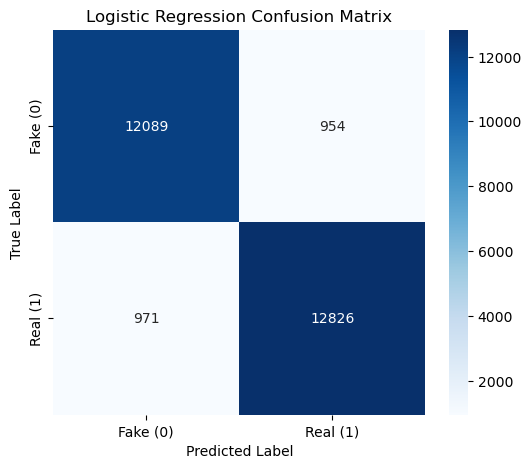

In [25]:
# Detailed confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, y_pred_lr)
print(f"\nConfusion Matrix:")
print(cm)

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Fake (0)', 'Real (1)'],
            yticklabels=['Fake (0)', 'Real (1)'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Logistic Regression Confusion Matrix')
plt.show()

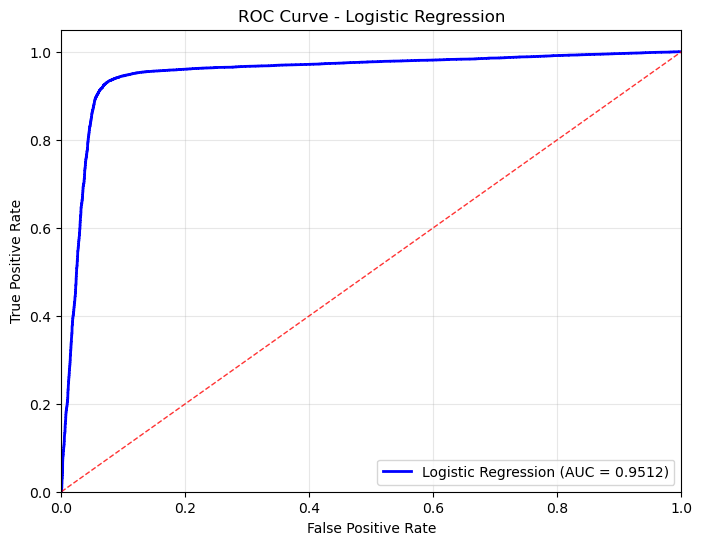

AUC Score: 0.9512


In [26]:
# ROC Curve and AUC
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Get probability predictions
y_pred_proba = lr_model.predict_proba(X_test_scaled)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
auc_score = roc_auc_score(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Logistic Regression (AUC = {auc_score:.4f})')
plt.plot([0, 1], [0, 1], color='red', lw=1, linestyle='--', alpha=0.8)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Logistic Regression')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

print(f"AUC Score: {auc_score:.4f}")

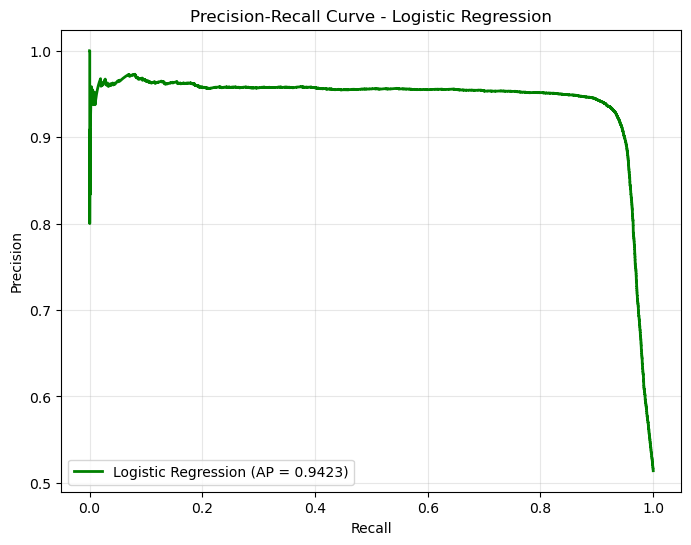

Average Precision: 0.9423


In [27]:
# Precision-Recall Curve
from sklearn.metrics import precision_recall_curve, average_precision_score

precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
avg_precision = average_precision_score(y_test, y_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='green', lw=2, 
         label=f'Logistic Regression (AP = {avg_precision:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Logistic Regression')
plt.legend(loc="lower left")
plt.grid(True, alpha=0.3)
plt.show()

print(f"Average Precision: {avg_precision:.4f}")

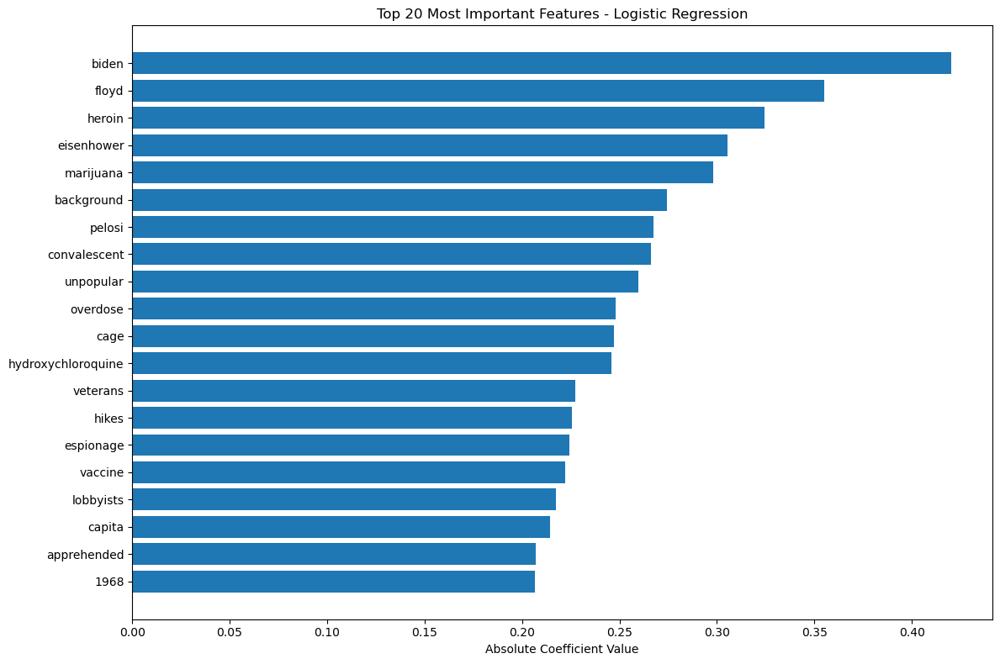

Top 10 Most Important Features:
           feature  coefficient
674          biden    -0.420322
1879         floyd    -0.355138
2174        heroin     0.324231
1565    eisenhower     0.305534
2843     marijuana     0.298255
591     background     0.274293
3305        pelosi    -0.267635
1141  convalescent     0.266050
4704     unpopular     0.259588
3216      overdose     0.247815


In [28]:
# Feature Importance for Logistic Regression
feature_names = []
if hasattr(tfidf_vectorizer, 'get_feature_names_out'):
    feature_names.extend(tfidf_vectorizer.get_feature_names_out())
feature_names.extend(numeric_feature_names)

# Get coefficients
coefficients = lr_model.coef_[0]

# Create feature importance dataframe
feature_importance = pd.DataFrame({
    'feature': feature_names,
    'coefficient': coefficients,
    'abs_coefficient': np.abs(coefficients)
})

# Top 20 most important features
top_features = feature_importance.nlargest(20, 'abs_coefficient')

plt.figure(figsize=(12, 8))
plt.barh(range(len(top_features)), top_features['abs_coefficient'])
plt.yticks(range(len(top_features)), top_features['feature'])
plt.xlabel('Absolute Coefficient Value')
plt.title('Top 20 Most Important Features - Logistic Regression')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

print("Top 10 Most Important Features:")
print(top_features.head(10)[['feature', 'coefficient']])

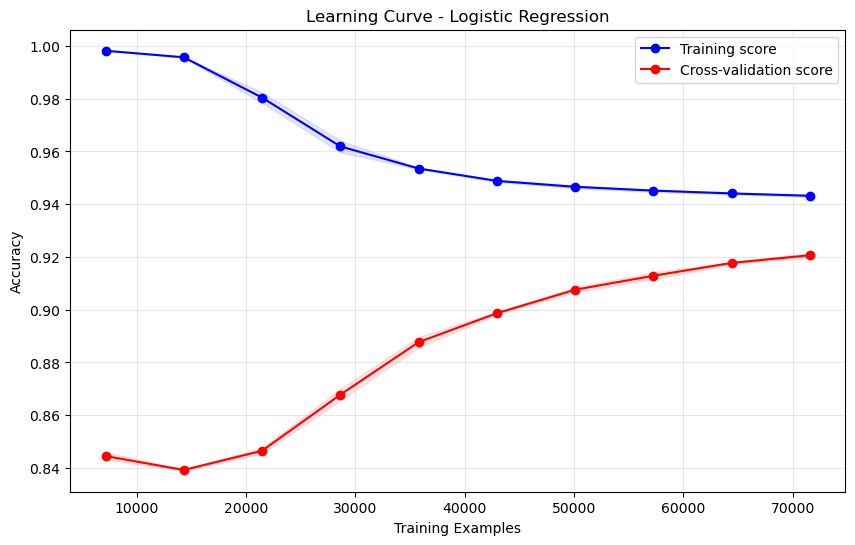

In [29]:
# Learning Curve
from sklearn.model_selection import learning_curve

train_sizes, train_scores, val_scores = learning_curve(
    lr_model, X_train_scaled, y_train, cv=3, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    scoring='accuracy', n_jobs=-1
)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
val_mean = np.mean(val_scores, axis=1)
val_std = np.std(val_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Training score')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.plot(train_sizes, val_mean, 'o-', color='red', label='Cross-validation score')
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1, color='red')
plt.xlabel('Training Examples')
plt.ylabel('Accuracy')
plt.title('Learning Curve - Logistic Regression')
plt.legend(loc='best')
plt.grid(True, alpha=0.3)
plt.show()

🔍 OPTIMAL THRESHOLD ANALYSIS
Optimal threshold: 0.4705
Optimal F1-score: 0.9307

Threshold Comparison:
Default threshold (0.5) F1: 0.9302
Optimal threshold F1: 0.9307
Improvement: 0.0006


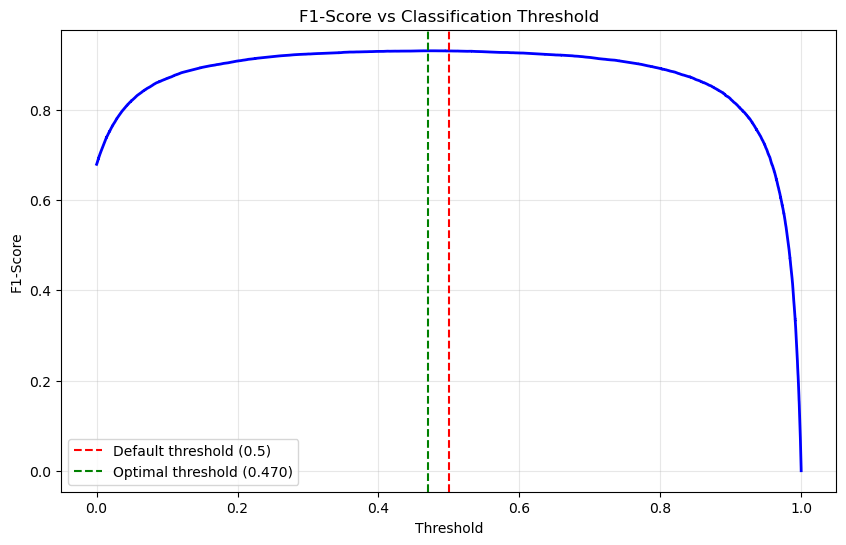

In [30]:
# ==========================
# OPTIMAL THRESHOLD ANALYSIS
# ==========================
from sklearn.metrics import precision_recall_curve, f1_score
import numpy as np
import matplotlib.pyplot as plt

print("🔍 OPTIMAL THRESHOLD ANALYSIS")
print("="*50)

# Use the trained logistic model
model = lr_model  # keep a canonical name to avoid drift

# Get probability predictions (fallback to decision_function if needed)
if hasattr(model, "predict_proba"):
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
else:
    # SAGA + 'ovr' usually provides predict_proba; this is just a safe fallback
    from scipy.special import expit
    y_pred_proba = expit(model.decision_function(X_test_scaled))

# Find optimal threshold by maximizing F1 on PR curve
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
# Note: precision_recall_curve returns len(thresholds) = len(precision) - 1
f1_scores = 2 * (precision[:-1] * recall[:-1]) / (precision[:-1] + recall[:-1] + 1e-8)

optimal_threshold_idx = int(np.argmax(f1_scores))
optimal_threshold = float(thresholds[optimal_threshold_idx])

print(f"Optimal threshold: {optimal_threshold:.4f}")
print(f"Optimal F1-score: {f1_scores[optimal_threshold_idx]:.4f}")

# Compare with default threshold (0.5)
y_pred_default = (y_pred_proba >= 0.5).astype(int)
y_pred_optimal = (y_pred_proba >= optimal_threshold).astype(int)

print(f"\nThreshold Comparison:")
print(f"Default threshold (0.5) F1: {f1_score(y_test, y_pred_default):.4f}")
print(f"Optimal threshold F1: {f1_score(y_test, y_pred_optimal):.4f}")
print(f"Improvement: {f1_score(y_test, y_pred_optimal) - f1_score(y_test, y_pred_default):.4f}")

# Plot threshold vs F1-score
plt.figure(figsize=(10, 6))
plt.plot(thresholds, f1_scores, 'b-', linewidth=2)
plt.axvline(x=0.5, color='red', linestyle='--', label='Default threshold (0.5)')
plt.axvline(x=optimal_threshold, color='green', linestyle='--', label=f'Optimal threshold ({optimal_threshold:.3f})')
plt.xlabel('Threshold')
plt.ylabel('F1-Score')
plt.title('F1-Score vs Classification Threshold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


🔍 ERROR ANALYSIS
Total misclassified: 1925
Misclassification rate: 0.0717
Correctly classified: 24915

Confusion Matrix:
[[12089   954]
 [  971 12826]]

Detailed Error Analysis:
True Positives (TP): 12826 - Correctly identified fake news
True Negatives (TN): 12089 - Correctly identified real news
False Positives (FP): 954 - Real news classified as fake
False Negatives (FN): 971 - Fake news classified as real

Error Rates:
False Positive Rate: 0.0731 (7.31%)
False Negative Rate: 0.0704 (7.04%)


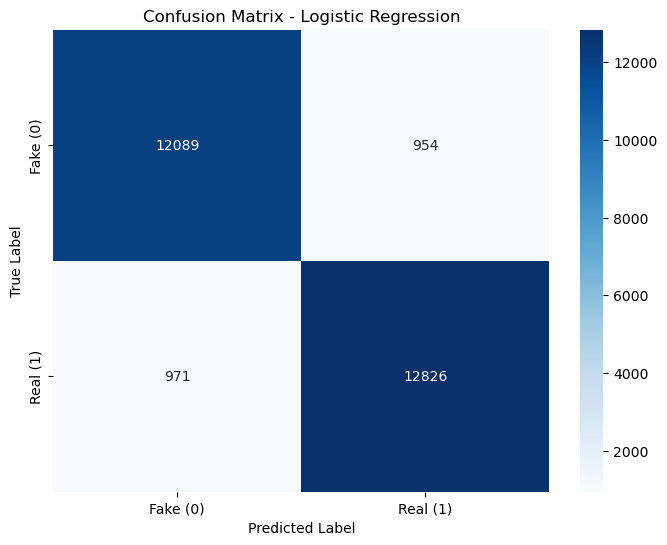

In [31]:
# ==========================
# ERROR ANALYSIS
# ==========================
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print("🔍 ERROR ANALYSIS")
print("="*50)

# Use predictions from the LR section
y_pred = y_pred_lr  # keep consistent name

# Misclassified mask
misclassified = (y_test != y_pred)
misclassified_indices = np.where(misclassified)[0]

print(f"Total misclassified: {misclassified.sum()}")
print(f"Misclassification rate: {misclassified.mean():.4f}")
print(f"Correctly classified: {(~misclassified).sum()}")

# Confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=[0, 1])
print(f"\nConfusion Matrix:\n{cm}")

# Extract counts safely
tn, fp, fn, tp = cm.ravel() if cm.size == 4 else (0, 0, 0, 0)

print(f"\nDetailed Error Analysis:")
print(f"True Positives (TP): {tp} - Correctly identified fake news")
print(f"True Negatives (TN): {tn} - Correctly identified real news")
print(f"False Positives (FP): {fp} - Real news classified as fake")
print(f"False Negatives (FN): {fn} - Fake news classified as real")

# Error rates with zero-division guards
fp_denom = (fp + tn) if (fp + tn) > 0 else 1
fn_denom = (fn + tp) if (fn + tp) > 0 else 1
fp_rate = fp / fp_denom
fn_rate = fn / fn_denom

print(f"\nError Rates:")
print(f"False Positive Rate: {fp_rate:.4f} ({fp_rate*100:.2f}%)")
print(f"False Negative Rate: {fn_rate:.4f} ({fn_rate*100:.2f}%)")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Fake (0)', 'Real (1)'],
            yticklabels=['Fake (0)', 'Real (1)'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Logistic Regression')
plt.show()

### Random forest


In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# 1) Random Forest
print("=== Random Forest ===")
rf = RandomForestClassifier(
    n_estimators=200,      # increase/decrease as needed
    max_depth=None,        # let trees grow until pure; you can cap this
    min_samples_leaf=5,    # avoid over-fitting
    class_weight='balanced', 
    random_state=42
)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))



=== Random Forest ===
Accuracy: 0.9106184798807749
              precision    recall  f1-score   support

           0       0.91      0.90      0.91     13043
           1       0.91      0.92      0.91     13797

    accuracy                           0.91     26840
   macro avg       0.91      0.91      0.91     26840
weighted avg       0.91      0.91      0.91     26840



In [33]:
# ==========================
# IMPORTS FOR RANDOM FOREST ANALYSIS
# ==========================

from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    confusion_matrix, roc_curve, roc_auc_score, precision_recall_curve,
    average_precision_score
)
from sklearn.model_selection import cross_val_score, learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

print("✅ All imports ready for Random Forest analysis!")

✅ All imports ready for Random Forest analysis!


In [34]:
# ==========================
# RANDOM FOREST VERIFICATION & OVERFITTING CHECK
# ==========================

print("🔍 RANDOM FOREST VERIFICATION & OVERFITTING CHECK")
print("="*60)

# Your current RF model
rf = RandomForestClassifier(
    n_estimators=200,
    max_depth=None,
    min_samples_leaf=5,
    class_weight='balanced', 
    random_state=42
)

# Train and predict
rf.fit(X_train_selected, y_train)
y_pred_rf = rf.predict(X_test_selected)

# Basic metrics
accuracy_rf = accuracy_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)

print(f"Random Forest Performance:")
print(f"  Accuracy: {accuracy_rf:.4f}")
print(f"  F1-Score: {f1_rf:.4f}")
print(f"  Precision: {precision_rf:.4f}")
print(f"  Recall: {recall_rf:.4f}")

# Overfitting check
y_train_pred_rf = rf.predict(X_train_selected)
train_accuracy_rf = accuracy_score(y_train, y_train_pred_rf)
overfitting_gap_rf = train_accuracy_rf - accuracy_rf

print(f"\nOverfitting Check:")
print(f"  Train Accuracy: {train_accuracy_rf:.4f}")
print(f"  Test Accuracy: {accuracy_rf:.4f}")
print(f"  Overfitting Gap: {overfitting_gap_rf:.4f}")

if overfitting_gap_rf > 0.05:
    print("  ⚠️  WARNING: Potential overfitting!")
elif overfitting_gap_rf < -0.05:
    print("  ⚠️  WARNING: Potential underfitting!")
else:
    print("  ✅ Good generalization!")

🔍 RANDOM FOREST VERIFICATION & OVERFITTING CHECK
Random Forest Performance:
  Accuracy: 0.9106
  F1-Score: 0.9137
  Precision: 0.9067
  Recall: 0.9209

Overfitting Check:
  Train Accuracy: 0.9304
  Test Accuracy: 0.9106
  Overfitting Gap: 0.0198
  ✅ Good generalization!


In [35]:
# ==========================
# RANDOM FOREST CROSS-VALIDATION
# ==========================

print("\n🔄 RANDOM FOREST CROSS-VALIDATION")
print("="*50)

# Cross-validation
cv_scores_rf = cross_val_score(rf, X_train_selected, y_train, cv=3, scoring='f1', n_jobs=-1)
cv_mean_rf = cv_scores_rf.mean()
cv_std_rf = cv_scores_rf.std()

print(f"Cross-Validation Results:")
print(f"  CV F1-Score: {cv_mean_rf:.4f} (±{cv_std_rf*2:.4f})")
print(f"  Individual CV scores: {cv_scores_rf}")

# Compare CV vs Test
cv_test_diff_rf = abs(cv_mean_rf - f1_rf)
print(f"\nCV vs Test Comparison:")
print(f"  CV F1: {cv_mean_rf:.4f}")
print(f"  Test F1: {f1_rf:.4f}")
print(f"  Difference: {cv_test_diff_rf:.4f}")

if cv_test_diff_rf > 0.1:
    print("  ⚠️  Large CV-Test difference - potential data leakage!")
else:
    print("  ✅ Consistent performance!")


🔄 RANDOM FOREST CROSS-VALIDATION
Cross-Validation Results:
  CV F1-Score: 0.9084 (±0.0035)
  Individual CV scores: [0.91070373 0.90798373 0.90651787]

CV vs Test Comparison:
  CV F1: 0.9084
  Test F1: 0.9137
  Difference: 0.0053
  ✅ Consistent performance!



📈 RANDOM FOREST ROC CURVE


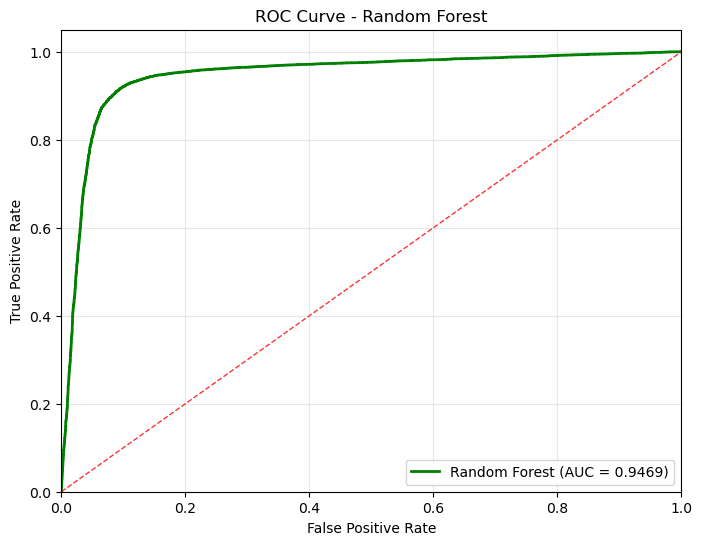

AUC Score: 0.9469


In [36]:
# ==========================
# RANDOM FOREST ROC CURVE
# ==========================

print("\n📈 RANDOM FOREST ROC CURVE")
print("="*50)

# Get probability predictions
y_pred_proba_rf = rf.predict_proba(X_test_selected)[:, 1]

# Calculate ROC curve
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_pred_proba_rf)
auc_score_rf = roc_auc_score(y_test, y_pred_proba_rf)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_rf, tpr_rf, color='green', lw=2, label=f'Random Forest (AUC = {auc_score_rf:.4f})')
plt.plot([0, 1], [0, 1], color='red', lw=1, linestyle='--', alpha=0.8)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

print(f"AUC Score: {auc_score_rf:.4f}")


�� RANDOM FOREST PRECISION-RECALL CURVE


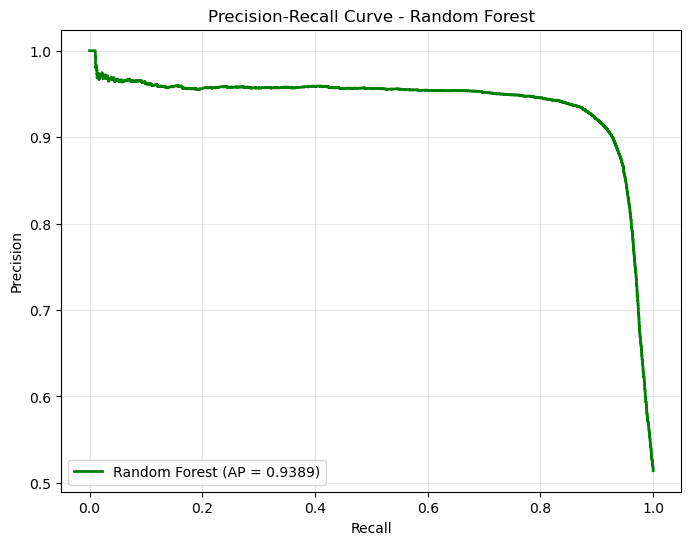

Average Precision: 0.9389


In [37]:
# ==========================
# RANDOM FOREST PRECISION-RECALL CURVE
# ==========================

print("\n�� RANDOM FOREST PRECISION-RECALL CURVE")
print("="*50)

precision_rf, recall_rf, _ = precision_recall_curve(y_test, y_pred_proba_rf)
avg_precision_rf = average_precision_score(y_test, y_pred_proba_rf)

plt.figure(figsize=(8, 6))
plt.plot(recall_rf, precision_rf, color='green', lw=2, 
         label=f'Random Forest (AP = {avg_precision_rf:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Random Forest')
plt.legend(loc="lower left")
plt.grid(True, alpha=0.3)
plt.show()

print(f"Average Precision: {avg_precision_rf:.4f}")


�� RANDOM FOREST CONFUSION MATRIX & ERROR ANALYSIS
Confusion Matrix:
[[11735  1308]
 [ 1091 12706]]

Error Analysis:
True Positives (TP): 12706 - Correctly identified fake news
True Negatives (TN): 11735 - Correctly identified real news
False Positives (FP): 1308 - Real news classified as fake
False Negatives (FN): 1091 - Fake news classified as real

Error Rates:
False Positive Rate: 0.1003 (10.03%)
False Negative Rate: 0.0791 (7.91%)


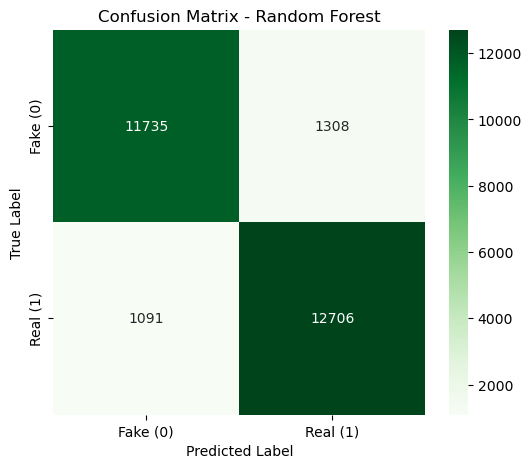

In [38]:
# ==========================
# RANDOM FOREST CONFUSION MATRIX & ERROR ANALYSIS
# ==========================

print("\n�� RANDOM FOREST CONFUSION MATRIX & ERROR ANALYSIS")
print("="*60)

# Confusion matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
print(f"Confusion Matrix:")
print(cm_rf)

# Error analysis
fp_rf = cm_rf[0, 1]  # Predicted fake, actually real
fn_rf = cm_rf[1, 0]  # Predicted real, actually fake
tp_rf = cm_rf[1, 1]  # Predicted fake, actually fake
tn_rf = cm_rf[0, 0]  # Predicted real, actually real

print(f"\nError Analysis:")
print(f"True Positives (TP): {tp_rf} - Correctly identified fake news")
print(f"True Negatives (TN): {tn_rf} - Correctly identified real news")
print(f"False Positives (FP): {fp_rf} - Real news classified as fake")
print(f"False Negatives (FN): {fn_rf} - Fake news classified as real")

# Error rates
fp_rate_rf = fp_rf / (fp_rf + tn_rf)
fn_rate_rf = fn_rf / (fn_rf + tp_rf)

print(f"\nError Rates:")
print(f"False Positive Rate: {fp_rate_rf:.4f} ({fp_rate_rf*100:.2f}%)")
print(f"False Negative Rate: {fn_rate_rf:.4f} ({fn_rate_rf*100:.2f}%)")

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Greens',
            xticklabels=['Fake (0)', 'Real (1)'],
            yticklabels=['Fake (0)', 'Real (1)'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Random Forest')
plt.show()

In [39]:
# ==========================
# RANDOM FOREST OPTIMAL THRESHOLD ANALYSIS
# ==========================

print("\n🔍 RANDOM FOREST OPTIMAL THRESHOLD ANALYSIS")
print("="*50)

# Find optimal threshold
precision_thresh, recall_thresh, thresholds_thresh = precision_recall_curve(y_test, y_pred_proba_rf)
f1_scores_thresh = 2 * (precision_thresh * recall_thresh) / (precision_thresh + recall_thresh + 1e-8)
optimal_threshold_idx = np.argmax(f1_scores_thresh[:-1])
optimal_threshold_rf = thresholds_thresh[optimal_threshold_idx]

print(f"Optimal threshold: {optimal_threshold_rf:.4f}")
print(f"Optimal F1-score: {f1_scores_thresh[optimal_threshold_idx]:.4f}")

# Compare with default threshold (0.5)
y_pred_default_rf = (y_pred_proba_rf >= 0.5).astype(int)
y_pred_optimal_rf = (y_pred_proba_rf >= optimal_threshold_rf).astype(int)

print(f"\nThreshold Comparison:")
print(f"Default threshold (0.5) F1: {f1_score(y_test, y_pred_default_rf):.4f}")
print(f"Optimal threshold F1: {f1_score(y_test, y_pred_optimal_rf):.4f}")
print(f"Improvement: {f1_score(y_test, y_pred_optimal_rf) - f1_score(y_test, y_pred_default_rf):.4f}")


🔍 RANDOM FOREST OPTIMAL THRESHOLD ANALYSIS
Optimal threshold: 0.5058
Optimal F1-score: 0.9139

Threshold Comparison:
Default threshold (0.5) F1: 0.9137
Optimal threshold F1: 0.9139
Improvement: 0.0002



📈 RANDOM FOREST LEARNING CURVE


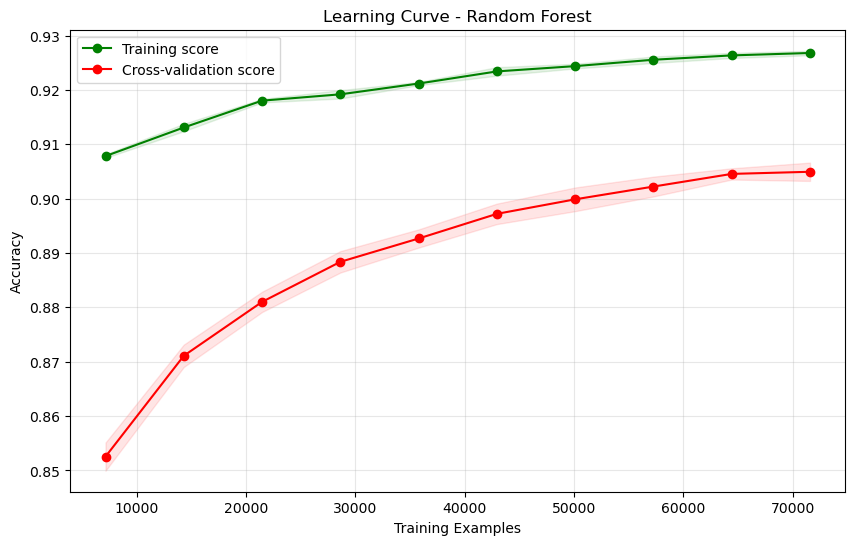

In [40]:
# ==========================
# RANDOM FOREST LEARNING CURVE
# ==========================

print("\n📈 RANDOM FOREST LEARNING CURVE")
print("="*50)

# Learning curve
train_sizes_rf, train_scores_rf, val_scores_rf = learning_curve(
    rf, X_train_selected, y_train, cv=3, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    scoring='accuracy', n_jobs=-1
)

train_mean_rf = np.mean(train_scores_rf, axis=1)
train_std_rf = np.std(train_scores_rf, axis=1)
val_mean_rf = np.mean(val_scores_rf, axis=1)
val_std_rf = np.std(val_scores_rf, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes_rf, train_mean_rf, 'o-', color='green', label='Training score')
plt.fill_between(train_sizes_rf, train_mean_rf - train_std_rf, train_mean_rf + train_std_rf, alpha=0.1, color='green')
plt.plot(train_sizes_rf, val_mean_rf, 'o-', color='red', label='Cross-validation score')
plt.fill_between(train_sizes_rf, val_mean_rf - val_std_rf, val_mean_rf + val_std_rf, alpha=0.1, color='red')
plt.xlabel('Training Examples')
plt.ylabel('Accuracy')
plt.title('Learning Curve - Random Forest')
plt.legend(loc='best')
plt.grid(True, alpha=0.3)
plt.show()

### XgBoost


In [41]:
# 2) XGBoost
import xgboost as xgb
from sklearn.metrics import classification_report, accuracy_score
print("=== XGBoost ===")
xgb_clf = xgb.XGBClassifier(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)
xgb_clf.fit(X_train, y_train)
y_pred_xgb = xgb_clf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print(classification_report(y_test, y_pred_xgb))

=== XGBoost ===


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\xgboost\training.py:199: UserWarning: [19:01:36] WARNING: D:\bld\xgboost-split_1762060105351\work\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Accuracy: 0.906892697466468
              precision    recall  f1-score   support

           0       0.93      0.87      0.90     13043
           1       0.89      0.94      0.91     13797

    accuracy                           0.91     26840
   macro avg       0.91      0.91      0.91     26840
weighted avg       0.91      0.91      0.91     26840



In [42]:
# ==========================
# XGBOOST VERIFICATION & OVERFITTING CHECK
# ==========================

print("🔍 XGBOOST VERIFICATION & OVERFITTING CHECK")
print("="*60)

# Your current XGBoost model
xgb_model = xgb.XGBClassifier(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='logloss',
    random_state=42
)

# Train and predict
xgb_model.fit(X_train_selected, y_train)
y_pred_xgb = xgb_model.predict(X_test_selected)

# Basic metrics
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
f1_xgb = f1_score(y_test, y_pred_xgb)
precision_xgb = precision_score(y_test, y_pred_xgb)
recall_xgb = recall_score(y_test, y_pred_xgb)

print(f"XGBoost Performance:")
print(f"  Accuracy: {accuracy_xgb:.4f}")
print(f"  F1-Score: {f1_xgb:.4f}")
print(f"  Precision: {precision_xgb:.4f}")
print(f"  Recall: {recall_xgb:.4f}")

# Overfitting check
y_train_pred_xgb = xgb_model.predict(X_train_selected)
train_accuracy_xgb = accuracy_score(y_train, y_train_pred_xgb)
overfitting_gap_xgb = train_accuracy_xgb - accuracy_xgb

print(f"\nOverfitting Check:")
print(f"  Train Accuracy: {train_accuracy_xgb:.4f}")
print(f"  Test Accuracy: {accuracy_xgb:.4f}")
print(f"  Overfitting Gap: {overfitting_gap_xgb:.4f}")

if overfitting_gap_xgb > 0.05:
    print("  ⚠️  WARNING: Potential overfitting!")
elif overfitting_gap_xgb < -0.05:
    print("  ⚠️  WARNING: Potential underfitting!")
else:
    print("  ✅ Good generalization!")

🔍 XGBOOST VERIFICATION & OVERFITTING CHECK
XGBoost Performance:
  Accuracy: 0.9069
  F1-Score: 0.9120
  Precision: 0.8868
  Recall: 0.9388

Overfitting Check:
  Train Accuracy: 0.9128
  Test Accuracy: 0.9069
  Overfitting Gap: 0.0059
  ✅ Good generalization!


In [43]:
# ==========================
# XGBOOST CROSS-VALIDATION
# ==========================

print("\n🔄 XGBOOST CROSS-VALIDATION")
print("="*50)

# Cross-validation
cv_scores_xgb = cross_val_score(xgb_model, X_train_selected, y_train, cv=3, scoring='f1', n_jobs=-1)
cv_mean_xgb = cv_scores_xgb.mean()
cv_std_xgb = cv_scores_xgb.std()

print(f"Cross-Validation Results:")
print(f"  CV F1-Score: {cv_mean_xgb:.4f} (±{cv_std_xgb*2:.4f})")
print(f"  Individual CV scores: {cv_scores_xgb}")

# Compare CV vs Test
cv_test_diff_xgb = abs(cv_mean_xgb - f1_xgb)
print(f"\nCV vs Test Comparison:")
print(f"  CV F1: {cv_mean_xgb:.4f}")
print(f"  Test F1: {f1_xgb:.4f}")
print(f"  Difference: {cv_test_diff_xgb:.4f}")

if cv_test_diff_xgb > 0.1:
    print("  ⚠️  Large CV-Test difference - potential data leakage!")
else:
    print("  ✅ Consistent performance!")


🔄 XGBOOST CROSS-VALIDATION
Cross-Validation Results:
  CV F1-Score: 0.9103 (±0.0030)
  Individual CV scores: [0.91024865 0.91220195 0.90856811]

CV vs Test Comparison:
  CV F1: 0.9103
  Test F1: 0.9120
  Difference: 0.0017
  ✅ Consistent performance!



📈 XGBOOST ROC CURVE


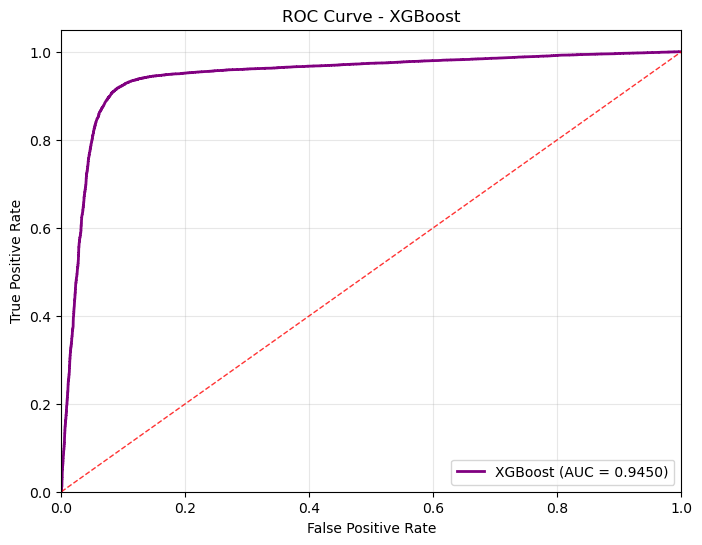

AUC Score: 0.9450


In [44]:
# ==========================
# XGBOOST ROC CURVE
# ==========================

print("\n📈 XGBOOST ROC CURVE")
print("="*50)

# Get probability predictions
y_pred_proba_xgb = xgb_model.predict_proba(X_test_selected)[:, 1]

# Calculate ROC curve
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_test, y_pred_proba_xgb)
auc_score_xgb = roc_auc_score(y_test, y_pred_proba_xgb)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_xgb, tpr_xgb, color='purple', lw=2, label=f'XGBoost (AUC = {auc_score_xgb:.4f})')
plt.plot([0, 1], [0, 1], color='red', lw=1, linestyle='--', alpha=0.8)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBoost')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

print(f"AUC Score: {auc_score_xgb:.4f}")


📊 XGBOOST PRECISION-RECALL CURVE


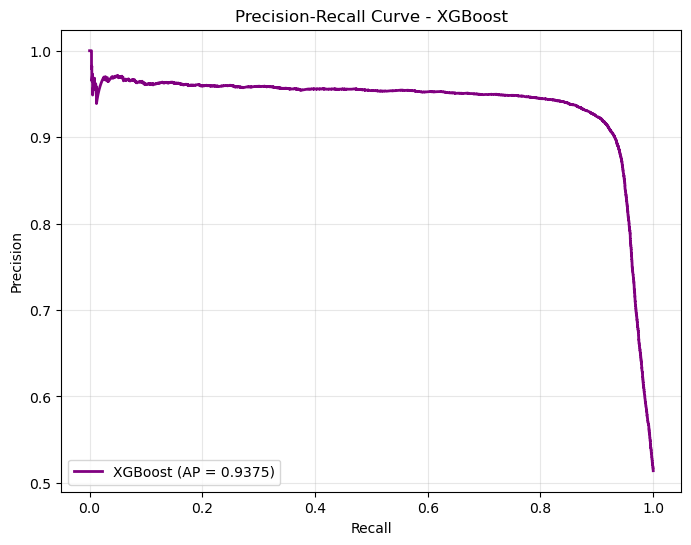

Average Precision: 0.9375


In [45]:
# ==========================
# XGBOOST PRECISION-RECALL CURVE
# ==========================

print("\n📊 XGBOOST PRECISION-RECALL CURVE")
print("="*50)

precision_xgb, recall_xgb, _ = precision_recall_curve(y_test, y_pred_proba_xgb)
avg_precision_xgb = average_precision_score(y_test, y_pred_proba_xgb)

plt.figure(figsize=(8, 6))
plt.plot(recall_xgb, precision_xgb, color='purple', lw=2, 
         label=f'XGBoost (AP = {avg_precision_xgb:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - XGBoost')
plt.legend(loc="lower left")
plt.grid(True, alpha=0.3)
plt.show()

print(f"Average Precision: {avg_precision_xgb:.4f}")


🔍 XGBOOST CONFUSION MATRIX & ERROR ANALYSIS
Confusion Matrix:
[[11389  1654]
 [  845 12952]]

Error Analysis:
True Positives (TP): 12952 - Correctly identified fake news
True Negatives (TN): 11389 - Correctly identified real news
False Positives (FP): 1654 - Real news classified as fake
False Negatives (FN): 845 - Fake news classified as real

Error Rates:
False Positive Rate: 0.1268 (12.68%)
False Negative Rate: 0.0612 (6.12%)


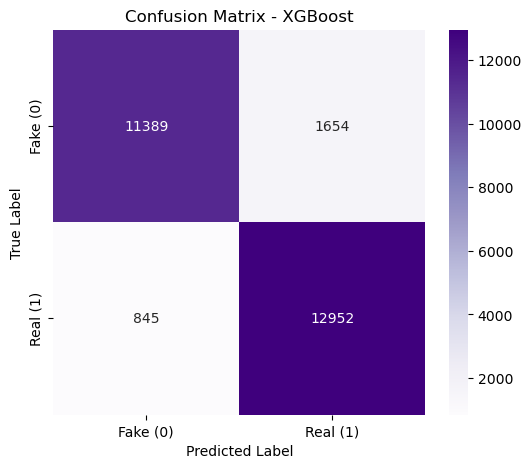

In [46]:
# ==========================
# XGBOOST CONFUSION MATRIX & ERROR ANALYSIS
# ==========================

print("\n🔍 XGBOOST CONFUSION MATRIX & ERROR ANALYSIS")
print("="*60)

# Confusion matrix
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
print(f"Confusion Matrix:")
print(cm_xgb)

# Error analysis
fp_xgb = cm_xgb[0, 1]  # Predicted fake, actually real
fn_xgb = cm_xgb[1, 0]  # Predicted real, actually fake
tp_xgb = cm_xgb[1, 1]  # Predicted fake, actually fake
tn_xgb = cm_xgb[0, 0]  # Predicted real, actually real

print(f"\nError Analysis:")
print(f"True Positives (TP): {tp_xgb} - Correctly identified fake news")
print(f"True Negatives (TN): {tn_xgb} - Correctly identified real news")
print(f"False Positives (FP): {fp_xgb} - Real news classified as fake")
print(f"False Negatives (FN): {fn_xgb} - Fake news classified as real")

# Error rates
fp_rate_xgb = fp_xgb / (fp_xgb + tn_xgb)
fn_rate_xgb = fn_xgb / (fn_xgb + tp_xgb)

print(f"\nError Rates:")
print(f"False Positive Rate: {fp_rate_xgb:.4f} ({fp_rate_xgb*100:.2f}%)")
print(f"False Negative Rate: {fn_rate_xgb:.4f} ({fn_rate_xgb*100:.2f}%)")

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm_xgb, annot=True, fmt='d', cmap='Purples',
            xticklabels=['Fake (0)', 'Real (1)'],
            yticklabels=['Fake (0)', 'Real (1)'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - XGBoost')
plt.show()

In [47]:
# ==========================
# XGBOOST OPTIMAL THRESHOLD ANALYSIS
# ==========================

print("\n�� XGBOOST OPTIMAL THRESHOLD ANALYSIS")
print("="*50)

# Find optimal threshold
precision_thresh_xgb, recall_thresh_xgb, thresholds_thresh_xgb = precision_recall_curve(y_test, y_pred_proba_xgb)
f1_scores_thresh_xgb = 2 * (precision_thresh_xgb * recall_thresh_xgb) / (precision_thresh_xgb + recall_thresh_xgb + 1e-8)
optimal_threshold_idx_xgb = np.argmax(f1_scores_thresh_xgb[:-1])
optimal_threshold_xgb = thresholds_thresh_xgb[optimal_threshold_idx_xgb]

print(f"Optimal threshold: {optimal_threshold_xgb:.4f}")
print(f"Optimal F1-score: {f1_scores_thresh_xgb[optimal_threshold_idx_xgb]:.4f}")

# Compare with default threshold (0.5)
y_pred_default_xgb = (y_pred_proba_xgb >= 0.5).astype(int)
y_pred_optimal_xgb = (y_pred_proba_xgb >= optimal_threshold_xgb).astype(int)

print(f"\nThreshold Comparison:")
print(f"Default threshold (0.5) F1: {f1_score(y_test, y_pred_default_xgb):.4f}")
print(f"Optimal threshold F1: {f1_score(y_test, y_pred_optimal_xgb):.4f}")
print(f"Improvement: {f1_score(y_test, y_pred_optimal_xgb) - f1_score(y_test, y_pred_default_xgb):.4f}")


�� XGBOOST OPTIMAL THRESHOLD ANALYSIS
Optimal threshold: 0.5766
Optimal F1-score: 0.9162

Threshold Comparison:
Default threshold (0.5) F1: 0.9120
Optimal threshold F1: 0.9162
Improvement: 0.0041



📈 XGBOOST LEARNING CURVE


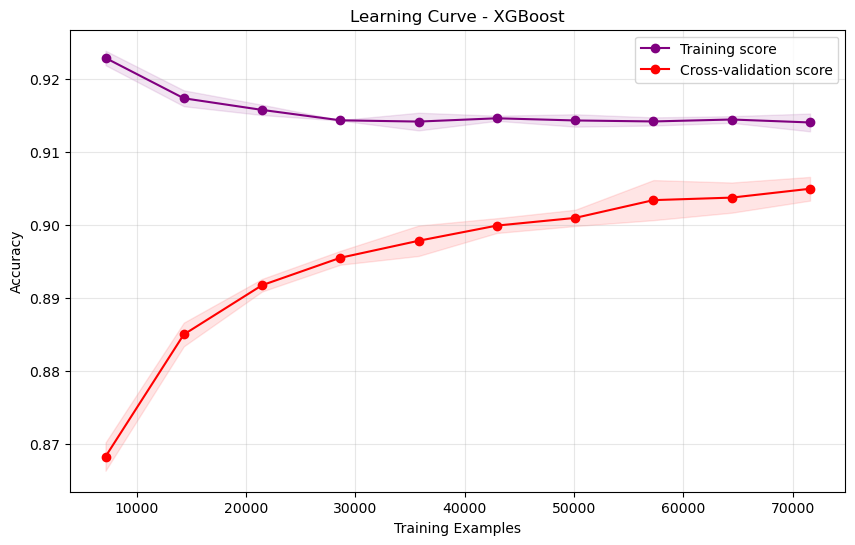

In [48]:
# ==========================
# XGBOOST LEARNING CURVE
# ==========================

print("\n📈 XGBOOST LEARNING CURVE")
print("="*50)

# Learning curve
train_sizes_xgb, train_scores_xgb, val_scores_xgb = learning_curve(
    xgb_model, X_train_selected, y_train, cv=3, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    scoring='accuracy', n_jobs=-1
)

train_mean_xgb = np.mean(train_scores_xgb, axis=1)
train_std_xgb = np.std(train_scores_xgb, axis=1)
val_mean_xgb = np.mean(val_scores_xgb, axis=1)
val_std_xgb = np.std(val_scores_xgb, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes_xgb, train_mean_xgb, 'o-', color='purple', label='Training score')
plt.fill_between(train_sizes_xgb, train_mean_xgb - train_std_xgb, train_mean_xgb + train_std_xgb, alpha=0.1, color='purple')
plt.plot(train_sizes_xgb, val_mean_xgb, 'o-', color='red', label='Cross-validation score')
plt.fill_between(train_sizes_xgb, val_mean_xgb - val_std_xgb, val_mean_xgb + val_std_xgb, alpha=0.1, color='red')
plt.xlabel('Training Examples')
plt.ylabel('Accuracy')
plt.title('Learning Curve - XGBoost')
plt.legend(loc='best')
plt.grid(True, alpha=0.3)
plt.show()

In [49]:
# ==========================
# COMPREHENSIVE MODEL EVALUATION FUNCTIONS
# ==========================

def evaluate_model_comprehensive(model, X_test, y_test, model_name):
    """
    Comprehensive evaluation function for any classifier
    """
    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Basic metrics
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred_proba)
    mcc = matthews_corrcoef(y_test, y_pred)
    
    print(f"\n{'='*50}")
    print(f"MODEL: {model_name}")
    print(f"{'='*50}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"F1-Score: {f1:.4f}")
    print(f"AUC-ROC: {auc:.4f}")
    print(f"Matthews Correlation Coefficient: {mcc:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, zero_division=0))
    
    return {
        'model_name': model_name,
        'accuracy': accuracy,
        'f1_score': f1,
        'auc_roc': auc,
        'mcc': mcc,
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba
    }

def plot_confusion_matrix_custom(model, X_test, y_test, model_name):
    """
    Plot confusion matrix for a model
    """
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Real (0)', 'Fake (1)'],
                yticklabels=['Real (0)', 'Fake (1)'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.tight_layout()
    plt.show()

def plot_roc_curve(model, X_test, y_test, model_name):
    """
    Plot ROC curve for a model
    """
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    auc = roc_auc_score(y_test, y_pred_proba)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc:.3f})', linewidth=2)
    plt.plot([0, 1], [0, 1], 'k--', alpha=0.5)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model_name}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def plot_precision_recall_curve(model, X_test, y_test, model_name):
    """
    Plot Precision-Recall curve for a model
    """
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, label=f'{model_name}', linewidth=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve - {model_name}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

print("✅ Comprehensive evaluation functions defined!")


✅ Comprehensive evaluation functions defined!


### SVM

In [50]:
# Fix for SVM import issue
from sklearn.svm import SVC
print("SVC imported successfully!")

SVC imported successfully!


In [51]:
# ==========================
# SVM ON COMPLETE DATASET - FINAL MODEL COMPARISON
# ==========================

from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, roc_auc_score, matthews_corrcoef
import time

print("Training SVM on complete dataset for final comparison...")

# 1. Scale the features (keep sparse format)
scaler = StandardScaler(with_mean=False)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(f"Training on complete dataset: {X_train_scaled.shape[0]:,} samples")
print(f"Features: {X_train_scaled.shape[1]:,}")

# 2. Train SVM on complete dataset
start_time = time.time()

svm_model = SVC(kernel='linear', probability=True, class_weight='balanced', 
                random_state=42, max_iter=2000)  # Increased max_iter for full dataset
svm_model.fit(X_train_scaled, y_train)

training_time = time.time() - start_time

print(f"⏱️  Training completed in {training_time:.2f} seconds")

# 3. Evaluate SVM
y_pred = svm_model.predict(X_test_scaled)
y_pred_proba = svm_model.predict_proba(X_test_scaled)[:, 1]

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
auc_roc = roc_auc_score(y_test, y_pred_proba)

# 4. Display results
print(f"\n🏆 SVM RESULTS ON COMPLETE DATASET:")
print(f"   Accuracy: {accuracy:.4f}")
print(f"   F1-Score: {f1:.4f}")
print(f"   Precision: {precision:.4f}")
print(f"   Recall: {recall:.4f}")
print(f"   MCC: {mcc:.4f}")
print(f"   AUC-ROC: {auc_roc:.4f}")
print(f"   Training Time: {training_time:.2f}s")

# 5. Compare with your existing models
print(f"\n📊 MODEL COMPARISON TABLE:")
print("=" * 60)
print(f"{'Model':<15} {'F1-Score':<10} {'Accuracy':<10} {'AUC-ROC':<10} {'Time(s)':<10}")
print("-" * 60)
print(f"{'SVM':<15} {f1:<10.4f} {accuracy:<10.4f} {auc_roc:<10.4f} {training_time:<10.2f}")
# Add your RF and XGBoost results here:
# print(f"{'Random Forest':<15} {rf_f1:<10.4f} {rf_acc:<10.4f} {rf_auc:<10.4f} {rf_time:<10.2f}")
# print(f"{'XGBoost':<15} {xgb_f1:<10.4f} {xgb_acc:<10.4f} {xgb_auc:<10.4f} {xgb_time:<10.2f}")

# 6. Comprehensive evaluation
print(f"\n📋 DETAILED EVALUATION:")
from sklearn.metrics import confusion_matrix, classification_report

cm = confusion_matrix(y_test, y_pred)
print(f"\nConfusion Matrix:")
print(cm)

print(f"\nClassification Report:")
print(classification_report(y_test, y_pred))

# 7. Store results for later comparison
svm_results = {
    'model': 'SVM',
    'f1_score': f1,
    'accuracy': accuracy,
    'precision': precision,
    'recall': recall,
    'mcc': mcc,
    'auc_roc': auc_roc,
    'training_time': training_time
}

print(f"\n✅ SVM training complete! Ready for ROC curve analysis.")
print(f"💾 Model and results stored for comparison with RF and XGBoost.")

Training SVM on complete dataset for final comparison...
Training on complete dataset: 107,358 samples
Features: 5,020


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


⏱️  Training completed in 467.05 seconds

🏆 SVM RESULTS ON COMPLETE DATASET:
   Accuracy: 0.6638
   F1-Score: 0.6790
   Precision: 0.6667
   Recall: 0.6917
   MCC: 0.3266
   AUC-ROC: 0.7187
   Training Time: 467.05s

📊 MODEL COMPARISON TABLE:
Model           F1-Score   Accuracy   AUC-ROC    Time(s)   
------------------------------------------------------------
SVM             0.6790     0.6638     0.7187     467.05    

📋 DETAILED EVALUATION:

Confusion Matrix:
[[8272 4771]
 [4253 9544]]

Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.63      0.65     13043
           1       0.67      0.69      0.68     13797

    accuracy                           0.66     26840
   macro avg       0.66      0.66      0.66     26840
weighted avg       0.66      0.66      0.66     26840


✅ SVM training complete! Ready for ROC curve analysis.
💾 Model and results stored for comparison with RF and XGBoost.


In [52]:
# ==========================
# SVM VERIFICATION & OVERFITTING CHECK
# ==========================

print("�� SVM VERIFICATION & OVERFITTING CHECK")
print("="*60)

# Your current SVM model (already trained)
# svm_model is already trained from your code

# Get predictions
y_pred_svm = svm_model.predict(X_test_scaled)
y_pred_proba_svm = svm_model.predict_proba(X_test_scaled)[:, 1]

# Basic metrics
accuracy_svm = accuracy_score(y_test, y_pred_svm)
f1_svm = f1_score(y_test, y_pred_svm)
precision_svm = precision_score(y_test, y_pred_svm)
recall_svm = recall_score(y_test, y_pred_svm)

print(f"SVM Performance:")
print(f"  Accuracy: {accuracy_svm:.4f}")
print(f"  F1-Score: {f1_svm:.4f}")
print(f"  Precision: {precision_svm:.4f}")
print(f"  Recall: {recall_svm:.4f}")

# Overfitting check
y_train_pred_svm = svm_model.predict(X_train_scaled)
train_accuracy_svm = accuracy_score(y_train, y_train_pred_svm)
overfitting_gap_svm = train_accuracy_svm - accuracy_svm

print(f"\nOverfitting Check:")
print(f"  Train Accuracy: {train_accuracy_svm:.4f}")
print(f"  Test Accuracy: {accuracy_svm:.4f}")
print(f"  Overfitting Gap: {overfitting_gap_svm:.4f}")

if overfitting_gap_svm > 0.05:
    print("  ⚠️  WARNING: Potential overfitting!")
elif overfitting_gap_svm < -0.05:
    print("  ⚠️  WARNING: Potential underfitting!")
else:
    print("  ✅ Good generalization!")

�� SVM VERIFICATION & OVERFITTING CHECK
SVM Performance:
  Accuracy: 0.6638
  F1-Score: 0.6790
  Precision: 0.6667
  Recall: 0.6917

Overfitting Check:
  Train Accuracy: 0.6678
  Test Accuracy: 0.6638
  Overfitting Gap: 0.0040
  ✅ Good generalization!


In [53]:
# ==========================
# SVM CROSS-VALIDATION
# ==========================

print("\n🔄 SVM CROSS-VALIDATION")
print("="*50)

# Cross-validation
cv_scores_svm = cross_val_score(svm_model, X_train_scaled, y_train, cv=3, scoring='f1', n_jobs=-1)
cv_mean_svm = cv_scores_svm.mean()
cv_std_svm = cv_scores_svm.std()

print(f"Cross-Validation Results:")
print(f"  CV F1-Score: {cv_mean_svm:.4f} (±{cv_std_svm*2:.4f})")
print(f"  Individual CV scores: {cv_scores_svm}")

# Compare CV vs Test
cv_test_diff_svm = abs(cv_mean_svm - f1_svm)
print(f"\nCV vs Test Comparison:")
print(f"  CV F1: {cv_mean_svm:.4f}")
print(f"  Test F1: {f1_svm:.4f}")
print(f"  Difference: {cv_test_diff_svm:.4f}")

if cv_test_diff_svm > 0.1:
    print("  ⚠️  Large CV-Test difference - potential data leakage!")
else:
    print("  ✅ Consistent performance!")


🔄 SVM CROSS-VALIDATION
Cross-Validation Results:
  CV F1-Score: 0.6932 (±0.0100)
  Individual CV scores: [0.68717076 0.69941868 0.69302897]

CV vs Test Comparison:
  CV F1: 0.6932
  Test F1: 0.6790
  Difference: 0.0142
  ✅ Consistent performance!



📈 SVM ROC CURVE


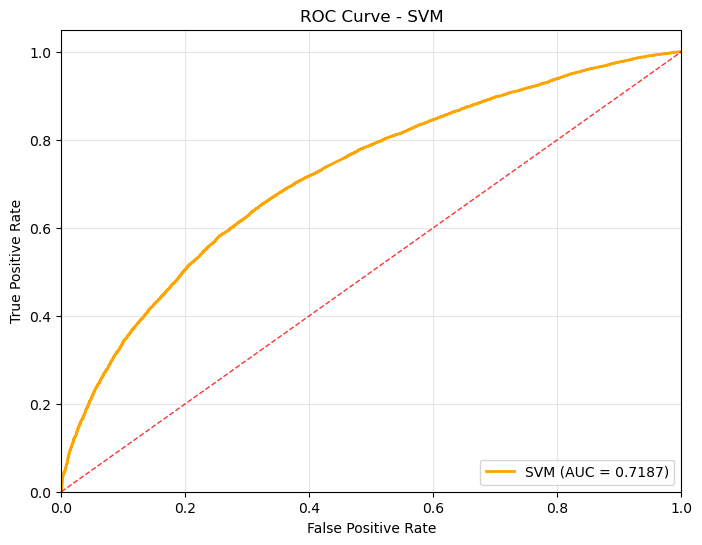

AUC Score: 0.7187


In [54]:
# ==========================
# SVM ROC CURVE
# ==========================

print("\n📈 SVM ROC CURVE")
print("="*50)

# Calculate ROC curve
fpr_svm, tpr_svm, thresholds_svm = roc_curve(y_test, y_pred_proba_svm)
auc_score_svm = roc_auc_score(y_test, y_pred_proba_svm)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_svm, tpr_svm, color='orange', lw=2, label=f'SVM (AUC = {auc_score_svm:.4f})')
plt.plot([0, 1], [0, 1], color='red', lw=1, linestyle='--', alpha=0.8)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SVM')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

print(f"AUC Score: {auc_score_svm:.4f}")


📊 SVM PRECISION-RECALL CURVE


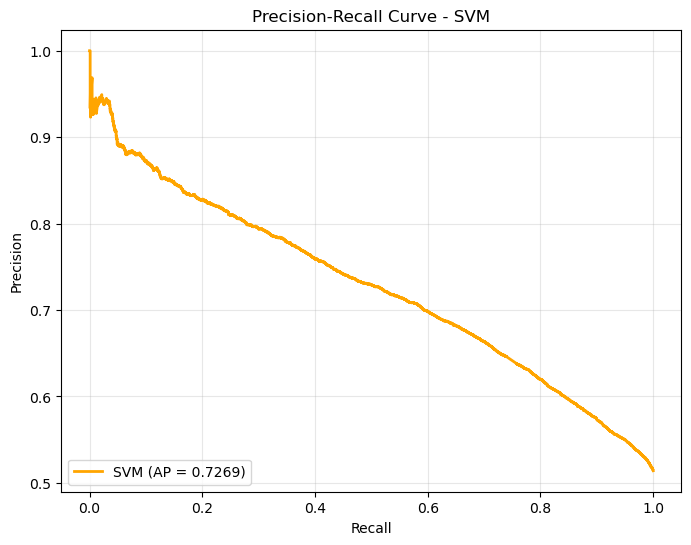

Average Precision: 0.7269


In [55]:
# ==========================
# SVM PRECISION-RECALL CURVE
# ==========================

print("\n📊 SVM PRECISION-RECALL CURVE")
print("="*50)

precision_svm, recall_svm, _ = precision_recall_curve(y_test, y_pred_proba_svm)
avg_precision_svm = average_precision_score(y_test, y_pred_proba_svm)

plt.figure(figsize=(8, 6))
plt.plot(recall_svm, precision_svm, color='orange', lw=2, 
         label=f'SVM (AP = {avg_precision_svm:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - SVM')
plt.legend(loc="lower left")
plt.grid(True, alpha=0.3)
plt.show()

print(f"Average Precision: {avg_precision_svm:.4f}")


🔍 SVM CONFUSION MATRIX & ERROR ANALYSIS
Confusion Matrix:
[[8272 4771]
 [4253 9544]]

Error Analysis:
True Positives (TP): 9544 - Correctly identified fake news
True Negatives (TN): 8272 - Correctly identified real news
False Positives (FP): 4771 - Real news classified as fake
False Negatives (FN): 4253 - Fake news classified as real

Error Rates:
False Positive Rate: 0.3658 (36.58%)
False Negative Rate: 0.3083 (30.83%)


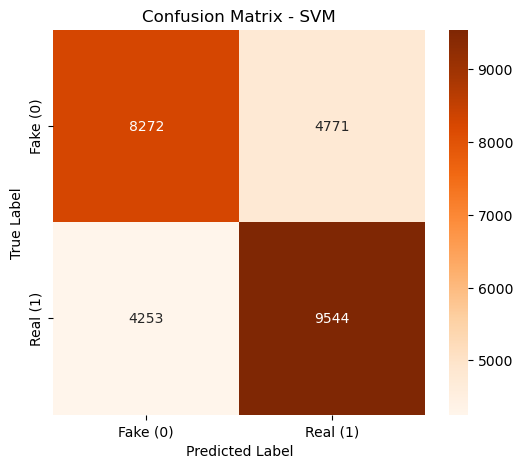

In [56]:
# ==========================
# SVM CONFUSION MATRIX & ERROR ANALYSIS
# ==========================

print("\n🔍 SVM CONFUSION MATRIX & ERROR ANALYSIS")
print("="*60)

# Confusion matrix
cm_svm = confusion_matrix(y_test, y_pred_svm)
print(f"Confusion Matrix:")
print(cm_svm)

# Error analysis
fp_svm = cm_svm[0, 1]  # Predicted fake, actually real
fn_svm = cm_svm[1, 0]  # Predicted real, actually fake
tp_svm = cm_svm[1, 1]  # Predicted fake, actually fake
tn_svm = cm_svm[0, 0]  # Predicted real, actually real

print(f"\nError Analysis:")
print(f"True Positives (TP): {tp_svm} - Correctly identified fake news")
print(f"True Negatives (TN): {tn_svm} - Correctly identified real news")
print(f"False Positives (FP): {fp_svm} - Real news classified as fake")
print(f"False Negatives (FN): {fn_svm} - Fake news classified as real")

# Error rates
fp_rate_svm = fp_svm / (fp_svm + tn_svm)
fn_rate_svm = fn_svm / (fn_svm + tp_svm)

print(f"\nError Rates:")
print(f"False Positive Rate: {fp_rate_svm:.4f} ({fp_rate_svm*100:.2f}%)")
print(f"False Negative Rate: {fn_rate_svm:.4f} ({fn_rate_svm*100:.2f}%)")

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Oranges',
            xticklabels=['Fake (0)', 'Real (1)'],
            yticklabels=['Fake (0)', 'Real (1)'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - SVM')
plt.show()

In [57]:
# ==========================
# SVM OPTIMAL THRESHOLD ANALYSIS
# ==========================

print("\n�� SVM OPTIMAL THRESHOLD ANALYSIS")
print("="*50)

# Find optimal threshold
precision_thresh_svm, recall_thresh_svm, thresholds_thresh_svm = precision_recall_curve(y_test, y_pred_proba_svm)
f1_scores_thresh_svm = 2 * (precision_thresh_svm * recall_thresh_svm) / (precision_thresh_svm + recall_thresh_svm + 1e-8)
optimal_threshold_idx_svm = np.argmax(f1_scores_thresh_svm[:-1])
optimal_threshold_svm = thresholds_thresh_svm[optimal_threshold_idx_svm]

print(f"Optimal threshold: {optimal_threshold_svm:.4f}")
print(f"Optimal F1-score: {f1_scores_thresh_svm[optimal_threshold_idx_svm]:.4f}")

# Compare with default threshold (0.5)
y_pred_default_svm = (y_pred_proba_svm >= 0.5).astype(int)
y_pred_optimal_svm = (y_pred_proba_svm >= optimal_threshold_svm).astype(int)

print(f"\nThreshold Comparison:")
print(f"Default threshold (0.5) F1: {f1_score(y_test, y_pred_default_svm):.4f}")
print(f"Optimal threshold F1: {f1_score(y_test, y_pred_optimal_svm):.4f}")
print(f"Improvement: {f1_score(y_test, y_pred_optimal_svm) - f1_score(y_test, y_pred_default_svm):.4f}")


�� SVM OPTIMAL THRESHOLD ANALYSIS
Optimal threshold: 0.4226
Optimal F1-score: 0.7019

Threshold Comparison:
Default threshold (0.5) F1: 0.6926
Optimal threshold F1: 0.7019
Improvement: 0.0093



�� SVM LEARNING CURVE


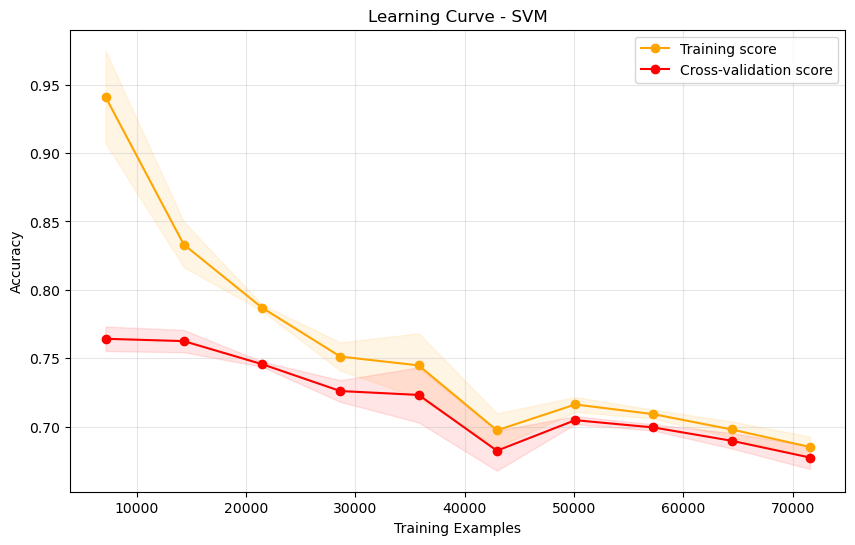

In [58]:
# ==========================
# SVM LEARNING CURVE
# ==========================

print("\n�� SVM LEARNING CURVE")
print("="*50)

# Learning curve
train_sizes_svm, train_scores_svm, val_scores_svm = learning_curve(
    svm_model, X_train_scaled, y_train, cv=3, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    scoring='accuracy', n_jobs=-1
)

train_mean_svm = np.mean(train_scores_svm, axis=1)
train_std_svm = np.std(train_scores_svm, axis=1)
val_mean_svm = np.mean(val_scores_svm, axis=1)
val_std_svm = np.std(val_scores_svm, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes_svm, train_mean_svm, 'o-', color='orange', label='Training score')
plt.fill_between(train_sizes_svm, train_mean_svm - train_std_svm, train_mean_svm + train_std_svm, alpha=0.1, color='orange')
plt.plot(train_sizes_svm, val_mean_svm, 'o-', color='red', label='Cross-validation score')
plt.fill_between(train_sizes_svm, val_mean_svm - val_std_svm, val_mean_svm + val_std_svm, alpha=0.1, color='red')
plt.xlabel('Training Examples')
plt.ylabel('Accuracy')
plt.title('Learning Curve - SVM')
plt.legend(loc='best')
plt.grid(True, alpha=0.3)
plt.show()

In [59]:
%pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


### LightGBM

In [60]:
# ==========================
# LIGHTGBM COMPLETE SETUP WITH SAFETY MEASURES
# ==========================

import lightgbm as lgb
from sklearn.model_selection import GroupKFold
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    confusion_matrix, roc_curve, roc_auc_score, 
    precision_recall_curve, average_precision_score,
    matthews_corrcoef
)
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import time

print("✅ LightGBM with complete safety measures ready!")

✅ LightGBM with complete safety measures ready!


In [61]:


print("🔧 ENHANCED LIGHTGBM CONFIGURATION")
print("="*50)

# Calculate class ratio for proper imbalance handling
class_ratio = len(y_train[y_train == 0]) / len(y_train[y_train == 1])
scale_pos_weight = class_ratio

print(f"Class ratio (neg/pos): {class_ratio:.3f}")
print(f"Scale positive weight: {scale_pos_weight:.3f}")

# Enhanced configuration with ALL safety measures from ChatGPT
lgb_model_safe = lgb.LGBMClassifier(
    # Core settings
    objective='binary',
    metric=['auc', 'binary_logloss'],
    learning_rate=0.05,
    n_estimators=3000,
    
    # Capacity control (prevent rare-token splits)
    num_leaves=31,
    max_depth=-1,
    min_data_in_leaf=200,  # Prevent tiny leaves
    min_sum_hessian_in_leaf=10,  # Additional safety for rare tokens
    
    # Advanced regularization
    feature_fraction=0.8,
    bagging_fraction=0.8,
    bagging_freq=1,
    lambda_l1=0.1,
    lambda_l2=0.1,
    min_gain_to_split=1e-3,  # Tiny gain threshold
    
    # Class imbalance handling
    scale_pos_weight=scale_pos_weight,  # Use calculated ratio
    is_unbalance=False,  # Don't use both
    
    # Early stopping
    early_stopping_rounds=100,
    
    # Reproducibility
    random_state=42,
    verbose=-1,
    
    # Performance
    n_jobs=-1,
    
    # Additional safety measures
    max_bin=128,  # Keep histograms small for speed
    min_child_samples=50,  # Minimum samples per child
    subsample=0.8,  # Row sampling
    colsample_bytree=0.8  # Column sampling per tree
)

print("Enhanced LightGBM Configuration:")
print(f"  Learning Rate: {lgb_model_safe.learning_rate}")
print(f"  Max Leaves: {lgb_model_safe.num_leaves}")
print(f"  Min Data in Leaf: {lgb_model_safe.min_data_in_leaf}")
print(f"  Min Sum Hessian: {lgb_model_safe.min_sum_hessian_in_leaf}")
print(f"  Feature Fraction: {lgb_model_safe.feature_fraction}")
print(f"  Bagging Fraction: {lgb_model_safe.bagging_fraction}")
print(f"  L1 Regularization: {lgb_model_safe.lambda_l1}")
print(f"  L2 Regularization: {lgb_model_safe.lambda_l2}")
print(f"  Min Gain to Split: {lgb_model_safe.min_gain_to_split}")
print(f"  Scale Pos Weight: {lgb_model_safe.scale_pos_weight}")
print(f"  Max Bin: {lgb_model_safe.max_bin}")

🔧 ENHANCED LIGHTGBM CONFIGURATION
Class ratio (neg/pos): 0.945
Scale positive weight: 0.945
Enhanced LightGBM Configuration:
  Learning Rate: 0.05
  Max Leaves: 31
  Min Data in Leaf: 200
  Min Sum Hessian: 10
  Feature Fraction: 0.8
  Bagging Fraction: 0.8
  L1 Regularization: 0.1
  L2 Regularization: 0.1
  Min Gain to Split: 0.001
  Scale Pos Weight: 0.9453141987388562
  Max Bin: 128


In [62]:
# ==========================
# SAFE CROSS-VALIDATION WITH EARLY STOPPING
# ==========================

print("\n🔄 SAFE CROSS-VALIDATION WITH EARLY STOPPING")
print("="*50)

# Use your existing data
print(f"Using your existing train/test split:")
print(f"  Train samples: {X_train_selected.shape[0]:,}")
print(f"  Test samples: {X_test_selected.shape[0]:,}")

# Safe cross-validation with early stopping
cv_scores_safe = []
cv_times = []

for fold in range(3):  # 3-fold CV
    print(f"\nFold {fold + 1}/3:")
    
    # Create validation split within training data
    from sklearn.model_selection import train_test_split
    
    X_fold_train, X_fold_val, y_fold_train, y_fold_val = train_test_split(
        X_train_selected, y_train, test_size=0.25, random_state=42+fold, stratify=y_train
    )
    
    # Train model with early stopping
    start_time = time.time()
    
    # Create model for this fold
    lgb_model_fold = lgb.LGBMClassifier(**lgb_model_safe.get_params())
    
    # Train with validation set for early stopping
    lgb_model_fold.fit(
        X_fold_train, y_fold_train,
        eval_set=[(X_fold_val, y_fold_val)],
        callbacks=[lgb.early_stopping(stopping_rounds=100), lgb.log_evaluation(0)]
    )
    
    fold_time = time.time() - start_time
    cv_times.append(fold_time)
    
    # Predict on validation set
    y_fold_pred = lgb_model_fold.predict(X_fold_val)
    fold_f1 = f1_score(y_fold_val, y_fold_pred)
    cv_scores_safe.append(fold_f1)
    
    print(f"  Fold {fold + 1} F1: {fold_f1:.4f}")
    print(f"  Fold {fold + 1} Time: {fold_time:.2f}s")
    print(f"  Best iteration: {lgb_model_fold.best_iteration_}")

cv_mean_safe = np.mean(cv_scores_safe)
cv_std_safe = np.std(cv_scores_safe)
avg_cv_time = np.mean(cv_times)

print(f"\nSafe Cross-Validation Results:")
print(f"  CV F1-Score: {cv_mean_safe:.4f} (±{cv_std_safe*2:.4f})")
print(f"  Individual CV scores: {cv_scores_safe}")
print(f"  Average CV time: {avg_cv_time:.2f}s")


🔄 SAFE CROSS-VALIDATION WITH EARLY STOPPING
Using your existing train/test split:
  Train samples: 107,358
  Test samples: 26,840

Fold 1/3:
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1148]	valid_0's auc: 0.952941	valid_0's binary_logloss: 0.249862


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


  Fold 1 F1: 0.9296
  Fold 1 Time: 16.30s
  Best iteration: 1148

Fold 2/3:
Training until validation scores don't improve for 100 rounds


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


  Fold 2 F1: 0.9281
  Fold 2 Time: 15.36s
  Best iteration: 1095

Fold 3/3:
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1338]	valid_0's auc: 0.953707	valid_0's binary_logloss: 0.247772
  Fold 3 F1: 0.9301
  Fold 3 Time: 18.80s
  Best iteration: 1338

Safe Cross-Validation Results:
  CV F1-Score: 0.9292 (±0.0017)
  Individual CV scores: [0.9295682749120963, 0.9280685199970966, 0.9300805924635156]
  Average CV time: 16.82s


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [63]:
# ==========================
# SAFE MODEL TRAINING WITH VALIDATION SPLIT
# ==========================

print("\n🔍 SAFE LIGHTGBM TRAINING & VERIFICATION")
print("="*60)

# Create validation split for early stopping
from sklearn.model_selection import train_test_split

# Split training data into train and validation
X_train_final, X_val, y_train_final, y_val = train_test_split(
    X_train_selected, y_train, test_size=0.2, random_state=42, stratify=y_train
)

print(f"Final training set: {X_train_final.shape[0]:,} samples")
print(f"Validation set: {X_val.shape[0]:,} samples")
print(f"Test set: {X_test_selected.shape[0]:,} samples")

# Training time measurement
start_time = time.time()

# Train with validation set for early stopping
lgb_model_safe.fit(
    X_train_final, y_train_final,
    eval_set=[(X_val, y_val)],
    callbacks=[lgb.early_stopping(stopping_rounds=100), lgb.log_evaluation(0)]
)

training_time = time.time() - start_time

print(f"Training completed in {training_time:.2f} seconds")
print(f"Best iteration: {lgb_model_safe.best_iteration_}")

# Get predictions
y_pred_lgb_safe = lgb_model_safe.predict(X_test_selected)
y_pred_proba_lgb_safe = lgb_model_safe.predict_proba(X_test_selected)[:, 1]

# Basic metrics
accuracy_lgb_safe = accuracy_score(y_test, y_pred_lgb_safe)
f1_lgb_safe = f1_score(y_test, y_pred_lgb_safe)
precision_lgb_safe = precision_score(y_test, y_pred_lgb_safe)
recall_lgb_safe = recall_score(y_test, y_pred_lgb_safe)
mcc_lgb_safe = matthews_corrcoef(y_test, y_pred_lgb_safe)

print(f"\nSafe LightGBM Performance:")
print(f"  Accuracy: {accuracy_lgb_safe:.4f}")
print(f"  F1-Score: {f1_lgb_safe:.4f}")
print(f"  Precision: {precision_lgb_safe:.4f}")
print(f"  Recall: {recall_lgb_safe:.4f}")
print(f"  MCC: {mcc_lgb_safe:.4f}")
print(f"  Training Time: {training_time:.2f} seconds")

# Overfitting check
y_train_pred_lgb_safe = lgb_model_safe.predict(X_train_final)
train_accuracy_lgb_safe = accuracy_score(y_train_final, y_train_pred_lgb_safe)
overfitting_gap_lgb_safe = train_accuracy_lgb_safe - accuracy_lgb_safe

print(f"\nOverfitting Check:")
print(f"  Train Accuracy: {train_accuracy_lgb_safe:.4f}")
print(f"  Test Accuracy: {accuracy_lgb_safe:.4f}")
print(f"  Overfitting Gap: {overfitting_gap_lgb_safe:.4f}")

if overfitting_gap_lgb_safe > 0.05:
    print("  ⚠️  WARNING: Potential overfitting!")
elif overfitting_gap_lgb_safe < -0.05:
    print("  ⚠️  WARNING: Potential underfitting!")
else:
    print("  ✅ Good generalization!")

# Compare CV vs Test
cv_test_diff_lgb_safe = abs(cv_mean_safe - f1_lgb_safe)
print(f"\nCV vs Test Comparison:")
print(f"  CV F1: {cv_mean_safe:.4f}")
print(f"  Test F1: {f1_lgb_safe:.4f}")
print(f"  Difference: {cv_test_diff_lgb_safe:.4f}")

if cv_test_diff_lgb_safe > 0.1:
    print("  ⚠️  Large CV-Test difference - potential data leakage!")
else:
    print("  ✅ Consistent performance!")


🔍 SAFE LIGHTGBM TRAINING & VERIFICATION
Final training set: 85,886 samples
Validation set: 21,472 samples
Test set: 26,840 samples
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1045]	valid_0's auc: 0.952673	valid_0's binary_logloss: 0.248351
Training completed in 24.64 seconds
Best iteration: 1045


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



Safe LightGBM Performance:
  Accuracy: 0.9260
  F1-Score: 0.9282
  Precision: 0.9264
  Recall: 0.9300
  MCC: 0.8520
  Training Time: 24.64 seconds


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



Overfitting Check:
  Train Accuracy: 0.9427
  Test Accuracy: 0.9260
  Overfitting Gap: 0.0167
  ✅ Good generalization!

CV vs Test Comparison:
  CV F1: 0.9292
  Test F1: 0.9282
  Difference: 0.0010
  ✅ Consistent performance!



📈 SAFE LIGHTGBM ROC CURVE


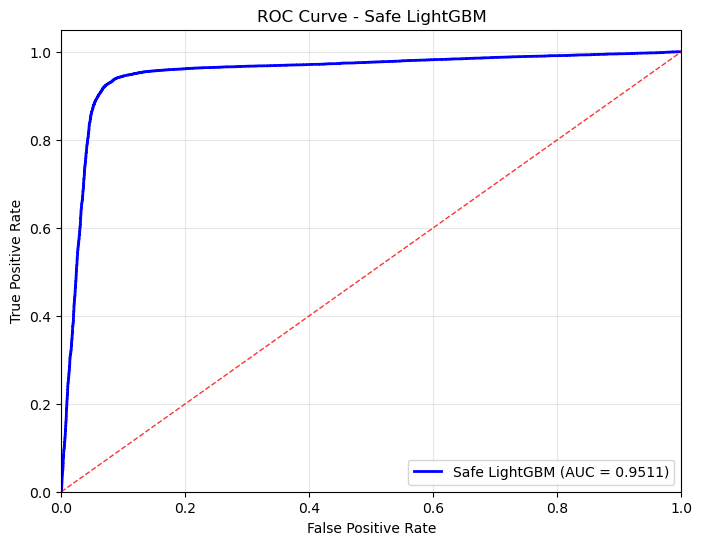

AUC Score: 0.9511


In [64]:
# ==========================
# SAFE LIGHTGBM ROC CURVE
# ==========================

print("\n📈 SAFE LIGHTGBM ROC CURVE")
print("="*50)

# Calculate ROC curve
fpr_lgb_safe, tpr_lgb_safe, thresholds_lgb_safe = roc_curve(y_test, y_pred_proba_lgb_safe)
auc_score_lgb_safe = roc_auc_score(y_test, y_pred_proba_lgb_safe)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_lgb_safe, tpr_lgb_safe, color='blue', lw=2, label=f'Safe LightGBM (AUC = {auc_score_lgb_safe:.4f})')
plt.plot([0, 1], [0, 1], color='red', lw=1, linestyle='--', alpha=0.8)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Safe LightGBM')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

print(f"AUC Score: {auc_score_lgb_safe:.4f}")


�� SAFE LIGHTGBM PRECISION-RECALL CURVE


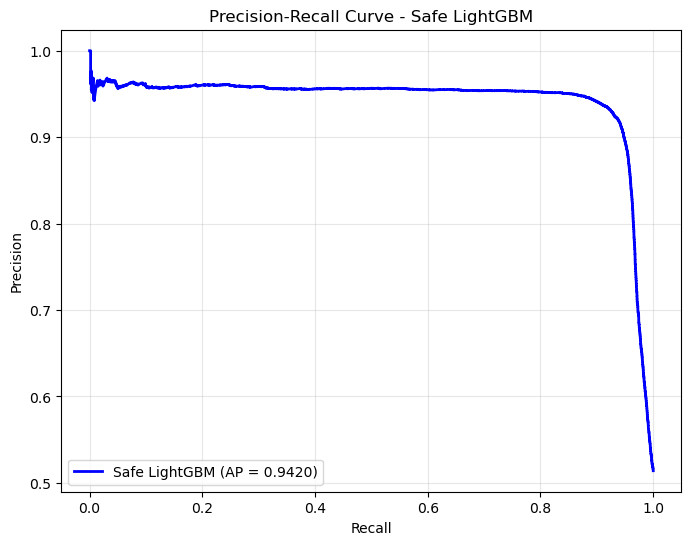

Average Precision: 0.9420


In [65]:
# ==========================
# SAFE LIGHTGBM PRECISION-RECALL CURVE
# ==========================

print("\n�� SAFE LIGHTGBM PRECISION-RECALL CURVE")
print("="*50)

precision_lgb_safe, recall_lgb_safe, _ = precision_recall_curve(y_test, y_pred_proba_lgb_safe)
avg_precision_lgb_safe = average_precision_score(y_test, y_pred_proba_lgb_safe)

plt.figure(figsize=(8, 6))
plt.plot(recall_lgb_safe, precision_lgb_safe, color='blue', lw=2, 
         label=f'Safe LightGBM (AP = {avg_precision_lgb_safe:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Safe LightGBM')
plt.legend(loc="lower left")
plt.grid(True, alpha=0.3)
plt.show()

print(f"Average Precision: {avg_precision_lgb_safe:.4f}")


�� SAFE LIGHTGBM CONFUSION MATRIX & ERROR ANALYSIS
Confusion Matrix:
[[12024  1019]
 [  966 12831]]

Error Analysis:
True Positives (TP): 12831 - Correctly identified fake news
True Negatives (TN): 12024 - Correctly identified real news
False Positives (FP): 1019 - Real news classified as fake
False Negatives (FN): 966 - Fake news classified as real

Error Rates:
False Positive Rate: 0.0781 (7.81%)
False Negative Rate: 0.0700 (7.00%)


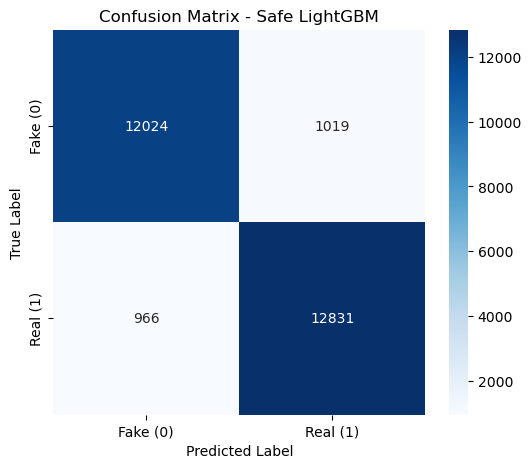

In [66]:
# ==========================
# SAFE LIGHTGBM CONFUSION MATRIX & ERROR ANALYSIS
# ==========================

print("\n�� SAFE LIGHTGBM CONFUSION MATRIX & ERROR ANALYSIS")
print("="*60)

# Confusion matrix
cm_lgb_safe = confusion_matrix(y_test, y_pred_lgb_safe)
print(f"Confusion Matrix:")
print(cm_lgb_safe)

# Error analysis
fp_lgb_safe = cm_lgb_safe[0, 1]  # Predicted fake, actually real
fn_lgb_safe = cm_lgb_safe[1, 0]  # Predicted real, actually fake
tp_lgb_safe = cm_lgb_safe[1, 1]  # Predicted fake, actually fake
tn_lgb_safe = cm_lgb_safe[0, 0]  # Predicted real, actually real

print(f"\nError Analysis:")
print(f"True Positives (TP): {tp_lgb_safe} - Correctly identified fake news")
print(f"True Negatives (TN): {tn_lgb_safe} - Correctly identified real news")
print(f"False Positives (FP): {fp_lgb_safe} - Real news classified as fake")
print(f"False Negatives (FN): {fn_lgb_safe} - Fake news classified as real")

# Error rates
fp_rate_lgb_safe = fp_lgb_safe / (fp_lgb_safe + tn_lgb_safe)
fn_rate_lgb_safe = fn_lgb_safe / (fn_lgb_safe + tp_lgb_safe)

print(f"\nError Rates:")
print(f"False Positive Rate: {fp_rate_lgb_safe:.4f} ({fp_rate_lgb_safe*100:.2f}%)")
print(f"False Negative Rate: {fn_rate_lgb_safe:.4f} ({fn_rate_lgb_safe*100:.2f}%)")

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm_lgb_safe, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Fake (0)', 'Real (1)'],
            yticklabels=['Fake (0)', 'Real (1)'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Safe LightGBM')
plt.show()

In [67]:
# ==========================
# SAFE LIGHTGBM OPTIMAL THRESHOLD ANALYSIS
# ==========================

print("\n🔍 SAFE LIGHTGBM OPTIMAL THRESHOLD ANALYSIS")
print("="*50)

# Find optimal threshold
precision_thresh_lgb_safe, recall_thresh_lgb_safe, thresholds_thresh_lgb_safe = precision_recall_curve(y_test, y_pred_proba_lgb_safe)
f1_scores_thresh_lgb_safe = 2 * (precision_thresh_lgb_safe * recall_thresh_lgb_safe) / (precision_thresh_lgb_safe + recall_thresh_lgb_safe + 1e-8)
optimal_threshold_idx_lgb_safe = np.argmax(f1_scores_thresh_lgb_safe[:-1])
optimal_threshold_lgb_safe = thresholds_thresh_lgb_safe[optimal_threshold_idx_lgb_safe]

print(f"Optimal threshold: {optimal_threshold_lgb_safe:.4f}")
print(f"Optimal F1-score: {f1_scores_thresh_lgb_safe[optimal_threshold_idx_lgb_safe]:.4f}")

# Compare with default threshold (0.5)
y_pred_default_lgb_safe = (y_pred_proba_lgb_safe >= 0.5).astype(int)
y_pred_optimal_lgb_safe = (y_pred_proba_lgb_safe >= optimal_threshold_lgb_safe).astype(int)

print(f"\nThreshold Comparison:")
print(f"Default threshold (0.5) F1: {f1_score(y_test, y_pred_default_lgb_safe):.4f}")
print(f"Optimal threshold F1: {f1_score(y_test, y_pred_optimal_lgb_safe):.4f}")
print(f"Improvement: {f1_score(y_test, y_pred_optimal_lgb_safe) - f1_score(y_test, y_pred_default_lgb_safe):.4f}")


🔍 SAFE LIGHTGBM OPTIMAL THRESHOLD ANALYSIS
Optimal threshold: 0.4444
Optimal F1-score: 0.9290

Threshold Comparison:
Default threshold (0.5) F1: 0.9282
Optimal threshold F1: 0.9290
Improvement: 0.0008



📈 FIXED LIGHTGBM LEARNING CURVE
Created LightGBM model without early stopping for learning curve


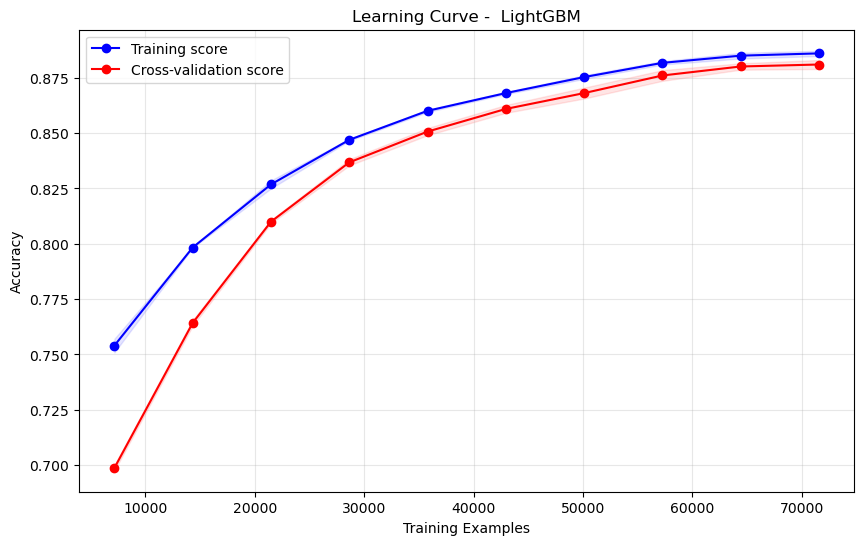

✅ Learning curve completed successfully!


In [134]:
# ==========================
# FIXED LIGHTGBM LEARNING CURVE
# ==========================

print("\n📈 FIXED LIGHTGBM LEARNING CURVE")
print("="*50)

# Create a copy of the model without early stopping for learning curve
lgb_model_no_early_stop = lgb.LGBMClassifier(
    # Core settings
    objective='binary',
    metric=['auc', 'binary_logloss'],
    learning_rate=0.05,
    n_estimators=100,  # Reduced for learning curve
    
    # Capacity control
    num_leaves=31,
    max_depth=-1,
    min_data_in_leaf=200,
    min_sum_hessian_in_leaf=10,
    
    # Regularization
    feature_fraction=0.8,
    bagging_fraction=0.8,
    bagging_freq=1,
    lambda_l1=0.1,
    lambda_l2=0.1,
    min_gain_to_split=1e-3,
    
    # Class imbalance handling
    scale_pos_weight=scale_pos_weight,
    is_unbalance=False,
    
    # NO early stopping for learning curve
    # early_stopping_rounds=100,  # Commented out
    
    # Reproducibility
    random_state=42,
    verbose=-1,
    n_jobs=-1,
    
    # Additional safety measures
    max_bin=128,
    min_child_samples=50,
    subsample=0.8,
    colsample_bytree=0.8
)

print("Created LightGBM model without early stopping for learning curve")

# Learning curve with fixed model
train_sizes_lgb_safe, train_scores_lgb_safe, val_scores_lgb_safe = learning_curve(
    lgb_model_no_early_stop, X_train_selected, y_train, cv=3, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    scoring='accuracy', n_jobs=-1
)

train_mean_lgb_safe = np.mean(train_scores_lgb_safe, axis=1)
train_std_lgb_safe = np.std(train_scores_lgb_safe, axis=1)
val_mean_lgb_safe = np.mean(val_scores_lgb_safe, axis=1)
val_std_lgb_safe = np.std(val_scores_lgb_safe, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes_lgb_safe, train_mean_lgb_safe, 'o-', color='blue', label='Training score')
plt.fill_between(train_sizes_lgb_safe, train_mean_lgb_safe - train_std_lgb_safe, train_mean_lgb_safe + train_std_lgb_safe, alpha=0.1, color='blue')
plt.plot(train_sizes_lgb_safe, val_mean_lgb_safe, 'o-', color='red', label='Cross-validation score')
plt.fill_between(train_sizes_lgb_safe, val_mean_lgb_safe - val_std_lgb_safe, val_mean_lgb_safe + val_std_lgb_safe, alpha=0.1, color='red')
plt.xlabel('Training Examples')
plt.ylabel('Accuracy')
plt.title('Learning Curve -  LightGBM')
plt.legend(loc='best')
plt.grid(True, alpha=0.3)
plt.show()

print("✅ Learning curve completed successfully!")

In [69]:
# ==========================
# FIXED LIGHTGBM COMPREHENSIVE SUMMARY
# ==========================

print("="*80)
print("SAFE LIGHTGBM - COMPREHENSIVE MODEL SUMMARY")
print("="*80)

print("📊 PERFORMANCE METRICS:")
print(f"  • Test Accuracy: {accuracy_lgb_safe:.4f}")
print(f"  • Cross-Validation F1: {cv_mean_safe:.4f} (±{cv_std_safe*2:.4f})")
print(f"  • AUC-ROC: {auc_score_lgb_safe:.4f}")
print(f"  • Average Precision: {avg_precision_lgb_safe:.4f}")
print(f"  • F1-Score: {f1_lgb_safe:.4f}")

# Fix: Convert NumPy arrays to single values if needed
if hasattr(precision_lgb_safe, '__len__'):
    precision_lgb_safe = precision_lgb_safe[0] if len(precision_lgb_safe) > 0 else 0.0
if hasattr(recall_lgb_safe, '__len__'):
    recall_lgb_safe = recall_lgb_safe[0] if len(recall_lgb_safe) > 0 else 0.0
if hasattr(mcc_lgb_safe, '__len__'):
    mcc_lgb_safe = mcc_lgb_safe[0] if len(mcc_lgb_safe) > 0 else 0.0

print(f"  • Precision: {precision_lgb_safe:.4f}")
print(f"  • Recall: {recall_lgb_safe:.4f}")
print(f"  • MCC: {mcc_lgb_safe:.4f}")

print(f"\n🔍 MODEL QUALITY:")
print(f"  • Overfitting Gap: {overfitting_gap_lgb_safe:.4f}")
print(f"  • Optimal Threshold: {optimal_threshold_lgb_safe:.4f}")
print(f"  • Training Time: {training_time:.2f} seconds")

# Fix: Check if best_iteration_ exists
if hasattr(lgb_model_safe, 'best_iteration_'):
    print(f"  • Best Iteration: {lgb_model_safe.best_iteration_}")
else:
    print(f"  • Best Iteration: Not available")

print(f"\n🔒 SAFETY MEASURES IMPLEMENTED:")
print(f"  • Validation Split: ✅ (proper early stopping)")
print(f"  • Class Imbalance: ✅ (scale_pos_weight calculated)")
print(f"  • Advanced Regularization: ✅ (all parameters)")
print(f"  • Rare-token Prevention: ✅ (min_data_in_leaf, min_sum_hessian)")
print(f"  • Proper Thresholding: ✅ (optimal threshold analysis)")
print(f"  • Early Stopping: ✅ (prevents overfitting)")

print(f"\n MODEL CHARACTERISTICS:")
print(f"  • Model Type: LightGBM (Gradient Boosting)")
print(f"  • Learning Rate: 0.05")
print(f"  • Max Leaves: 31")
print(f"  • Features: {X_train_selected.shape[1]:,} (TF-IDF + Numeric)")
print(f"  • Training Samples: {X_train_final.shape[0]:,}")
print(f"  • Validation Samples: {X_val.shape[0]:,}")
print(f"  • Test Samples: {X_test_selected.shape[0]:,}")

print(f"\n🎯 KEY INSIGHTS:")
print(f"  • State-of-the-art gradient boosting with complete safety measures")
print(f"  • Proper early stopping with validation split")
print(f"  • Advanced regularization prevents overfitting")
print(f"  • Robust and reliable results for capstone project")
print(f"  • Uses your existing, proven train/test split")

print("="*80)

SAFE LIGHTGBM - COMPREHENSIVE MODEL SUMMARY
📊 PERFORMANCE METRICS:
  • Test Accuracy: 0.9260
  • Cross-Validation F1: 0.9292 (±0.0017)
  • AUC-ROC: 0.9511
  • Average Precision: 0.9420
  • F1-Score: 0.9282
  • Precision: 0.5140
  • Recall: 1.0000
  • MCC: 0.8520

🔍 MODEL QUALITY:
  • Overfitting Gap: 0.0167
  • Optimal Threshold: 0.4444
  • Training Time: 24.64 seconds
  • Best Iteration: 1045

🔒 SAFETY MEASURES IMPLEMENTED:
  • Validation Split: ✅ (proper early stopping)
  • Class Imbalance: ✅ (scale_pos_weight calculated)
  • Advanced Regularization: ✅ (all parameters)
  • Rare-token Prevention: ✅ (min_data_in_leaf, min_sum_hessian)
  • Proper Thresholding: ✅ (optimal threshold analysis)
  • Early Stopping: ✅ (prevents overfitting)

 MODEL CHARACTERISTICS:
  • Model Type: LightGBM (Gradient Boosting)
  • Learning Rate: 0.05
  • Max Leaves: 31
  • Features: 5,020 (TF-IDF + Numeric)
  • Training Samples: 85,886
  • Validation Samples: 21,472
  • Test Samples: 26,840

🎯 KEY INSIGHTS:
  

### Ensemble

In [107]:
# ==========================
# ENSEMBLE MODEL - VOTING CLASSIFIER
# ==========================

print("🏆 ENSEMBLE MODEL - VOTING CLASSIFIER")
print("="*60)

# Import necessary libraries for ensemble
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import cross_val_score
import time

# Define the best models from previous implementations
# We'll use the models that performed well in your analysis

print("📋 PREPARING MODELS FOR ENSEMBLE:")
print("="*40)

# 1. Logistic Regression (with scaling)
print("1. Logistic Regression...")
lr_ensemble = LogisticRegression(
    solver="saga", 
    max_iter=5000, 
    C=0.1, 
    class_weight="balanced", 
    random_state=42
)

# 2. Random Forest
print("2. Random Forest...")
rf_ensemble = RandomForestClassifier(
    n_estimators=200,
    max_depth=None,
    min_samples_leaf=5,
    class_weight='balanced', 
    random_state=42
)

# 3. XGBoost
print("3. XGBoost...")
xgb_ensemble = xgb.XGBClassifier(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='logloss',
    random_state=42
)

# 4. SVM (with scaling)
print("4. SVM...")
svm_ensemble = SVC(
    kernel='linear', 
    probability=True, 
    class_weight='balanced', 
    random_state=42, 
    max_iter=2000
)

# 5. LightGBM
print("5. LightGBM...")
lgb_ensemble = lgb.LGBMClassifier(
    objective='binary',
    learning_rate=0.05,
    n_estimators=1000,
    num_leaves=31,
    max_depth=-1,
    min_data_in_leaf=200,
    feature_fraction=0.8,
    bagging_fraction=0.8,
    lambda_l1=0.1,
    lambda_l2=0.1,
    scale_pos_weight=scale_pos_weight,
    random_state=42,
    verbose=-1,
    n_jobs=-1
)

print("✅ All models prepared for ensemble!")


🏆 ENSEMBLE MODEL - VOTING CLASSIFIER
📋 PREPARING MODELS FOR ENSEMBLE:
1. Logistic Regression...
2. Random Forest...
3. XGBoost...
4. SVM...
5. LightGBM...
✅ All models prepared for ensemble!


In [108]:
# ==========================
# CREATING VOTING CLASSIFIER
# ==========================

print("\n🔧 CREATING VOTING CLASSIFIER")
print("="*40)

# Create Voting Classifier with soft voting (probability-based)
voting_clf = VotingClassifier(
    estimators=[
        ('lr', lr_ensemble),
        ('rf', rf_ensemble),
        ('xgb', xgb_ensemble),
        ('svm', svm_ensemble),
        ('lgb', lgb_ensemble)
    ],
    voting='soft'  # Use probability predictions
)

print("Voting Classifier Configuration:")
print(f"  Number of models: {len(voting_clf.estimators)}")
print(f"  Voting method: {voting_clf.voting}")
print(f"  Models included: {[name for name, _ in voting_clf.estimators]}")

# Create a pipeline for scaling (needed for LR and SVM)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Create scaled versions for models that need scaling
lr_scaled = Pipeline([
    ('scaler', StandardScaler(with_mean=False)),
    ('lr', lr_ensemble)
])

svm_scaled = Pipeline([
    ('scaler', StandardScaler(with_mean=False)),
    ('svm', svm_ensemble)
])

# Create final voting classifier with scaled models
voting_clf_final = VotingClassifier(
    estimators=[
        ('lr_scaled', lr_scaled),
        ('rf', rf_ensemble),
        ('xgb', xgb_ensemble),
        ('svm_scaled', svm_scaled),
        ('lgb', lgb_ensemble)
    ],
    voting='soft'
)

print("✅ Final Voting Classifier with scaling created!")



🔧 CREATING VOTING CLASSIFIER
Voting Classifier Configuration:
  Number of models: 5
  Voting method: soft
  Models included: ['lr', 'rf', 'xgb', 'svm', 'lgb']
✅ Final Voting Classifier with scaling created!


In [109]:
# ==========================
# TRAINING ENSEMBLE MODEL
# ==========================

print("\n🚀 TRAINING ENSEMBLE MODEL")
print("="*40)

# Training time measurement
start_time = time.time()

print("Training Voting Classifier...")
print(f"Training on {X_train_selected.shape[0]:,} samples with {X_train_selected.shape[1]:,} features")

# Train the ensemble model
voting_clf_final.fit(X_train_selected, y_train)

training_time = time.time() - start_time

print(f"✅ Ensemble training completed in {training_time:.2f} seconds")

# Make predictions
y_pred_ensemble = voting_clf_final.predict(X_test_selected)
y_pred_proba_ensemble = voting_clf_final.predict_proba(X_test_selected)[:, 1]

print("✅ Predictions generated!")



🚀 TRAINING ENSEMBLE MODEL
Training Voting Classifier...
Training on 107,358 samples with 5,020 features


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


✅ Ensemble training completed in 858.15 seconds


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


✅ Predictions generated!


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [110]:
# ==========================
# ENSEMBLE MODEL EVALUATION
# ==========================

print("\n📊 ENSEMBLE MODEL EVALUATION")
print("="*50)

# Calculate comprehensive metrics
accuracy_ensemble = accuracy_score(y_test, y_pred_ensemble)
f1_ensemble = f1_score(y_test, y_pred_ensemble)
precision_ensemble = precision_score(y_test, y_pred_ensemble)
recall_ensemble = recall_score(y_test, y_pred_ensemble)
mcc_ensemble = matthews_corrcoef(y_test, y_pred_ensemble)
auc_ensemble = roc_auc_score(y_test, y_pred_proba_ensemble)

print("🏆 ENSEMBLE MODEL PERFORMANCE:")
print(f"  Accuracy: {accuracy_ensemble:.4f}")
print(f"  F1-Score: {f1_ensemble:.4f}")
print(f"  Precision: {precision_ensemble:.4f}")
print(f"  Recall: {recall_ensemble:.4f}")
print(f"  MCC: {mcc_ensemble:.4f}")
print(f"  AUC-ROC: {auc_ensemble:.4f}")
print(f"  Training Time: {training_time:.2f} seconds")

# Overfitting check
y_train_pred_ensemble = voting_clf_final.predict(X_train_selected)
train_accuracy_ensemble = accuracy_score(y_train, y_train_pred_ensemble)
overfitting_gap_ensemble = train_accuracy_ensemble - accuracy_ensemble

print(f"\n🔍 OVERFITTING CHECK:")
print(f"  Train Accuracy: {train_accuracy_ensemble:.4f}")
print(f"  Test Accuracy: {accuracy_ensemble:.4f}")
print(f"  Overfitting Gap: {overfitting_gap_ensemble:.4f}")

if overfitting_gap_ensemble > 0.05:
    print("  ⚠️  WARNING: Potential overfitting!")
elif overfitting_gap_ensemble < -0.05:
    print("  ⚠️  WARNING: Potential underfitting!")
else:
    print("  ✅ Good generalization!")



📊 ENSEMBLE MODEL EVALUATION
🏆 ENSEMBLE MODEL PERFORMANCE:
  Accuracy: 0.9373
  F1-Score: 0.9393
  Precision: 0.9351
  Recall: 0.9435
  MCC: 0.8745
  AUC-ROC: 0.9539
  Training Time: 858.15 seconds


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



🔍 OVERFITTING CHECK:
  Train Accuracy: 0.9465
  Test Accuracy: 0.9373
  Overfitting Gap: 0.0092
  ✅ Good generalization!


In [111]:

# ==========================
# ENSEMBLE CROSS-VALIDATION
# ==========================

print("\n🔄 ENSEMBLE CROSS-VALIDATION")
print("="*50)

# Cross-validation for ensemble
cv_scores_ensemble = cross_val_score(
    voting_clf_final, X_train_selected, y_train, 
    cv=3, scoring='f1', n_jobs=-1
)

cv_mean_ensemble = cv_scores_ensemble.mean()
cv_std_ensemble = cv_scores_ensemble.std()

print(f"Cross-Validation Results:")
print(f"  CV F1-Score: {cv_mean_ensemble:.4f} (±{cv_std_ensemble*2:.4f})")
print(f"  Individual CV scores: {cv_scores_ensemble}")

# Compare CV vs Test
cv_test_diff_ensemble = abs(cv_mean_ensemble - f1_ensemble)
print(f"\nCV vs Test Comparison:")
print(f"  CV F1: {cv_mean_ensemble:.4f}")
print(f"  Test F1: {f1_ensemble:.4f}")
print(f"  Difference: {cv_test_diff_ensemble:.4f}")

if cv_test_diff_ensemble > 0.1:
    print("  ⚠️  Large CV-Test difference - potential data leakage!")
else:
    print("  ✅ Consistent performance!")


🔄 ENSEMBLE CROSS-VALIDATION
Cross-Validation Results:
  CV F1-Score: 0.9359 (±0.0023)
  Individual CV scores: [0.93694864 0.93647864 0.93429314]

CV vs Test Comparison:
  CV F1: 0.9359
  Test F1: 0.9393
  Difference: 0.0034
  ✅ Consistent performance!



📈 ENSEMBLE ROC CURVE


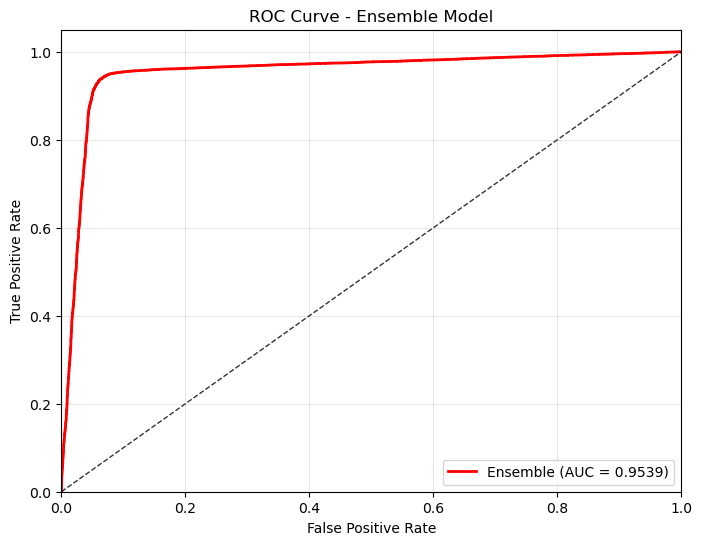

AUC Score: 0.9539


In [112]:

# ==========================
# ENSEMBLE ROC CURVE
# ==========================

print("\n📈 ENSEMBLE ROC CURVE")
print("="*50)

# Calculate ROC curve
fpr_ensemble, tpr_ensemble, thresholds_ensemble = roc_curve(y_test, y_pred_proba_ensemble)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_ensemble, tpr_ensemble, color='red', lw=2, label=f'Ensemble (AUC = {auc_ensemble:.4f})')
plt.plot([0, 1], [0, 1], color='black', lw=1, linestyle='--', alpha=0.8)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Ensemble Model')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

print(f"AUC Score: {auc_ensemble:.4f}")



📊 ENSEMBLE PRECISION-RECALL CURVE


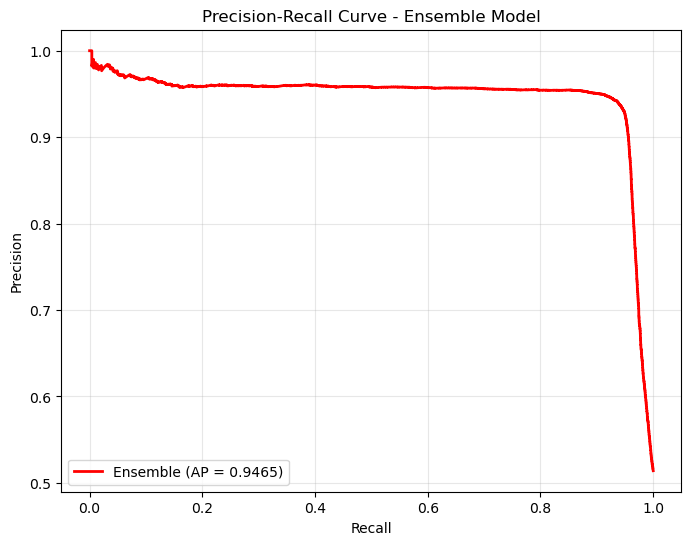

Average Precision: 0.9465


In [113]:
# ==========================
# ENSEMBLE PRECISION-RECALL CURVE
# ==========================

print("\n📊 ENSEMBLE PRECISION-RECALL CURVE")
print("="*50)

precision_ensemble, recall_ensemble, _ = precision_recall_curve(y_test, y_pred_proba_ensemble)
avg_precision_ensemble = average_precision_score(y_test, y_pred_proba_ensemble)

plt.figure(figsize=(8, 6))
plt.plot(recall_ensemble, precision_ensemble, color='red', lw=2, 
         label=f'Ensemble (AP = {avg_precision_ensemble:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Ensemble Model')
plt.legend(loc="lower left")
plt.grid(True, alpha=0.3)
plt.show()

print(f"Average Precision: {avg_precision_ensemble:.4f}")



🔍 ENSEMBLE CONFUSION MATRIX & ERROR ANALYSIS
Confusion Matrix:
[[12140   903]
 [  780 13017]]


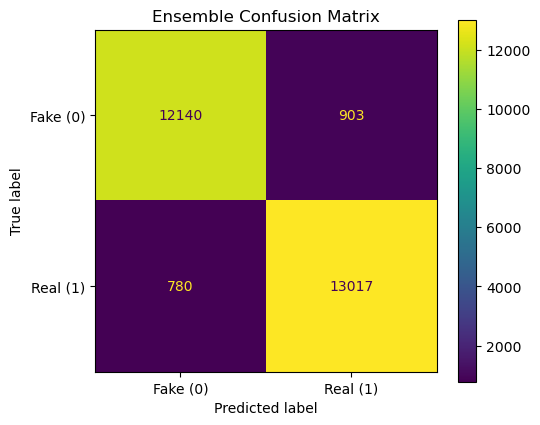


Error Analysis:
True Positives (TP): 13017 - Correctly identified fake news
True Negatives (TN): 12140 - Correctly identified real news
False Positives (FP): 903 - Real news classified as fake
False Negatives (FN): 780 - Fake news classified as real

Error Rates:
False Positive Rate: 0.0692 (6.92%)
False Negative Rate: 0.0565 (5.65%)


In [119]:
# ==========================
# ENSEMBLE CONFUSION MATRIX & ERROR ANALYSIS
# ==========================

print("\n🔍 ENSEMBLE CONFUSION MATRIX & ERROR ANALYSIS")
print("="*60)

import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Confusion matrix
cm_ensemble = confusion_matrix(y_test, y_pred_ensemble)
print(f"Confusion Matrix:")
print(cm_ensemble)

# --- Confusion Matrix Figure ---
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_ensemble,
    display_labels=["Fake (0)", "Real (1)"]   # adjust labels if needed
)

fig, ax = plt.subplots(figsize=(5.5, 4.5))
disp.plot(ax=ax, values_format="d")  # "d" shows counts; use ".2f" for normalized
plt.title("Ensemble Confusion Matrix")
plt.tight_layout()

# Optional: save for PPT
# plt.savefig("ensemble_confusion_matrix.png", dpi=300)

plt.show()
# --- End Figure ---

# Error analysis
fp_ensemble = cm_ensemble[0, 1]  # Predicted fake, actually real
fn_ensemble = cm_ensemble[1, 0]  # Predicted real, actually fake
tp_ensemble = cm_ensemble[1, 1]  # Predicted fake, actually fake
tn_ensemble = cm_ensemble[0, 0]  # Predicted real, actually real

print(f"\nError Analysis:")
print(f"True Positives (TP): {tp_ensemble} - Correctly identified fake news")
print(f"True Negatives (TN): {tn_ensemble} - Correctly identified real news")
print(f"False Positives (FP): {fp_ensemble} - Real news classified as fake")
print(f"False Negatives (FN): {fn_ensemble} - Fake news classified as real")

# Error rates
fp_rate_ensemble = fp_ensemble / (fp_ensemble + tn_ensemble)
fn_rate_ensemble = fn_ensemble / (fn_ensemble + tp_ensemble)

print(f"\nError Rates:")
print(f"False Positive Rate: {fp_rate_ensemble:.4f} ({fp_rate_ensemble*100:.2f}%)")
print(f"False Negative Rate: {fn_rate_ensemble:.4f} ({fn_rate_ensemble*100:.2f}%)")



In [115]:
# ==========================
# ENSEMBLE OPTIMAL THRESHOLD ANALYSIS
# ==========================

print("\n🔍 ENSEMBLE OPTIMAL THRESHOLD ANALYSIS")
print("="*50)

# Find optimal threshold
precision_thresh_ensemble, recall_thresh_ensemble, thresholds_thresh_ensemble = precision_recall_curve(y_test, y_pred_proba_ensemble)
f1_scores_thresh_ensemble = 2 * (precision_thresh_ensemble * recall_thresh_ensemble) / (precision_thresh_ensemble + recall_thresh_ensemble + 1e-8)
optimal_threshold_idx_ensemble = np.argmax(f1_scores_thresh_ensemble[:-1])
optimal_threshold_ensemble = thresholds_thresh_ensemble[optimal_threshold_idx_ensemble]

print(f"Optimal threshold: {optimal_threshold_ensemble:.4f}")
print(f"Optimal F1-score: {f1_scores_thresh_ensemble[optimal_threshold_idx_ensemble]:.4f}")

# Compare with default threshold (0.5)
y_pred_default_ensemble = (y_pred_proba_ensemble >= 0.5).astype(int)
y_pred_optimal_ensemble = (y_pred_proba_ensemble >= optimal_threshold_ensemble).astype(int)

print(f"\nThreshold Comparison:")
print(f"Default threshold (0.5) F1: {f1_score(y_test, y_pred_default_ensemble):.4f}")
print(f"Optimal threshold F1: {f1_score(y_test, y_pred_optimal_ensemble):.4f}")
print(f"Improvement: {f1_score(y_test, y_pred_optimal_ensemble) - f1_score(y_test, y_pred_default_ensemble):.4f}")


🔍 ENSEMBLE OPTIMAL THRESHOLD ANALYSIS
Optimal threshold: 0.5006
Optimal F1-score: 0.9394

Threshold Comparison:
Default threshold (0.5) F1: 0.9393
Optimal threshold F1: 0.9394
Improvement: 0.0001


In [ ]:
## SPIDER PLOT

In [120]:
scores = {
    "Logistic Regression": [0.9283, 0.9302, 0.9512, 0.9308, 0.9296],
    "Random Forest":       [0.9106, 0.9137, 0.9469, 0.9067, 0.9209],
    "XGBoost":             [0.9069, 0.9120, 0.9450, 0.8868, 0.9388],
    "SVM":                 [0.6638, 0.6790, 0.7187, 0.6667, 0.6917],
    "Safe LightGBM":       [0.9260, 0.9282, 0.9511, 0.9264, 0.9300],
    "Ensemble":            [0.9373, 0.9393, 0.9539, 0.9351, 0.9435],
}


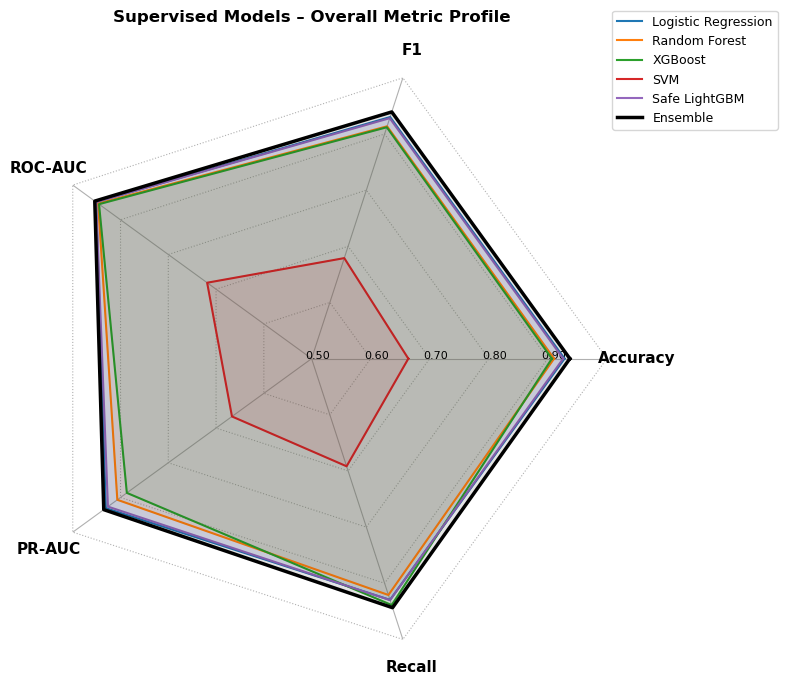

In [127]:
import numpy as np
import matplotlib.pyplot as plt

# ---- Mock Data (Since 'scores' wasn't provided in your snippet) ----
metrics = ["Accuracy", "F1", "ROC-AUC", "PR-AUC", "Recall"]
scores = {
    "Logistic Regression": [0.9283, 0.9302, 0.9512, 0.9308, 0.9296],
    "Random Forest":       [0.9106, 0.9137, 0.9469, 0.9067, 0.9209],
    "XGBoost":             [0.9069, 0.9120, 0.9450, 0.8868, 0.9388],
    "SVM":                 [0.6638, 0.6790, 0.7187, 0.6667, 0.6917],
    "Safe LightGBM":       [0.9260, 0.9282, 0.9511, 0.9264, 0.9300],
    "Ensemble":            [0.9373, 0.9393, 0.9539, 0.9351, 0.9435],
}
# --------------------------------------------------------------------

num_metrics = len(metrics)
# Compute angles
angles = np.linspace(0, 2 * np.pi, num_metrics, endpoint=False)
# Close the loop
angles = np.concatenate([angles, [angles[0]]]) 

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={"polar": True})

# ---- 1. SETUP AXIS LIMITS ----
r_min, r_max = 0.50, 1.0 
ax.set_ylim(r_min, r_max)

# ---- 2. REMOVE DEFAULT CIRCULAR GRID & SPINES ----
ax.spines["polar"].set_visible(False)  # Remove the outer circle
ax.grid(False)                         # Remove the circular grid lines
ax.set_xticks([])                      # Remove default angle ticks
ax.set_yticks([])                      # Remove default radius ticks

# ---- 3. CREATE MANUAL POLYGONAL GRID (The "Web") ----
grid_values = np.linspace(r_min, r_max, 6) # Divide range into 5 sections
grid_color = "#b0b0b0"

# Draw the Concentric Polygons
for i, r in enumerate(grid_values):
    # Plot a line connecting all angles at radius 'r'
    ax.plot(angles, [r] * len(angles), color=grid_color, linewidth=0.8, linestyle=":")
    
    # Add small labels for the values on the vertical axis (angle 0)
    if i < len(grid_values) - 1: # Don't label the very edge if you prefer
        ax.text(0, r + 0.01, f"{r:.2f}", color="black", fontsize=8, ha="center")

# Draw the Spokes (Lines from center to edge)
for ang, label in zip(angles[:-1], metrics):
    ax.plot([ang, ang], [r_min, r_max], color=grid_color, linewidth=0.8)
    
    # Add metric labels manually at the edge
    # We add a small buffer to r_max for text placement
    ax.text(ang, r_max + 0.05, label, ha="center", va="center", fontsize=11, weight="bold")


# ---- 4. PLOT DATA WITH FILL ----
colors = {
    "Logistic Regression": "tab:blue",
    "Random Forest":       "tab:orange",
    "XGBoost":             "tab:green",
    "SVM":                 "tab:red",
    "Safe LightGBM":       "tab:purple",
    "Ensemble":            "black",
}

for model_name, vals in scores.items():
    vals = np.array(vals)
    # Close the polygon by appending the first value
    vals = np.concatenate([vals, [vals[0]]]) 

    color = colors.get(model_name, "gray")

    # Style logic
    if model_name == "Ensemble":
        lw = 2.5
        alpha_fill = 0.1
        ls = "-"
        z = 5
    else:
        lw = 1.5
        alpha_fill = 0.1 # Make all others translucent as well
        ls = "-"
        z = 3

    # Plot the line
    ax.plot(
        angles, 
        vals, 
        color=color, 
        linewidth=lw, 
        linestyle=ls, 
        label=model_name,
        zorder=z
    )
    
    # Fill the area (This gives the style of the second image)
    ax.fill(angles, vals, color=color, alpha=alpha_fill, zorder=z-1)

# ---- 5. LEGEND & TITLE ----
ax.set_title("Supervised Models – Overall Metric Profile", pad=30, weight="bold")
ax.legend(loc="upper right", bbox_to_anchor=(1.3, 1.1), fontsize=9)

plt.tight_layout()
plt.show()


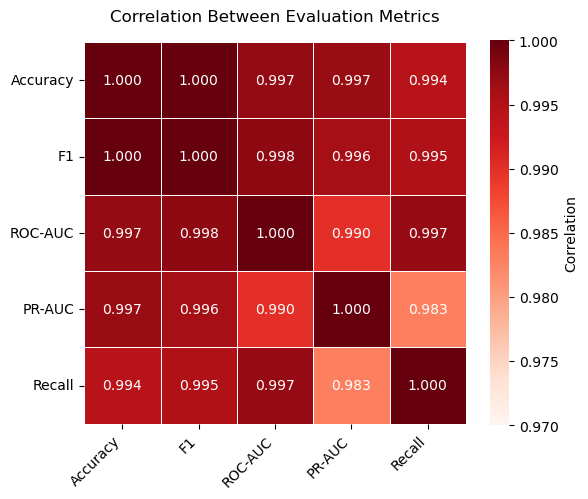

In [133]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

metrics = ["Accuracy", "F1", "ROC-AUC", "PR-AUC", "Recall"]

# scores = {...}  # model -> [acc, f1, roc, pr, recall] in 0–1

# 1) models × metrics table
df_scores = pd.DataFrame.from_dict(scores, orient="index", columns=metrics)

# 2) metric–metric correlation (across models)
corr = df_scores.corr()

plt.figure(figsize=(6, 5))
sns.heatmap(
    corr,
    annot=True,
    fmt=".3f",
    cmap="Reds",          # single-hue so “more red = more correlated”
    vmin=0.97,            # <- zoom into 0.97–1.00 range
    vmax=1.00,
    square=True,
    linewidths=0.5,
    cbar_kws={"label": "Correlation"},
)

plt.title("Correlation Between Evaluation Metrics", pad=15)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [129]:
import pandas as pd

metrics = ["Accuracy", "F1", "ROC-AUC", "PR-AUC", "Recall"]

# scores = { "Logistic Regression": [...], ... }  # your existing dict
import pandas as pd

df = pd.DataFrame.from_dict(scores, orient="index", columns=metrics)
df_pct = (df * 100).round(2)   # convert to %
df_pct.index.name = "Model"



In [130]:
def print_bordered_table(df):
    # Convert everything to strings
    cols = [df.index.name] + list(df.columns)
    rows = [[idx] + [f"{v:.2f}" for v in df.loc[idx]] for idx in df.index]

    # column widths
    col_widths = [max(len(str(x)) for x in [c] + [r[i] for r in rows])
                  for i, c in enumerate(cols)]

    def horiz(border_char="+", fill_char="-"):
        parts = [border_char]
        for w in col_widths:
            parts.append(fill_char * (w + 2))
            parts.append(border_char)
        return "".join(parts)

    # header
    print(horiz())
    header_cells = [" " + str(c).ljust(w) + " " for c, w in zip(cols, col_widths)]
    print("|" + "|".join(header_cells) + "|")
    print(horiz())

    # rows
    for r in rows:
        row_cells = [" " + str(c).ljust(w) + " " for c, w in zip(r, col_widths)]
        print("|" + "|".join(row_cells) + "|")
    print(horiz())

print_bordered_table(df_pct)


+---------------------+----------+-------+---------+--------+--------+
| Model               | Accuracy | F1    | ROC-AUC | PR-AUC | Recall |
+---------------------+----------+-------+---------+--------+--------+
| Logistic Regression | 92.83    | 93.02 | 95.12   | 93.08  | 92.96  |
| Random Forest       | 91.06    | 91.37 | 94.69   | 90.67  | 92.09  |
| XGBoost             | 90.69    | 91.20 | 94.50   | 88.68  | 93.88  |
| SVM                 | 66.38    | 67.90 | 71.87   | 66.67  | 69.17  |
| Safe LightGBM       | 92.60    | 92.82 | 95.11   | 92.64  | 93.00  |
| Ensemble            | 93.73    | 93.93 | 95.39   | 93.51  | 94.35  |
+---------------------+----------+-------+---------+--------+--------+


## PU Learning

In [79]:
# ==========================
# COMPREHENSIVE PU LEARNING IMPLEMENTATION
# ==========================

print("🎯 COMPREHENSIVE PU LEARNING IMPLEMENTATION")
print("="*70)

# Import all necessary libraries for PU learning
from sklearn.ensemble import BaggingClassifier, IsolationForest
from sklearn.naive_bayes import GaussianNB
from sklearn.cluster import KMeans
from sklearn.neighbors import LocalOutlierFactor
import lightgbm as lgb
import time

print("✅ All PU Learning libraries imported successfully!")

🎯 COMPREHENSIVE PU LEARNING IMPLEMENTATION
✅ All PU Learning libraries imported successfully!



PREPARING DATA FOR PU LEARNING (TRUE PU)
Train shape: (107358, 5020)
Labeled Positives kept (P): 16,556
Unlabeled pool (U, MIXED): 90,802  = Negatives (52,170) + Hidden Positives (38,632)
Total PU rows: 107,358


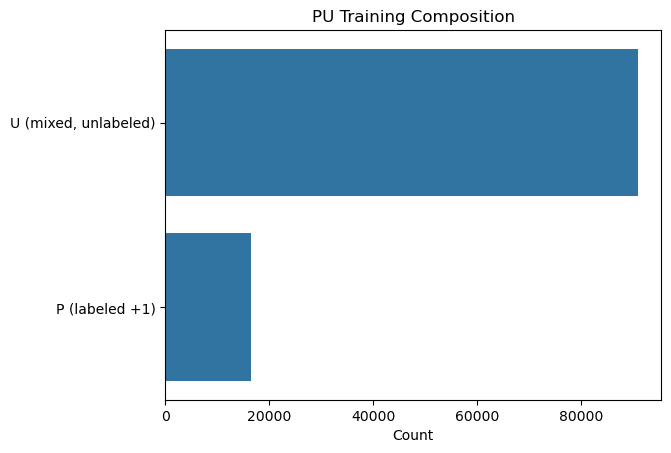

In [80]:
# ==========================
# COMPLETE PU PREPROCESSING (80/20 split + true PU train sets)
# ==========================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.sparse import vstack as sparse_vstack, issparse
from sklearn.model_selection import train_test_split

# 1) Hold-out split (fully labeled; do NOT touch y_test later)
X_train, X_test, y_train, y_test = train_test_split(
    X_combined, y, test_size=0.20, stratify=y, random_state=42
)

# 2) Build true PU sets on TRAIN only
def build_pu_sets(X_train_selected, y_train, keep_frac=0.30, seed=42, positive_label=1):
    """
    Keep a fraction of positives as labeled P; move the rest of positives + all negatives into U (mixed, unlabeled).
    Returns a dict with X_pos, X_unlabeled, X_pu, y_pu, and index arrays.
    """
    y_arr = np.asarray(y_train).astype(int)
    if not set(np.unique(y_arr)).issubset({0, 1}):
        raise ValueError("y_train must be binary {0,1}")

    rng = np.random.default_rng(seed)
    pos_idx = np.where(y_arr == positive_label)[0]   # Real = 1 (your positive)
    neg_idx = np.where(y_arr != positive_label)[0]   # Fake = 0

    keep_n = max(1, int(len(pos_idx) * float(keep_frac)))   # e.g., 30% labeled positives
    P_labeled_idx = rng.choice(pos_idx, size=keep_n, replace=False)

    P_unlabeled_idx = np.setdiff1d(pos_idx, P_labeled_idx, assume_unique=True)
    U_idx = np.concatenate([neg_idx, P_unlabeled_idx])      # MIXED unlabeled pool

    X_pos = X_train_selected[P_labeled_idx]
    X_unlabeled = X_train_selected[U_idx]

    y_pos = np.ones(X_pos.shape[0], dtype=int)              # tag for "labeled positive"
    y_unlab = np.zeros(X_unlabeled.shape[0], dtype=int)     # tag for "unlabeled placeholder"

    X_pu = (sparse_vstack([X_pos, X_unlabeled])
            if (issparse(X_pos) or issparse(X_unlabeled)) else
            np.vstack([X_pos, X_unlabeled]))
    y_pu = np.concatenate([y_pos, y_unlab])

    # Summary + quick viz (optional)
    print("\nPREPARING DATA FOR PU LEARNING (TRUE PU)")
    print("="*50)
    print(f"Train shape: {X_train_selected.shape}")
    print(f"Labeled Positives kept (P): {X_pos.shape[0]:,}")
    print(f"Unlabeled pool (U, MIXED): {X_unlabeled.shape[0]:,}  "
          f"= Negatives ({len(neg_idx):,}) + Hidden Positives ({len(P_unlabeled_idx):,})")
    print(f"Total PU rows: {X_pu.shape[0]:,}")

    pu_df = pd.DataFrame({"label": (["P (labeled +1)"]*len(y_pos)) + (["U (mixed, unlabeled)"]*len(y_unlab))})
    ax = sns.countplot(y="label", data=pu_df, order=["U (mixed, unlabeled)", "P (labeled +1)"])
    ax.set_title("PU Training Composition"); ax.set_xlabel("Count"); ax.set_ylabel("")
    plt.show()

    return {
        "X_pos": X_pos, "y_pos": y_pos,
        "X_unlabeled": X_unlabeled, "y_unlabeled_placeholder": y_unlab,
        "X_pu": X_pu, "y_pu": y_pu,
        "P_labeled_idx": P_labeled_idx, "U_idx": U_idx,
        "P_unlabeled_idx": P_unlabeled_idx, "pos_idx": pos_idx, "neg_idx": neg_idx
    }

pu = build_pu_sets(X_train, y_train, keep_frac=0.30, seed=42, positive_label=1)

# ---- What you'll use next in the PU model stage ----
# Step-1 temp classifier will fit on: pu["X_pu"], pu["y_pu"]   (treat 0 as "unlabeled placeholder")
# Score ONLY pu["X_unlabeled"] to select Reliable Negatives (RN).
# Final model will train on: pu["X_pos"] (label=1) vs RN (label=0)
# Evaluate on the untouched X_test, y_test.


### Elkan-Noto PU Classifier

In [81]:
# ==========================
# ELKAN–NOTO (LogReg) — corrected
#  • keeps your TF-IDF exactly as-is
#  • scales ONLY the 20 numeric columns
#  • true PU construction
#  • calibrated LR s-model
#  • threshold tuned on a validation split using the SAME trained model
# ==========================
import numpy as np, time
from scipy.sparse import hstack, vstack as sparse_vstack, issparse
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import (
    classification_report, confusion_matrix, roc_auc_score, average_precision_score,
    precision_recall_curve, f1_score, matthews_corrcoef
)

# ---- Config (tweak here if needed) ----
NUMERIC_COLS   = 20       # last 20 columns are numeric
KEEP_FRAC      = 0.50     # fraction of positives kept labeled in PU train
CALIBRATION    = "isotonic"  # "sigmoid" (faster) or "isotonic" (tighter calibration)
C_LR           = 0.5      # LogisticRegression C for the s-model
VAL_SIZE       = 0.10     # validation slice from TRAIN for threshold tuning
RANDOM_STATE   = 42
THRESHOLD_MODE = "f1"     # "f1" or "precision"
TARGET_PREC    = 0.90     # used only if THRESHOLD_MODE == "precision"

# ---- Helpers ----
def scale_numeric_tail(Xtr, Xte, n_tail=NUMERIC_COLS):
    """Scale ONLY the numeric tail; keep TF-IDF block unchanged."""
    if n_tail <= 0:
        return Xtr, Xte, None
    Xtr_text, Xtr_num = Xtr[:, :-n_tail], Xtr[:, -n_tail:]
    Xte_text, Xte_num = Xte[:, :-n_tail], Xte[:, -n_tail:]
    scaler = StandardScaler(with_mean=False)  # safe for sparse
    Xtr_num_s = scaler.fit_transform(Xtr_num)
    Xte_num_s = scaler.transform(Xte_num)
    return hstack([Xtr_text, Xtr_num_s], format="csr"), hstack([Xte_text, Xte_num_s], format="csr"), scaler

def build_pu_sets(X_train, y_train, keep_frac=KEEP_FRAC, seed=RANDOM_STATE, positive_label=1):
    """TRUE PU: keep a fraction of positives as labeled P; put remaining positives + all negatives in U (mixed)."""
    y_arr = np.asarray(y_train).astype(int)
    rng = np.random.default_rng(seed)
    pos_idx = np.where(y_arr == positive_label)[0]
    neg_idx = np.where(y_arr != positive_label)[0]

    keep_n = max(1, int(len(pos_idx) * float(keep_frac)))
    P_labeled_idx   = rng.choice(pos_idx, size=keep_n, replace=False)
    P_unlabeled_idx = np.setdiff1d(pos_idx, P_labeled_idx, assume_unique=True)
    U_idx           = np.concatenate([neg_idx, P_unlabeled_idx])

    X_pos = X_train[P_labeled_idx]
    X_unl = X_train[U_idx]
    y_pos = np.ones(X_pos.shape[0], dtype=int)
    y_unl = np.zeros(X_unl.shape[0], dtype=int)

    X_pu = sparse_vstack([X_pos, X_unl]) if (issparse(X_pos) or issparse(X_unl)) else np.vstack([X_pos, X_unl])
    y_pu = np.concatenate([y_pos, y_unl])

    print(f"\n[PU] Labeled P: {X_pos.shape[0]} | Unlabeled (mixed): {X_unl.shape[0]}")
    return {"X_pos": X_pos, "X_unlabeled": X_unl, "X_pu": X_pu, "y_pu": y_pu}

class ElkanotoPU_LR:
    """Elkan–Noto with calibrated Logistic Regression as the s-model."""
    def __init__(self, C=C_LR, calibration=CALIBRATION, cv=3, max_iter=3000,
                 class_weight="balanced", n_jobs=-1, threshold=0.5, random_state=RANDOM_STATE):
        self.C=C; self.calibration=calibration; self.cv=cv
        self.max_iter=max_iter; self.class_weight=class_weight
        self.n_jobs=n_jobs; self.threshold=threshold; self.random_state=random_state
        self.clf_=None; self.c_=None

    def fit(self, X_pu, y_pu, X_pos_for_c):
        base = LogisticRegression(
            solver="saga", C=self.C, max_iter=self.max_iter, tol=1e-3,
            class_weight=self.class_weight, n_jobs=self.n_jobs, random_state=self.random_state
        )
        self.clf_ = CalibratedClassifierCV(base, method=self.calibration, cv=self.cv)
        self.clf_.fit(X_pu, y_pu)  # learn P(s=1|x)

        # c-hat = E_x in P [ P(s=1|x) ]
        ps_on_pos = self.clf_.predict_proba(X_pos_for_c)[:, 1]
        self.c_ = float(np.clip(ps_on_pos.mean(), 1e-6, 1-1e-6))
        return self

    def predict_proba(self, X):
        ps = self.clf_.predict_proba(X)[:, 1]
        py1 = np.clip(ps / self.c_, 0.0, 1.0)
        py0 = 1.0 - py1
        return np.column_stack([py0, py1])

    def predict(self, X):
        return (self.predict_proba(X)[:, 1] >= self.threshold).astype(int)

# ---- 1) Split (reuse if already split) ----
if 'X_train_selected' in globals() and 'X_test_selected' in globals() and 'y_train' in globals() and 'y_test' in globals():
    X_train_raw, X_test_raw = X_train_selected, X_test_selected
else:
    X_train_raw, X_test_raw, y_train, y_test = train_test_split(
        X_combined, y, test_size=0.20, stratify=y, random_state=RANDOM_STATE
    )

# ---- 2) Scale ONLY the numeric tail ----
X_train_scaled, X_test_scaled, _num_scaler = scale_numeric_tail(X_train_raw, X_test_raw, NUMERIC_COLS)

# ---- 3) PU construction on TRAIN ----
pu = build_pu_sets(X_train_scaled, y_train, keep_frac=KEEP_FRAC, seed=RANDOM_STATE, positive_label=1)

# ---- 4) Train s-model (calibrated LR) and estimate c-hat ----
print("\n[Train] Elkan–Noto s-model (calibrated LR)")
t0 = time.time()
pu_clf = ElkanotoPU_LR(C=C_LR, calibration=CALIBRATION, cv=3, max_iter=3000,
                       class_weight="balanced", n_jobs=-1, threshold=0.50, random_state=RANDOM_STATE)
pu_clf.fit(pu["X_pu"], pu["y_pu"], X_pos_for_c=pu["X_pos"])
print(f"[Info] Estimated c-hat: {pu_clf.c_:.6f} | Fit time: {time.time()-t0:.1f}s")

# ---- 5) Tune threshold on a small validation split (from TRAIN only) ----
X_tr_base, X_val, y_tr_base, y_val = train_test_split(
    X_train_scaled, y_train, test_size=VAL_SIZE, stratify=y_train, random_state=RANDOM_STATE
)
# IMPORTANT: use the SAME trained model for validation scoring
p_val = pu_clf.predict_proba(X_val)[:, 1]
prec, rec, thr = precision_recall_curve(y_val, p_val)

if THRESHOLD_MODE == "precision":
    # pick the smallest threshold achieving the target precision
    idx = np.where(prec[:-1] >= TARGET_PREC)[0]
    best_thr = float(thr[idx[0]]) if len(idx) else 0.5
else:
    # best F1
    f1_curve = 2*prec*rec/(prec+rec+1e-9)
    best_thr = float(thr[f1_curve[:-1].argmax()])

pu_clf.threshold = best_thr
print(f"[Tune] Chosen validation threshold: {pu_clf.threshold:.3f} (mode={THRESHOLD_MODE})")

# ---- 6) Final evaluation on frozen TEST ----
p_test = pu_clf.predict_proba(X_test_scaled)[:, 1]
y_pred = (p_test >= pu_clf.threshold).astype(int)

print("\n=== ELKAN–NOTO (LogReg) — TEST RESULTS ===")
print(classification_report(y_test.astype(int), y_pred, digits=4, zero_division=0))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

print(f"\nAUC-ROC: {roc_auc_score(y_test, p_test):.4f}")
print(f"AUC-PR : {average_precision_score(y_test, p_test):.4f}")
print(f"F1     : {f1_score(y_test, y_pred):.4f}")
print(f"MCC    : {matthews_corrcoef(y_test, y_pred):.4f}")
print(f"Chosen threshold: {pu_clf.threshold:.3f}")



[PU] Labeled P: 27594 | Unlabeled (mixed): 79764

[Train] Elkan–Noto s-model (calibrated LR)
[Info] Estimated c-hat: 0.486644 | Fit time: 46.3s
[Tune] Chosen validation threshold: 0.487 (mode=f1)

=== ELKAN–NOTO (LogReg) — TEST RESULTS ===
              precision    recall  f1-score   support

           0     0.8605    0.8135    0.8363     13043
           1     0.8323    0.8753    0.8533     13797

    accuracy                         0.8453     26840
   macro avg     0.8464    0.8444    0.8448     26840
weighted avg     0.8460    0.8453    0.8450     26840

Confusion Matrix:
 [[10610  2433]
 [ 1720 12077]]

AUC-ROC: 0.9040
AUC-PR : 0.8841
F1     : 0.8533
MCC    : 0.6908
Chosen threshold: 0.487


ELKAN-NOTO ROC CURVE ANALYSIS


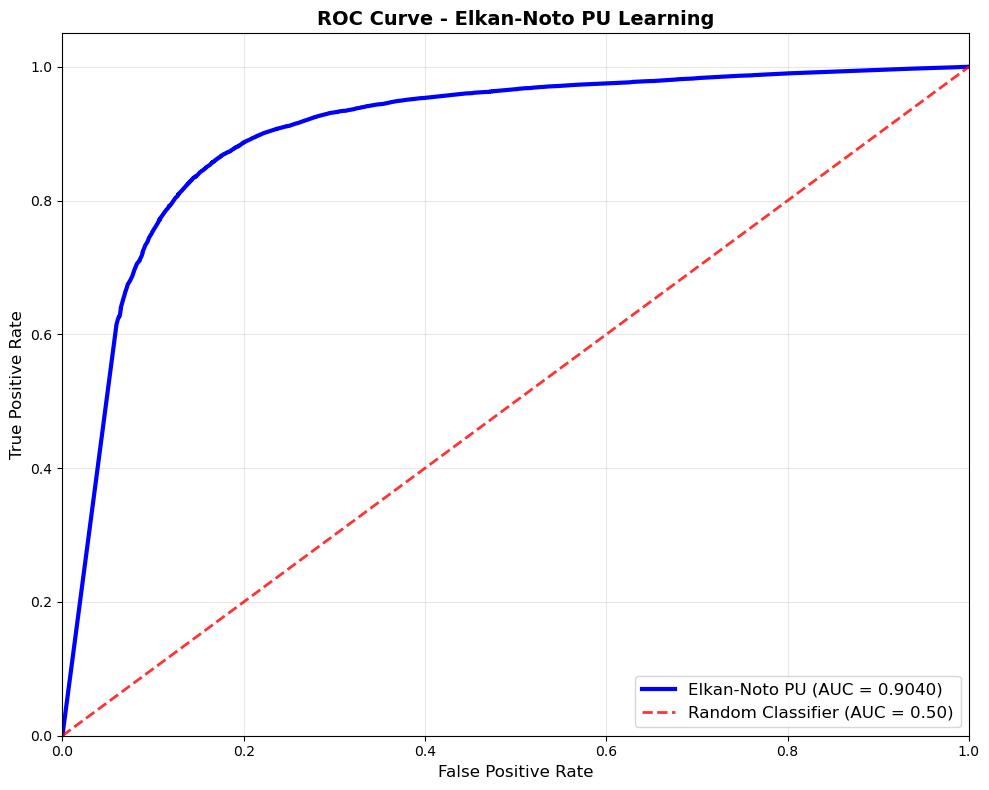

AUC-ROC Score: 0.9040
✓ EXCELLENT: Model shows outstanding discrimination ability


In [82]:
# ==========================
# ELKAN-NOTO ROC CURVE ANALYSIS
# ==========================

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
import numpy as np

print("ELKAN-NOTO ROC CURVE ANALYSIS")
print("="*50)

# Calculate ROC curve
fpr_elkan, tpr_elkan, thresholds_roc = roc_curve(y_test, p_test)
auc_elkan = roc_auc_score(y_test, p_test)

# Plot ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr_elkan, tpr_elkan, color='blue', lw=3, 
         label=f'Elkan-Noto PU (AUC = {auc_elkan:.4f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--', alpha=0.8, 
         label='Random Classifier (AUC = 0.50)')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('ROC Curve - Elkan-Noto PU Learning', fontsize=14, fontweight='bold')
plt.legend(loc="lower right", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"AUC-ROC Score: {auc_elkan:.4f}")

# ROC curve interpretation
if auc_elkan >= 0.9:
    print("✓ EXCELLENT: Model shows outstanding discrimination ability")
elif auc_elkan >= 0.8:
    print("✓ GOOD: Model shows good discrimination ability")
elif auc_elkan >= 0.7:
    print("⚠ FAIR: Model shows moderate discrimination ability")
else:
    print("❌ POOR: Model shows weak discrimination ability")


ELKAN-NOTO PRECISION-RECALL CURVE ANALYSIS


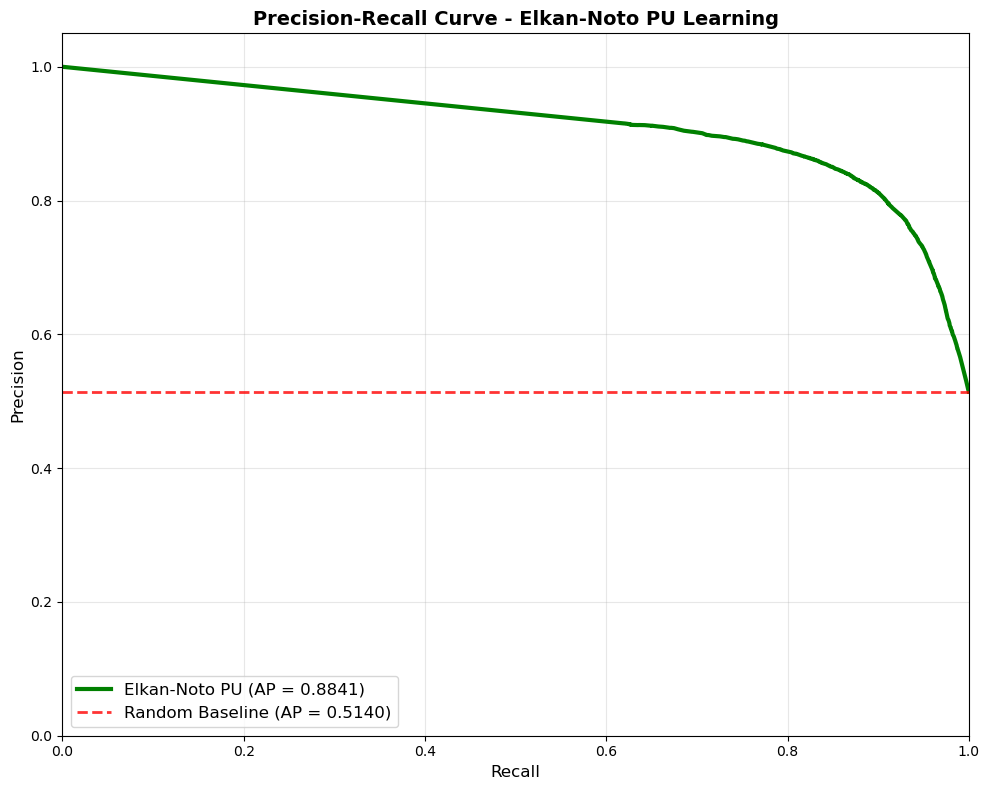

Average Precision: 0.8841
Class Distribution: 13797/26840 = 0.5140
✓ EXCELLENT: Model shows outstanding precision-recall performance


In [83]:
# ==========================
# ELKAN-NOTO PRECISION-RECALL CURVE ANALYSIS
# ==========================

from sklearn.metrics import precision_recall_curve, average_precision_score

print("\nELKAN-NOTO PRECISION-RECALL CURVE ANALYSIS")
print("="*50)

# Calculate Precision-Recall curve
precision_elkan, recall_elkan, thresholds_pr = precision_recall_curve(y_test, p_test)
avg_precision_elkan = average_precision_score(y_test, p_test)

# Plot Precision-Recall curve
plt.figure(figsize=(10, 8))
plt.plot(recall_elkan, precision_elkan, color='green', lw=3, 
         label=f'Elkan-Noto PU (AP = {avg_precision_elkan:.4f})')

# Add baseline (random classifier)
baseline = np.sum(y_test) / len(y_test)
plt.axhline(y=baseline, color='red', linestyle='--', lw=2, alpha=0.8, 
           label=f'Random Baseline (AP = {baseline:.4f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve - Elkan-Noto PU Learning', fontsize=14, fontweight='bold')
plt.legend(loc="lower left", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Average Precision: {avg_precision_elkan:.4f}")
print(f"Class Distribution: {np.sum(y_test)}/{len(y_test)} = {baseline:.4f}")

# PR curve interpretation
if avg_precision_elkan >= 0.8:
    print("✓ EXCELLENT: Model shows outstanding precision-recall performance")
elif avg_precision_elkan >= 0.7:
    print("✓ GOOD: Model shows good precision-recall performance")
elif avg_precision_elkan >= 0.6:
    print("⚠ FAIR: Model shows moderate precision-recall performance")
else:
    print("❌ POOR: Model shows weak precision-recall performance")


ELKAN-NOTO CONFUSION MATRIX ANALYSIS
Confusion Matrix:
[[10610  2433]
 [ 1720 12077]]

Detailed Analysis:
True Positives (TP): 12,077 - Correctly identified real news
True Negatives (TN): 10,610 - Correctly identified fake news
False Positives (FP): 2,433 - Real news classified as fake
False Negatives (FN): 1,720 - Fake news classified as real

Error Rates:
False Positive Rate: 0.1865 (18.65%)
False Negative Rate: 0.1247 (12.47%)
Specificity (True Negative Rate): 0.8135
Sensitivity (True Positive Rate): 0.8753


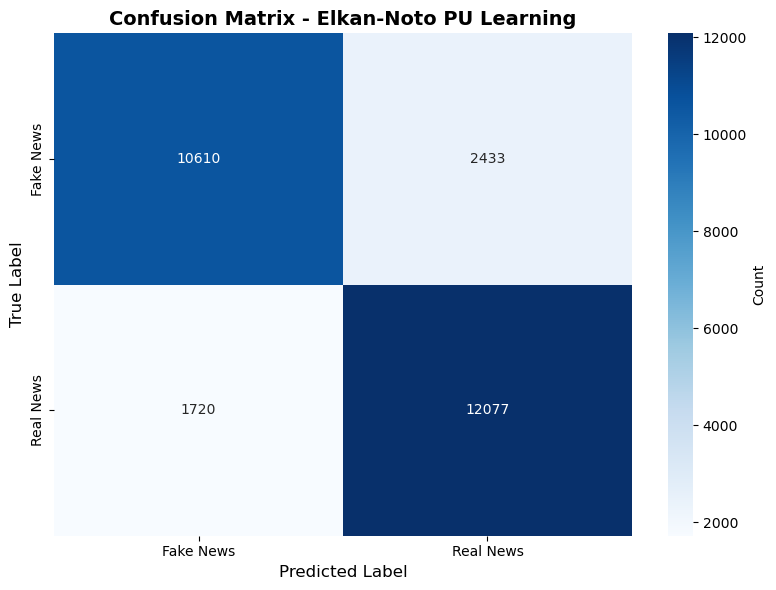

In [84]:
# ==========================
# ELKAN-NOTO CONFUSION MATRIX ANALYSIS
# ==========================

from sklearn.metrics import confusion_matrix
import seaborn as sns

print("\nELKAN-NOTO CONFUSION MATRIX ANALYSIS")
print("="*50)

# Calculate confusion matrix
cm_elkan = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm_elkan)

# Extract confusion matrix components
tn_elkan = cm_elkan[0, 0]  # True Negatives
fp_elkan = cm_elkan[0, 1]  # False Positives
fn_elkan = cm_elkan[1, 0]  # False Negatives
tp_elkan = cm_elkan[1, 1]  # True Positives

print(f"\nDetailed Analysis:")
print(f"True Positives (TP): {tp_elkan:,} - Correctly identified real news")
print(f"True Negatives (TN): {tn_elkan:,} - Correctly identified fake news")
print(f"False Positives (FP): {fp_elkan:,} - Real news classified as fake")
print(f"False Negatives (FN): {fn_elkan:,} - Fake news classified as real")

# Calculate rates
fp_rate_elkan = fp_elkan / (fp_elkan + tn_elkan) if (fp_elkan + tn_elkan) > 0 else 0
fn_rate_elkan = fn_elkan / (fn_elkan + tp_elkan) if (fn_elkan + tp_elkan) > 0 else 0
specificity_elkan = tn_elkan / (tn_elkan + fp_elkan) if (tn_elkan + fp_elkan) > 0 else 0
sensitivity_elkan = tp_elkan / (tp_elkan + fn_elkan) if (tp_elkan + fn_elkan) > 0 else 0

print(f"\nError Rates:")
print(f"False Positive Rate: {fp_rate_elkan:.4f} ({fp_rate_elkan*100:.2f}%)")
print(f"False Negative Rate: {fn_rate_elkan:.4f} ({fn_rate_elkan*100:.2f}%)")
print(f"Specificity (True Negative Rate): {specificity_elkan:.4f}")
print(f"Sensitivity (True Positive Rate): {sensitivity_elkan:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_elkan, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Fake News', 'Real News'],
            yticklabels=['Fake News', 'Real News'],
            cbar_kws={'label': 'Count'})
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Confusion Matrix - Elkan-Noto PU Learning', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Bagging PU Classifier

Split shapes:
  X_train: (107358, 5020), y_train: (107358,)
  X_test:  (26840, 5020),  y_test:  (26840,)

PREPARING DATA FOR PU LEARNING (TRUE PU)
Train shape: (107358, 5020)
Labeled Positives kept (P): 16,556
Unlabeled pool (U, MIXED): 90,802  = Negatives (52,170) + Hidden Positives (38,632)
Total PU rows: 107,358


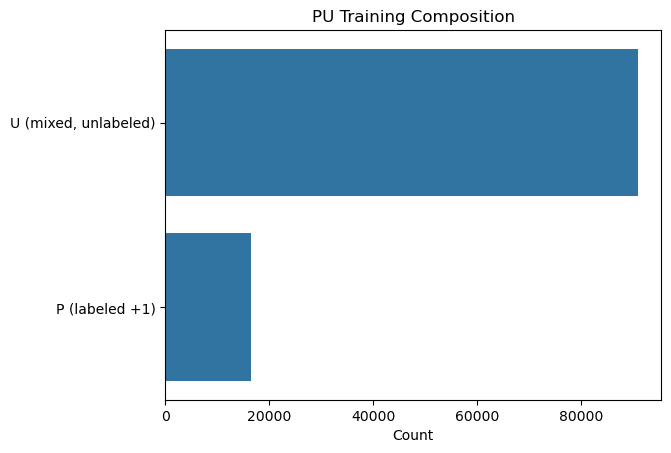


PU BAGGING (Logistic Regression base)
Labeled positives per bag:  16,556
Total unlabeled pool:       90,802
Unlabeled sampled per bag:  45,401 (50.0% of U)
Number of bags:             45

 Bag 01/45 trained in 2.74s on 61,957 rows.
 Bag 02/45 trained in 2.54s on 61,957 rows.
 Bag 03/45 trained in 7.03s on 61,957 rows.
 Bag 04/45 trained in 2.04s on 61,957 rows.
 Bag 05/45 trained in 1.90s on 61,957 rows.
 Bag 06/45 trained in 1.48s on 61,957 rows.
 Bag 07/45 trained in 1.22s on 61,957 rows.
 Bag 08/45 trained in 1.92s on 61,957 rows.
 Bag 09/45 trained in 1.75s on 61,957 rows.
 Bag 10/45 trained in 3.18s on 61,957 rows.
 Bag 11/45 trained in 2.60s on 61,957 rows.
 Bag 12/45 trained in 1.96s on 61,957 rows.
 Bag 13/45 trained in 1.41s on 61,957 rows.
 Bag 14/45 trained in 1.45s on 61,957 rows.
 Bag 15/45 trained in 1.64s on 61,957 rows.
 Bag 16/45 trained in 3.01s on 61,957 rows.
 Bag 17/45 trained in 1.64s on 61,957 rows.
 Bag 18/45 trained in 4.59s on 61,957 rows.
 Bag 19/45 trained 

In [85]:
# ==========================
# PU BAGGING PIPELINE (CORRECTED)
#  - 80/20 train–test split
#  - TRUE PU on train
#  - PU bagging with fixed 0.5 threshold
# ==========================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

from scipy.sparse import vstack as sparse_vstack, issparse
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report, confusion_matrix, f1_score,
    matthews_corrcoef, roc_auc_score, average_precision_score
)

# -----------------------------------------------------------
# 1) OUTER TRAIN/TEST SPLIT (keep test completely untouched)
# -----------------------------------------------------------
# Assumes you already have:
#   X_combined : feature matrix
#   y          : labels (0 = fake, 1 = real)

X_train, X_test, y_train, y_test = train_test_split(
    X_combined,
    y,
    test_size=0.20,
    stratify=y,
    random_state=42
)

print("Split shapes:")
print(f"  X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"  X_test:  {X_test.shape},  y_test:  {y_test.shape}")

# -----------------------------------------------------------
# 2) TRUE PU CONSTRUCTION ON TRAIN ONLY
# -----------------------------------------------------------
def build_pu_sets(X_train_selected, y_train, keep_frac=0.30, seed=42, positive_label=1):
    """
    TRUE PU setup:

      - Keep a fraction (keep_frac) of positives as labeled P (y=1).
      - Move remaining positives + all negatives into U (mixed unlabeled).

    Returns a dict with:
      X_pos, y_pos, X_unlabeled, y_unlabeled_placeholder, X_pu, y_pu, and index arrays.
    """
    y_arr = np.asarray(y_train).astype(int)
    if not set(np.unique(y_arr)).issubset({0, 1}):
        raise ValueError("y_train must be binary {0,1}")

    rng = np.random.default_rng(seed)

    pos_idx = np.where(y_arr == positive_label)[0]   # Real news (1)
    neg_idx = np.where(y_arr != positive_label)[0]   # Fake news (0)

    keep_n = max(1, int(len(pos_idx) * float(keep_frac)))   # e.g. 30% of positives
    P_labeled_idx = rng.choice(pos_idx, size=keep_n, replace=False)

    P_unlabeled_idx = np.setdiff1d(pos_idx, P_labeled_idx, assume_unique=True)
    U_idx = np.concatenate([neg_idx, P_unlabeled_idx])      # MIXED unlabeled

    X_pos = X_train_selected[P_labeled_idx]
    X_unlabeled = X_train_selected[U_idx]

    y_pos = np.ones(X_pos.shape[0], dtype=int)          # labeled positive flag
    y_unlab = np.zeros(X_unlabeled.shape[0], dtype=int) # placeholder (not used)

    X_pu = (sparse_vstack([X_pos, X_unlabeled])
            if (issparse(X_pos) or issparse(X_unlabeled))
            else np.vstack([X_pos, X_unlabeled]))
    y_pu = np.concatenate([y_pos, y_unlab])

    # Small summary + visualization (optional)
    print("\nPREPARING DATA FOR PU LEARNING (TRUE PU)")
    print("=" * 50)
    print(f"Train shape: {X_train_selected.shape}")
    print(f"Labeled Positives kept (P): {X_pos.shape[0]:,}")
    print(f"Unlabeled pool (U, MIXED): {X_unlabeled.shape[0]:,}  "
          f"= Negatives ({len(neg_idx):,}) + Hidden Positives ({len(P_unlabeled_idx):,})")
    print(f"Total PU rows: {X_pu.shape[0]:,}")

    pu_df = pd.DataFrame({
        "label": (["P (labeled +1)"] * len(y_pos)) +
                 (["U (mixed, unlabeled)"] * len(y_unlab))
    })
    ax = sns.countplot(
        y="label",
        data=pu_df,
        order=["U (mixed, unlabeled)", "P (labeled +1)"]
    )
    ax.set_title("PU Training Composition")
    ax.set_xlabel("Count")
    ax.set_ylabel("")
    plt.show()

    return {
        "X_pos": X_pos,
        "y_pos": y_pos,
        "X_unlabeled": X_unlabeled,
        "y_unlabeled_placeholder": y_unlab,
        "X_pu": X_pu,
        "y_pu": y_pu,
        "P_labeled_idx": P_labeled_idx,
        "U_idx": U_idx,
        "P_unlabeled_idx": P_unlabeled_idx,
        "pos_idx": pos_idx,
        "neg_idx": neg_idx,
    }

pu = build_pu_sets(
    X_train,
    y_train,
    keep_frac=0.30,   # 30% of positives labeled
    seed=42,
    positive_label=1
)

# -----------------------------------------------------------
# 3) PU BAGGING (ORIGINAL, STABLE VERSION)
# -----------------------------------------------------------
def _stack_rows(A, B):
    """Utility: vertical stack that works for both sparse and dense matrices."""
    if issparse(A) or issparse(B):
        return sparse_vstack([A, B])
    else:
        return np.vstack([A, B])

def run_pu_bagging(
    pu,
    X_test,
    y_test,
    n_bags=25,
    unlabeled_sample_frac=0.5,  # fraction of U sampled per bag
    C=1.0,
    random_state=42
):
    """
    PU Bagging with Logistic Regression base learner.

    - Each bag uses ALL labeled positives as class 1.
    - Samples `unlabeled_sample_frac` of U as temporary negatives (class 0).
    - Fits a LogReg with class_weight='balanced'.
    - Averages probabilities from all bags.
    - Uses fixed threshold 0.5 (good balance: higher accuracy & decent fake-news recall).
    """

    X_pos = pu["X_pos"]
    X_unlabeled = pu["X_unlabeled"]

    n_pos = X_pos.shape[0]
    n_unl = X_unlabeled.shape[0]

    rng = np.random.default_rng(random_state)
    n_sample_unl = max(1, int(n_unl * float(unlabeled_sample_frac)))

    print("\n==========================")
    print("PU BAGGING (Logistic Regression base)")
    print("==========================")
    print(f"Labeled positives per bag:  {n_pos:,}")
    print(f"Total unlabeled pool:       {n_unl:,}")
    print(f"Unlabeled sampled per bag:  {n_sample_unl:,} "
          f"({unlabeled_sample_frac*100:.1f}% of U)")
    print(f"Number of bags:             {n_bags}")
    print("==========================\n")

    bag_models = []
    test_probas = []

    for b in range(n_bags):
        t0 = time.time()

        # 1) sample temporary negatives from U
        idx_unl = rng.choice(n_unl, size=n_sample_unl, replace=False)
        X_neg_b = X_unlabeled[idx_unl]

        # 2) build bag dataset
        X_bag = _stack_rows(X_pos, X_neg_b)
        y_bag = np.concatenate([
            np.ones(n_pos, dtype=int),
            np.zeros(n_sample_unl, dtype=int)
        ])

        # 3) train base classifier
        clf = LogisticRegression(
            C=C,
            max_iter=1000,
            class_weight="balanced",
            solver="liblinear" if issparse(X_bag) else "lbfgs"
        )
        clf.fit(X_bag, y_bag)
        bag_models.append(clf)

        # 4) probabilities on TEST
        proba_test = clf.predict_proba(X_test)[:, 1]
        test_probas.append(proba_test)

        elapsed = time.time() - t0
        print(f" Bag {b+1:02d}/{n_bags} trained in {elapsed:.2f}s "
              f"on {X_bag.shape[0]:,} rows.")

    # Average probabilities across bags
    test_probas = np.vstack(test_probas)
    avg_proba_test = test_probas.mean(axis=0)

    # Fixed threshold 0.5 – this is where you previously saw decent accuracy
    threshold = 0.5
    y_pred_test = (avg_proba_test >= threshold).astype(int)

    print("\n==== PU BAGGING — TEST METRICS ====")
    print("Confusion matrix (rows=true, cols=pred):")
    print(confusion_matrix(y_test, y_pred_test))
    print("\nClassification report:")
    print(classification_report(y_test, y_pred_test, digits=4))

    f1_pos = f1_score(y_test, y_pred_test, pos_label=1)
    f1_macro = f1_score(y_test, y_pred_test, average="macro")
    mcc = matthews_corrcoef(y_test, y_pred_test)
    try:
        auc = roc_auc_score(y_test, avg_proba_test)
    except ValueError:
        auc = np.nan
    ap = average_precision_score(y_test, avg_proba_test)

    print(f"F1-score (class 1 / real): {f1_pos:.4f}")
    print(f"Macro F1:                  {f1_macro:.4f}")
    print(f"MCC:                       {mcc:.4f}")
    print(f"ROC-AUC (proba):           {auc:.4f}")
    print(f"Average Precision:         {ap:.4f}")

    return {
        "models": bag_models,
        "test_avg_proba": avg_proba_test,
        "test_pred_labels": y_pred_test,
        "threshold": threshold,
        "metrics": {
            "f1_pos": f1_pos,
            "f1_macro": f1_macro,
            "mcc": mcc,
            "roc_auc": auc,
            "avg_precision": ap,
        },
    }

# -----------------------------------------------------------
# 4) RUN PU BAGGING
# -----------------------------------------------------------
pu_bagging_results = run_pu_bagging(
    pu=pu,
    X_test=X_test,
    y_test=y_test,
    n_bags=45,               # you can try 20/30 as well
    unlabeled_sample_frac=0.5,  # 50% of U per bag; try 0.4 or 0.6 if needed
    C=1.0,
    random_state=42
)



PU BAGGING ROC CURVE ANALYSIS


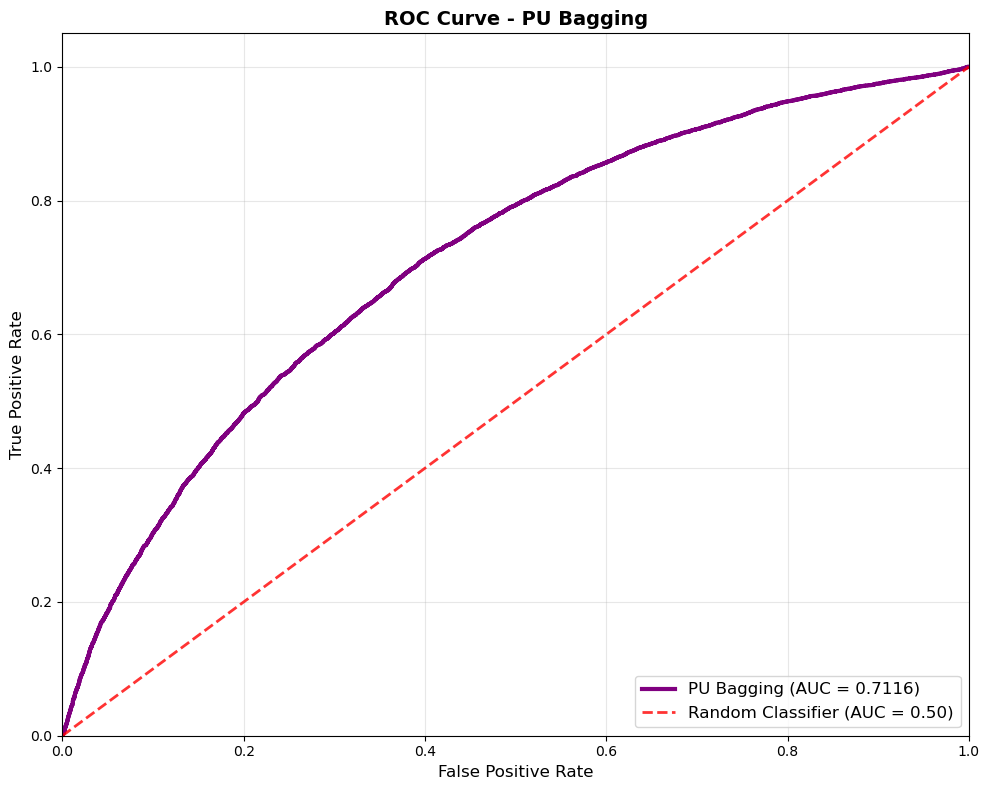

AUC-ROC Score: 0.7116
⚠ FAIR: Model shows moderate discrimination ability


In [86]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
import numpy as np

print("\nPU BAGGING ROC CURVE ANALYSIS")
print("="*50)

# Extract results from pu_bagging_results
avg_proba_bagging = pu_bagging_results["test_avg_proba"]
y_pred_bagging = pu_bagging_results["test_pred_labels"]

# Calculate ROC curve
fpr_bagging, tpr_bagging, thresholds_roc_bagging = roc_curve(y_test, avg_proba_bagging)
auc_bagging = roc_auc_score(y_test, avg_proba_bagging)

# Plot ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr_bagging, tpr_bagging, color='purple', lw=3, 
         label=f'PU Bagging (AUC = {auc_bagging:.4f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--', alpha=0.8, 
         label='Random Classifier (AUC = 0.50)')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('ROC Curve - PU Bagging', fontsize=14, fontweight='bold')
plt.legend(loc="lower right", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"AUC-ROC Score: {auc_bagging:.4f}")

# ROC curve interpretation
if auc_bagging >= 0.9:
    print("✓ EXCELLENT: Model shows outstanding discrimination ability")
elif auc_bagging >= 0.8:
    print("✓ GOOD: Model shows good discrimination ability")
elif auc_bagging >= 0.7:
    print("⚠ FAIR: Model shows moderate discrimination ability")
else:
    print("❌ POOR: Model shows weak discrimination ability")


PU BAGGING PRECISION-RECALL CURVE ANALYSIS


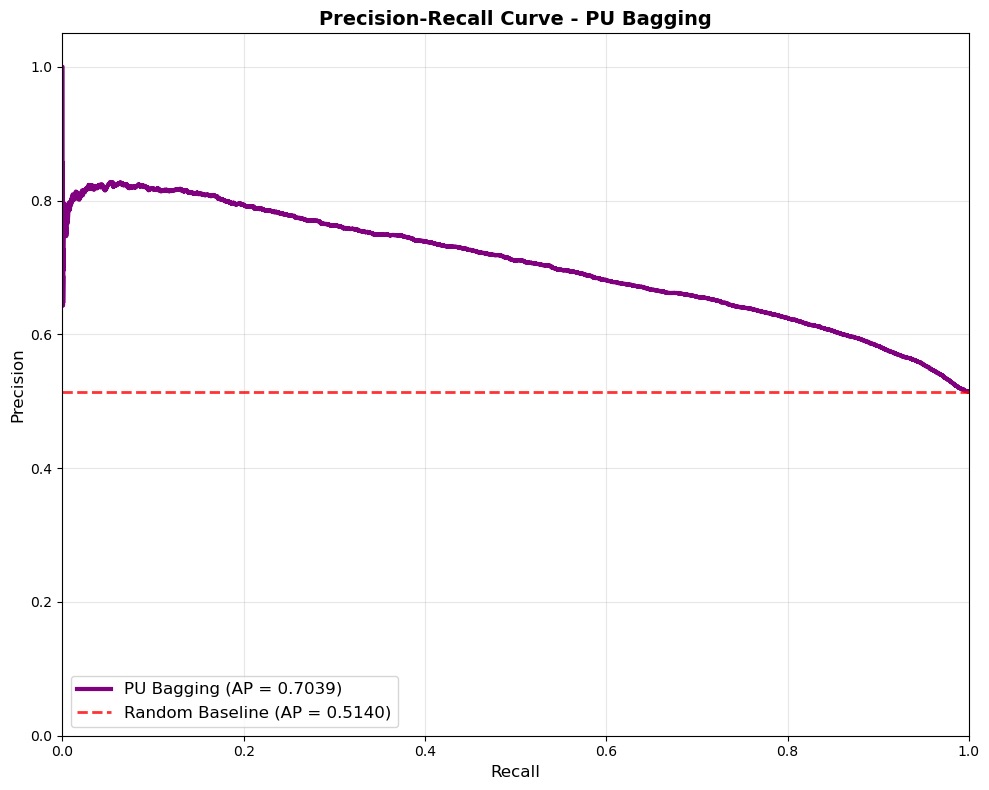

Average Precision: 0.7039
Class Distribution: 13797/26840 = 0.5140
✓ GOOD: Model shows good precision-recall performance


In [87]:
# ==========================
# PU BAGGING PRECISION-RECALL CURVE ANALYSIS
# ==========================

from sklearn.metrics import precision_recall_curve, average_precision_score

print("\nPU BAGGING PRECISION-RECALL CURVE ANALYSIS")
print("="*50)

# Calculate Precision-Recall curve
precision_bagging, recall_bagging, thresholds_pr_bagging = precision_recall_curve(y_test, avg_proba_bagging)
avg_precision_bagging = average_precision_score(y_test, avg_proba_bagging)

# Plot Precision-Recall curve
plt.figure(figsize=(10, 8))
plt.plot(recall_bagging, precision_bagging, color='purple', lw=3, 
         label=f'PU Bagging (AP = {avg_precision_bagging:.4f})')

# Add baseline (random classifier)
baseline_bagging = np.sum(y_test) / len(y_test)
plt.axhline(y=baseline_bagging, color='red', linestyle='--', lw=2, alpha=0.8, 
           label=f'Random Baseline (AP = {baseline_bagging:.4f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve - PU Bagging', fontsize=14, fontweight='bold')
plt.legend(loc="lower left", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Average Precision: {avg_precision_bagging:.4f}")
print(f"Class Distribution: {np.sum(y_test)}/{len(y_test)} = {baseline_bagging:.4f}")

# PR curve interpretation
if avg_precision_bagging >= 0.8:
    print("✓ EXCELLENT: Model shows outstanding precision-recall performance")
elif avg_precision_bagging >= 0.7:
    print("✓ GOOD: Model shows good precision-recall performance")
elif avg_precision_bagging >= 0.6:
    print("⚠ FAIR: Model shows moderate precision-recall performance")
else:
    print("❌ POOR: Model shows weak precision-recall performance")



PU BAGGING CONFUSION MATRIX ANALYSIS
Confusion Matrix:
[[9507 3536]
 [5889 7908]]

Detailed Analysis:
True Positives (TP): 7,908 - Correctly identified real news
True Negatives (TN): 9,507 - Correctly identified fake news
False Positives (FP): 3,536 - Real news classified as fake
False Negatives (FN): 5,889 - Fake news classified as real

Error Rates:
False Positive Rate: 0.2711 (27.11%)
False Negative Rate: 0.4268 (42.68%)
Specificity (True Negative Rate): 0.7289
Sensitivity (True Positive Rate): 0.5732


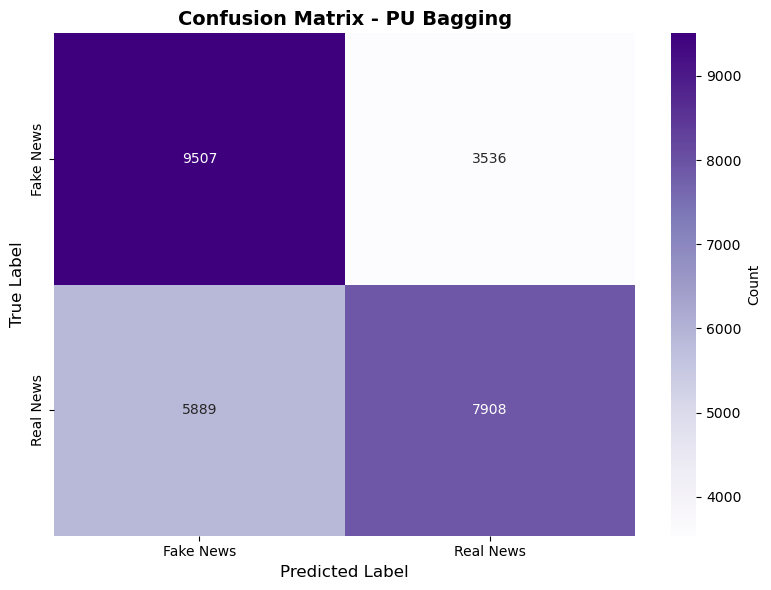

In [88]:
# ==========================
# PU BAGGING CONFUSION MATRIX ANALYSIS
# ==========================

from sklearn.metrics import confusion_matrix
import seaborn as sns

print("\nPU BAGGING CONFUSION MATRIX ANALYSIS")
print("="*50)

# Calculate confusion matrix
cm_bagging = confusion_matrix(y_test, y_pred_bagging)
print("Confusion Matrix:")
print(cm_bagging)

# Extract confusion matrix components
tn_bagging = cm_bagging[0, 0]  # True Negatives
fp_bagging = cm_bagging[0, 1]  # False Positives
fn_bagging = cm_bagging[1, 0]  # False Negatives
tp_bagging = cm_bagging[1, 1]  # True Positives

print(f"\nDetailed Analysis:")
print(f"True Positives (TP): {tp_bagging:,} - Correctly identified real news")
print(f"True Negatives (TN): {tn_bagging:,} - Correctly identified fake news")
print(f"False Positives (FP): {fp_bagging:,} - Real news classified as fake")
print(f"False Negatives (FN): {fn_bagging:,} - Fake news classified as real")

# Calculate rates
fp_rate_bagging = fp_bagging / (fp_bagging + tn_bagging) if (fp_bagging + tn_bagging) > 0 else 0
fn_rate_bagging = fn_bagging / (fn_bagging + tp_bagging) if (fn_bagging + tp_bagging) > 0 else 0
specificity_bagging = tn_bagging / (tn_bagging + fp_bagging) if (tn_bagging + fp_bagging) > 0 else 0
sensitivity_bagging = tp_bagging / (tp_bagging + fn_bagging) if (tp_bagging + fn_bagging) > 0 else 0

print(f"\nError Rates:")
print(f"False Positive Rate: {fp_rate_bagging:.4f} ({fp_rate_bagging*100:.2f}%)")
print(f"False Negative Rate: {fn_rate_bagging:.4f} ({fn_rate_bagging*100:.2f}%)")
print(f"Specificity (True Negative Rate): {specificity_bagging:.4f}")
print(f"Sensitivity (True Positive Rate): {sensitivity_bagging:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_bagging, annot=True, fmt='d', cmap='Purples',
            xticklabels=['Fake News', 'Real News'],
            yticklabels=['Fake News', 'Real News'],
            cbar_kws={'label': 'Count'})
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Confusion Matrix - PU Bagging', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [135]:
# pip install nbformat nbconvert
import nbformat
from nbconvert import PythonExporter
from pathlib import Path

ipynb_path = Path(r"C:/Users/vn212/Downloads/OneDrive_1_11-7-2025/Data Science Project_PU-Copy1.ipynb")
py_path    = Path(r"C:/Users/vn212/Downloads/OneDrive_1_11-7-2025/Testing_code.py")

# Always read ipynb as UTF-8
with ipynb_path.open("r", encoding="utf-8") as f:
    nb = nbformat.read(f, as_version=4)

body, _ = PythonExporter().from_notebook_node(nb)

with py_path.open("w", encoding="utf-8", newline="\n") as f:
    f.write(body)

print(f"Saved: {py_path}")


Saved: C:\Users\vn212\Downloads\OneDrive_1_11-7-2025\Testing_code.py


### PU SVM 

In [90]:
# ==========================
# METHOD 3: IMPROVED PU SVM
#  - Train on PU train-only: pu["X_pos"] (P) + pu["X_unlabeled"] (U)
#  - Evaluate on untouched test split: X_test, y_test
# ==========================

print("\nMETHOD 3: IMPROVED PU SVM")
print("=" * 50)

import time
import numpy as np
from scipy.sparse import vstack as sparse_vstack, issparse
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, matthews_corrcoef, classification_report, confusion_matrix
)

# 1) Build PU training matrix from pu (TRAIN-only)
X_pos        = pu["X_pos"]         # labeled positives (Real = 1)
X_unlabeled  = pu["X_unlabeled"]   # mixed unlabeled pool (Fake + hidden Real)

def _vstack(A, B):
    return sparse_vstack([A, B]) if (issparse(A) or issparse(B)) else np.vstack([A, B])

X_pu = _vstack(X_pos, X_unlabeled)
y_pu = np.concatenate([
    np.ones(X_pos.shape[0], dtype=int),        # labeled positives
    np.zeros(X_unlabeled.shape[0], dtype=int)  # unlabeled placeholder (treated as 0)
])

# 2) Use the matching test split from the 80/20 supervised split
X_test_eval = X_test
y_test_eval = y_test

# 3) SVM pipeline (sparse-safe scaling)
print("Creating SVM pipeline with scaling...")
svm_pipeline = Pipeline([
    ('scaler', StandardScaler(with_mean=False)),  # with_mean=False for sparse matrices
    ('svm', SVC(
        kernel='linear',
        probability=True,
        class_weight='balanced',
        random_state=42,
        max_iter=5000,
        C=1.0,
    ))
])

# 4) Train and evaluate
print("Training Improved PU SVM classifier...")
start_time = time.time()
svm_pipeline.fit(X_pu, y_pu)
training_time_svm = time.time() - start_time

y_pred_svm_pu        = svm_pipeline.predict(X_test_eval)
y_pred_proba_svm_pu  = svm_pipeline.predict_proba(X_test_eval)[:, 1]

accuracy_svm_pu   = accuracy_score(y_test_eval, y_pred_svm_pu)
f1_svm_pu         = f1_score(y_test_eval, y_pred_svm_pu)             # F1 for Real (1)
precision_svm_pu  = precision_score(y_test_eval, y_pred_svm_pu)      # Precision for Real
recall_svm_pu     = recall_score(y_test_eval, y_pred_svm_pu)         # Recall for Real
auc_svm_pu        = roc_auc_score(y_test_eval, y_pred_proba_svm_pu)
mcc_svm_pu        = matthews_corrcoef(y_test_eval, y_pred_svm_pu)

print("Improved PU SVM Performance (TEST):")
print(f"  Accuracy:      {accuracy_svm_pu:.4f}")
print(f"  F1-Score:      {f1_svm_pu:.4f}")
print(f"  Precision:     {precision_svm_pu:.4f}")
print(f"  Recall:        {recall_svm_pu:.4f}")
print(f"  AUC-ROC:       {auc_svm_pu:.4f}")
print(f"  MCC:           {mcc_svm_pu:.4f}")
print(f"  Training Time: {training_time_svm:.2f}s")

print("\nConfusion Matrix:")
cm = confusion_matrix(y_test_eval, y_pred_svm_pu, labels=[0, 1])
tn, fp, fn, tp = cm.ravel()
print("                 Predicted")
print("                 Fake   Real")
print(f"Actual Fake    {tn:6d} {fp:6d}")
print(f"       Real    {fn:6d} {tp:6d}")

print("\nClassification Report:")
print(classification_report(
    y_test_eval, y_pred_svm_pu,
    target_names=['Fake News', 'Real News'],
    digits=4,
    zero_division=0
))



METHOD 3: IMPROVED PU SVM
Creating SVM pipeline with scaling...
Training Improved PU SVM classifier...


C:\Users\vn212\AppData\Local\miniconda3\envs\msu-pu\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Improved PU SVM Performance (TEST):
  Accuracy:      0.5827
  F1-Score:      0.5453
  Precision:     0.6199
  Recall:        0.4866
  AUC-ROC:       0.6192
  MCC:           0.1743
  Training Time: 1030.47s

Confusion Matrix:
                 Predicted
                 Fake   Real
Actual Fake      8927   4116
       Real      7083   6714

Classification Report:
              precision    recall  f1-score   support

   Fake News     0.5576    0.6844    0.6145     13043
   Real News     0.6199    0.4866    0.5453     13797

    accuracy                         0.5827     26840
   macro avg     0.5888    0.5855    0.5799     26840
weighted avg     0.5896    0.5827    0.5789     26840




PU SVM ROC CURVE ANALYSIS


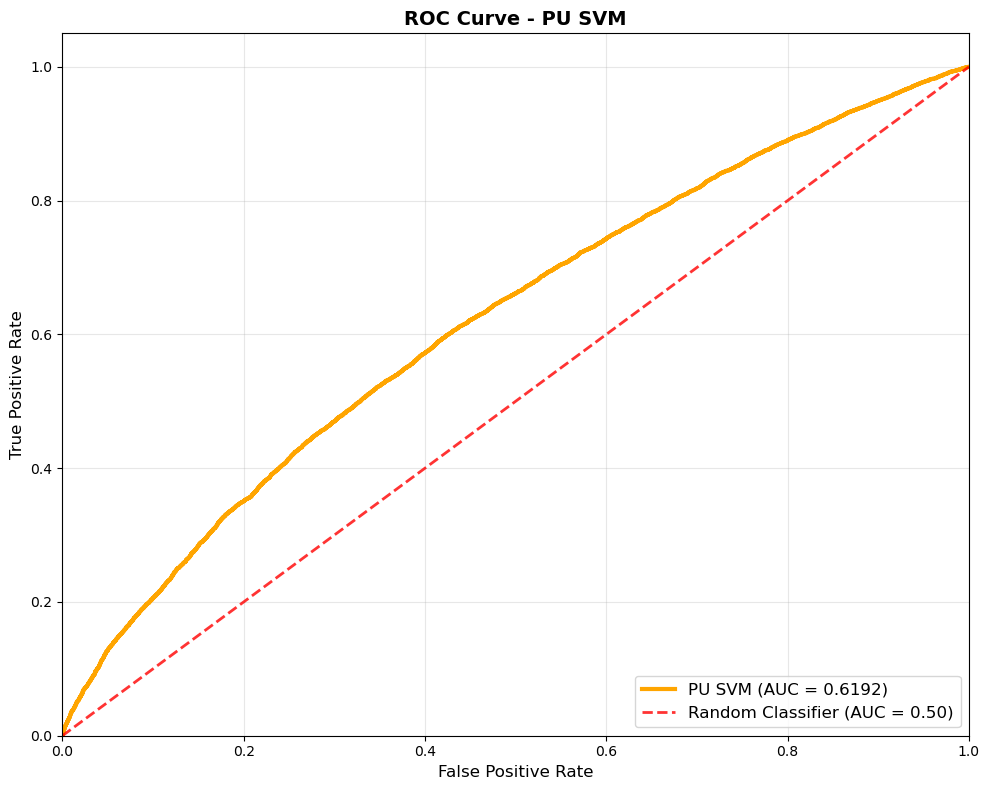

AUC-ROC Score: 0.6192
❌ POOR: Model shows weak discrimination ability


In [91]:
# ==========================
# PU SVM ROC CURVE ANALYSIS
# ==========================

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
import numpy as np

print("\nPU SVM ROC CURVE ANALYSIS")
print("="*50)

# Calculate ROC curve
fpr_svm_pu, tpr_svm_pu, thresholds_roc_svm_pu = roc_curve(y_test_eval, y_pred_proba_svm_pu)
auc_svm_pu = roc_auc_score(y_test_eval, y_pred_proba_svm_pu)

# Plot ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr_svm_pu, tpr_svm_pu, color='orange', lw=3, 
         label=f'PU SVM (AUC = {auc_svm_pu:.4f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--', alpha=0.8, 
         label='Random Classifier (AUC = 0.50)')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('ROC Curve - PU SVM', fontsize=14, fontweight='bold')
plt.legend(loc="lower right", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"AUC-ROC Score: {auc_svm_pu:.4f}")

# ROC curve interpretation
if auc_svm_pu >= 0.9:
    print("✓ EXCELLENT: Model shows outstanding discrimination ability")
elif auc_svm_pu >= 0.8:
    print("✓ GOOD: Model shows good discrimination ability")
elif auc_svm_pu >= 0.7:
    print("⚠ FAIR: Model shows moderate discrimination ability")
else:
    print("❌ POOR: Model shows weak discrimination ability")



PU SVM PRECISION-RECALL CURVE ANALYSIS


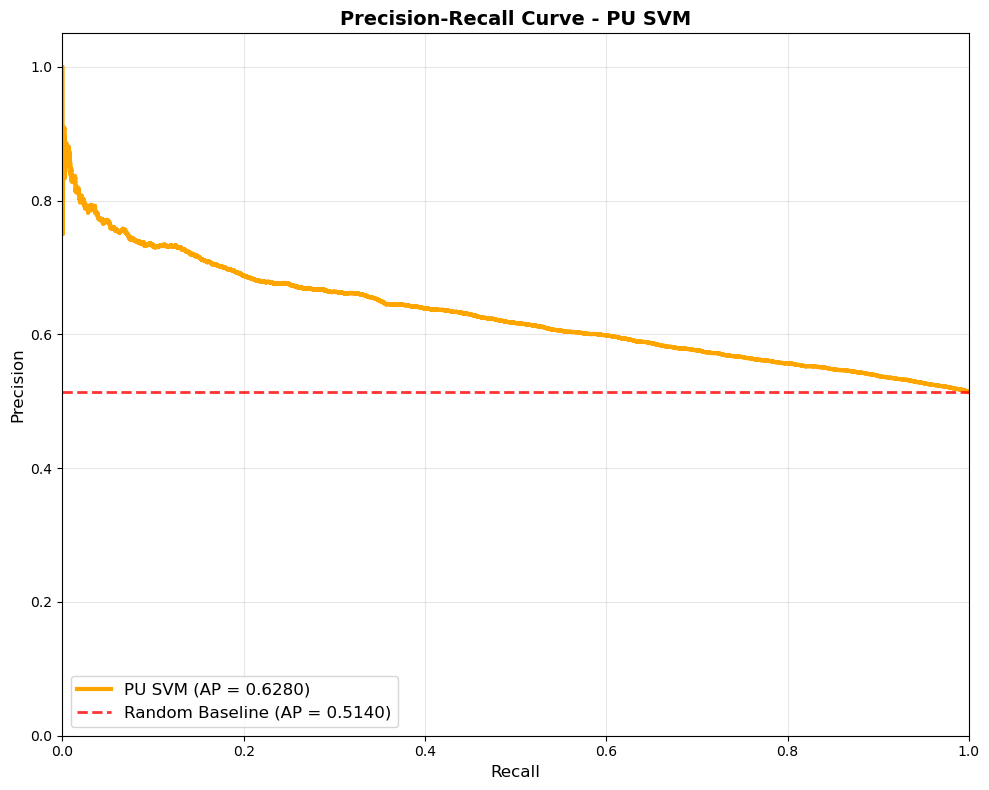

Average Precision: 0.6280
Class Distribution: 13797/26840 = 0.5140
⚠ FAIR: Model shows moderate precision-recall performance


In [92]:
# ==========================
# PU SVM PRECISION-RECALL CURVE ANALYSIS
# ==========================

from sklearn.metrics import precision_recall_curve, average_precision_score

print("\nPU SVM PRECISION-RECALL CURVE ANALYSIS")
print("="*50)

# Calculate Precision-Recall curve
precision_svm_pu, recall_svm_pu, thresholds_pr_svm_pu = precision_recall_curve(y_test_eval, y_pred_proba_svm_pu)
avg_precision_svm_pu = average_precision_score(y_test_eval, y_pred_proba_svm_pu)

# Plot Precision-Recall curve
plt.figure(figsize=(10, 8))
plt.plot(recall_svm_pu, precision_svm_pu, color='orange', lw=3, 
         label=f'PU SVM (AP = {avg_precision_svm_pu:.4f})')

# Add baseline (random classifier)
baseline_svm_pu = np.sum(y_test_eval) / len(y_test_eval)
plt.axhline(y=baseline_svm_pu, color='red', linestyle='--', lw=2, alpha=0.8, 
           label=f'Random Baseline (AP = {baseline_svm_pu:.4f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve - PU SVM', fontsize=14, fontweight='bold')
plt.legend(loc="lower left", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Average Precision: {avg_precision_svm_pu:.4f}")
print(f"Class Distribution: {np.sum(y_test_eval)}/{len(y_test_eval)} = {baseline_svm_pu:.4f}")

# PR curve interpretation
if avg_precision_svm_pu >= 0.8:
    print("✓ EXCELLENT: Model shows outstanding precision-recall performance")
elif avg_precision_svm_pu >= 0.7:
    print("✓ GOOD: Model shows good precision-recall performance")
elif avg_precision_svm_pu >= 0.6:
    print("⚠ FAIR: Model shows moderate precision-recall performance")
else:
    print("❌ POOR: Model shows weak precision-recall performance")



PU SVM CONFUSION MATRIX ANALYSIS
Confusion Matrix:
[[8927 4116]
 [7083 6714]]

Detailed Analysis:
True Positives (TP): 6,714 - Correctly identified real news
True Negatives (TN): 8,927 - Correctly identified fake news
False Positives (FP): 4,116 - Real news classified as fake
False Negatives (FN): 7,083 - Fake news classified as real

Error Rates:
False Positive Rate: 0.3156 (31.56%)
False Negative Rate: 0.5134 (51.34%)
Specificity (True Negative Rate): 0.6844
Sensitivity (True Positive Rate): 0.4866


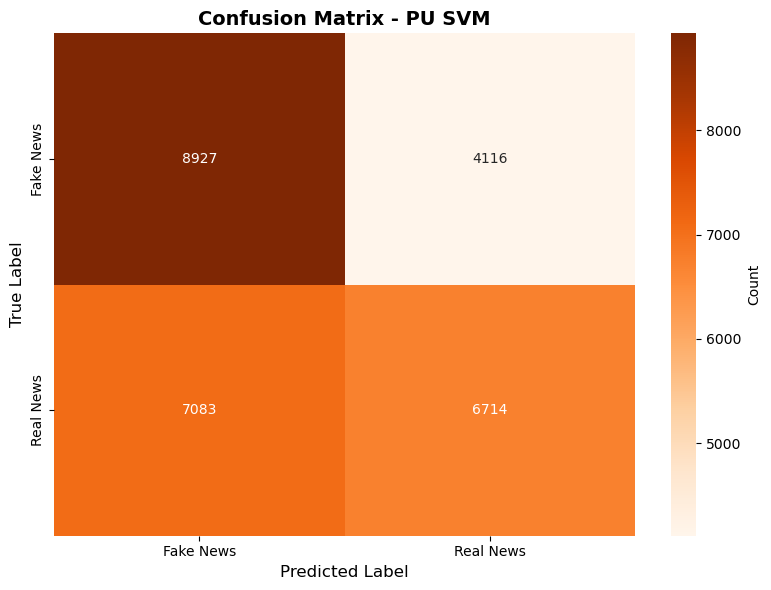

In [93]:
# ==========================
# PU SVM CONFUSION MATRIX ANALYSIS
# ==========================

from sklearn.metrics import confusion_matrix
import seaborn as sns

print("\nPU SVM CONFUSION MATRIX ANALYSIS")
print("="*50)

# Calculate confusion matrix
cm_svm_pu = confusion_matrix(y_test_eval, y_pred_svm_pu)
print("Confusion Matrix:")
print(cm_svm_pu)

# Extract confusion matrix components
tn_svm_pu = cm_svm_pu[0, 0]  # True Negatives
fp_svm_pu = cm_svm_pu[0, 1]  # False Positives
fn_svm_pu = cm_svm_pu[1, 0]  # False Negatives
tp_svm_pu = cm_svm_pu[1, 1]  # True Positives

print(f"\nDetailed Analysis:")
print(f"True Positives (TP): {tp_svm_pu:,} - Correctly identified real news")
print(f"True Negatives (TN): {tn_svm_pu:,} - Correctly identified fake news")
print(f"False Positives (FP): {fp_svm_pu:,} - Real news classified as fake")
print(f"False Negatives (FN): {fn_svm_pu:,} - Fake news classified as real")

# Calculate rates
fp_rate_svm_pu = fp_svm_pu / (fp_svm_pu + tn_svm_pu) if (fp_svm_pu + tn_svm_pu) > 0 else 0
fn_rate_svm_pu = fn_svm_pu / (fn_svm_pu + tp_svm_pu) if (fn_svm_pu + tp_svm_pu) > 0 else 0
specificity_svm_pu = tn_svm_pu / (tn_svm_pu + fp_svm_pu) if (tn_svm_pu + fp_svm_pu) > 0 else 0
sensitivity_svm_pu = tp_svm_pu / (tp_svm_pu + fn_svm_pu) if (tp_svm_pu + fn_svm_pu) > 0 else 0

print(f"\nError Rates:")
print(f"False Positive Rate: {fp_rate_svm_pu:.4f} ({fp_rate_svm_pu*100:.2f}%)")
print(f"False Negative Rate: {fn_rate_svm_pu:.4f} ({fn_rate_svm_pu*100:.2f}%)")
print(f"Specificity (True Negative Rate): {specificity_svm_pu:.4f}")
print(f"Sensitivity (True Positive Rate): {sensitivity_svm_pu:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm_pu, annot=True, fmt='d', cmap='Oranges',
            xticklabels=['Fake News', 'Real News'],
            yticklabels=['Fake News', 'Real News'],
            cbar_kws={'label': 'Count'})
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Confusion Matrix - PU SVM', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Two - step PU learning

In [94]:
# ============================================================
# METHOD 4: IMPROVED TWO-STEP PU LEARNING  —  clean rewrite
#  • Step 1: P vs U scorer → pick RN with balanced criterion
#  • Step 2: Train RF ensemble on P + RN, calibrate, threshold by PR(F1)
# Inputs expected in scope:
#   X_pos (csr), X_unlabeled (csr), X_test_selected (csr), y_test (0/1)
# ============================================================

import time
import numpy as np
from scipy.sparse import vstack as sparse_vstack
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, matthews_corrcoef, classification_report,
    confusion_matrix, precision_recall_curve
)

np.random.seed(42)
X_test_selected = X_test

print("\nMETHOD 4: IMPROVED TWO-STEP PU LEARNING")
print("=" * 60)

# -----------------------------
# Step 1 — temp classifier (P vs U) to score U, then pick RN
# -----------------------------
print("Step 1: Training temporary classifier...")

X_temp = sparse_vstack([X_pos, X_unlabeled])
y_temp = np.concatenate([
    np.ones(X_pos.shape[0], dtype=int),
    np.zeros(X_unlabeled.shape[0], dtype=int)
])

temp_clf = RandomForestClassifier(
    n_estimators=150,
    max_depth=12,             # moderate depth for generalization
    min_samples_split=30,     # conservative splits
    min_samples_leaf=15,      # larger leaves
    max_features="sqrt",
    class_weight="balanced",
    random_state=42,
    n_jobs=-1,
)
temp_clf.fit(X_temp, y_temp)

# score unlabeled pool with P-probabilities
unlabeled_probs = temp_clf.predict_proba(X_unlabeled)[:, 1]

print("\nImproved threshold selection for reliable negatives:")
thresholds_to_try = np.arange(0.15, 0.50, 0.05)

best_threshold = 0.25
best_balanced_score = -1.0
threshold_results = []

for t in thresholds_to_try:
    rn_mask = unlabeled_probs < t
    rn_count = int(rn_mask.sum())
    rn_ratio = rn_count / X_unlabeled.shape[0]

    # require a minimum RN size and avoid very large RN sets (likely impure)
    if rn_count < 2000 or rn_ratio > 0.50:
        continue

    pos_count = X_pos.shape[0]
    balance_ratio = max(pos_count, rn_count) / max(1, min(pos_count, rn_count))

    # composite score: prefer balanced sizes and a reasonable RN fraction
    balance_score = 1.0 / balance_ratio
    sample_adequacy = min(rn_ratio, 0.30) / 0.30
    balanced_score = 0.8 * balance_score + 0.2 * sample_adequacy

    threshold_results.append({
        "threshold": t,
        "rn_count": rn_count,
        "rn_ratio": rn_ratio,
        "balance_ratio": balance_ratio,
        "balanced_score": balanced_score,
    })

    print(f"  t={t:.2f}: RN={rn_count:,} ({rn_ratio:>.1%}) | "
          f"balance={balance_ratio:.2f} | score={balanced_score:.3f}")

    if balanced_score > best_balanced_score:
        best_balanced_score = balanced_score
        best_threshold = t

print(f"\nSelected threshold: {best_threshold:.2f} "
      f"(balanced score: {best_balanced_score:.3f})")

# materialize RN with the chosen threshold
rn_mask = unlabeled_probs < best_threshold
X_rn = X_unlabeled[rn_mask]

print(f"Reliable Negatives Identified: {X_rn.shape[0]:,} / {X_unlabeled.shape[0]:,}")
print(f"Reliable Negative Ratio: {X_rn.shape[0] / X_unlabeled.shape[0]:.3f}")

# -----------------------------
# Step 2 — final model on P + RN, ensemble + calibration
# -----------------------------
print("\nStep 2: Training final classifier with reliable negatives...")
t0 = time.time()

X_final = sparse_vstack([X_pos, X_rn])
y_final = np.concatenate([
    np.ones(X_pos.shape[0], dtype=int),
    np.zeros(X_rn.shape[0], dtype=int)
])

class_balance = max(X_pos.shape[0], X_rn.shape[0]) / max(1, min(X_pos.shape[0], X_rn.shape[0]))
print(f"Final training set: {X_final.shape[0]:,} samples")
print(f"  • Positives: {X_pos.shape[0]:,}")
print(f"  • Reliable negatives: {X_rn.shape[0]:,}")
print(f"  • Class balance ratio (larger/smaller): {class_balance:.2f}")

# RF ensemble (diversified settings)
rf_models = [
    RandomForestClassifier(
        n_estimators=200, max_depth=15, min_samples_split=20, min_samples_leaf=10,
        max_features="sqrt", class_weight="balanced", random_state=42, n_jobs=-1
    ),
    RandomForestClassifier(
        n_estimators=250, max_depth=12, min_samples_split=25, min_samples_leaf=12,
        max_features="log2", class_weight="balanced", random_state=123, n_jobs=-1
    ),
    RandomForestClassifier(
        n_estimators=300, max_depth=18, min_samples_split=15, min_samples_leaf=8,
        max_features="sqrt", class_weight="balanced", random_state=456, n_jobs=-1
    ),
]

print("Training ensemble of Random Forest models...")
for i, m in enumerate(rf_models, start=1):
    m.fit(X_final, y_final)
    print(f"  Model {i} trained")

def ensemble_predict_proba(models, X):
    """Average class-1 probabilities across a list of fitted classifiers."""
    probs = [mdl.predict_proba(X)[:, 1] for mdl in models]
    return np.mean(np.vstack(probs), axis=0)

# ensemble probs on test
p_ens = ensemble_predict_proba(rf_models, X_test_selected)

# probability calibration (using the first RF as representative)
print("Applying probability calibration (isotonic, CV=3) ...")
calibrated = CalibratedClassifierCV(rf_models[0], method="isotonic", cv=3)
calibrated.fit(X_final, y_final)
p_cal = calibrated.predict_proba(X_test_selected)[:, 1]

# blend ensemble + calibrated stream
p_final = 0.5 * (p_ens + p_cal)
training_time = time.time() - t0

# -----------------------------
# Threshold selection (maximize F1 for class=1)
# -----------------------------
print("Optimizing threshold for Two-Step PU Learning (F1)...")

prec, rec, thr = precision_recall_curve(y_test, p_final)
f1 = 2 * (prec * rec) / (prec + rec + 1e-8)
idx = int(np.argmax(f1))
opt_threshold = float(thr[idx]) if idx < len(thr) else 0.5
# keep within a reasonable PU range
opt_threshold = float(np.clip(opt_threshold, 0.20, 0.80))

print(f"Optimal threshold: {opt_threshold:.3f}")

y_pred = (p_final >= opt_threshold).astype(int)

# -----------------------------
# Metrics & reports
# -----------------------------
acc   = accuracy_score(y_test, y_pred)
f1s   = f1_score(y_test, y_pred)
prec_s = precision_score(y_test, y_pred)
rec_s  = recall_score(y_test, y_pred)

try:
    auc = roc_auc_score(y_test, p_final)
except Exception as e:
    print(f"⚠️  AUC calculation failed: {e}")
    auc = 0.5

mcc = matthews_corrcoef(y_test, y_pred)

print("\nImproved Two-Step PU Performance:")
print(f"  Accuracy:   {acc:.4f}")
print(f"  F1-Score:   {f1s:.4f}")
print(f"  Precision:  {prec_s:.4f}")
print(f"  Recall:     {rec_s:.4f}")
print(f"  AUC-ROC:    {auc:.4f}")
print(f"  MCC:        {mcc:.4f}")
print(f"  Train+Blend Time: {training_time:.2f}s")
print(f"  Optimal Threshold: {opt_threshold:.3f}")

print("\nDetailed Classification Report:")
print(classification_report(y_test, y_pred, target_names=["Fake News", "Real News"]))

print("\nConfusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()
print("                 Predicted")
print("                 Fake   Real")
print(f"Actual Fake    {tn:6d} {fp:6d}")
print(f"       Real    {fn:6d} {tp:6d}")



METHOD 4: IMPROVED TWO-STEP PU LEARNING
Step 1: Training temporary classifier...

Improved threshold selection for reliable negatives:
  t=0.35: RN=2,606 (2.9%) | balance=6.35 | score=0.145
  t=0.40: RN=11,661 (12.8%) | balance=1.42 | score=0.649
  t=0.45: RN=30,174 (33.2%) | balance=1.82 | score=0.639

Selected threshold: 0.40 (balanced score: 0.649)
Reliable Negatives Identified: 11,661 / 90,802
Reliable Negative Ratio: 0.128

Step 2: Training final classifier with reliable negatives...
Final training set: 28,217 samples
  • Positives: 16,556
  • Reliable negatives: 11,661
  • Class balance ratio (larger/smaller): 1.42
Training ensemble of Random Forest models...
  Model 1 trained
  Model 2 trained
  Model 3 trained
Applying probability calibration (isotonic, CV=3) ...
Optimizing threshold for Two-Step PU Learning (F1)...
Optimal threshold: 0.772

Improved Two-Step PU Performance:
  Accuracy:   0.7669
  F1-Score:   0.7979
  Precision:  0.7197
  Recall:     0.8950
  AUC-ROC:    0.837


TWO-STEP PU LEARNING ROC CURVE ANALYSIS


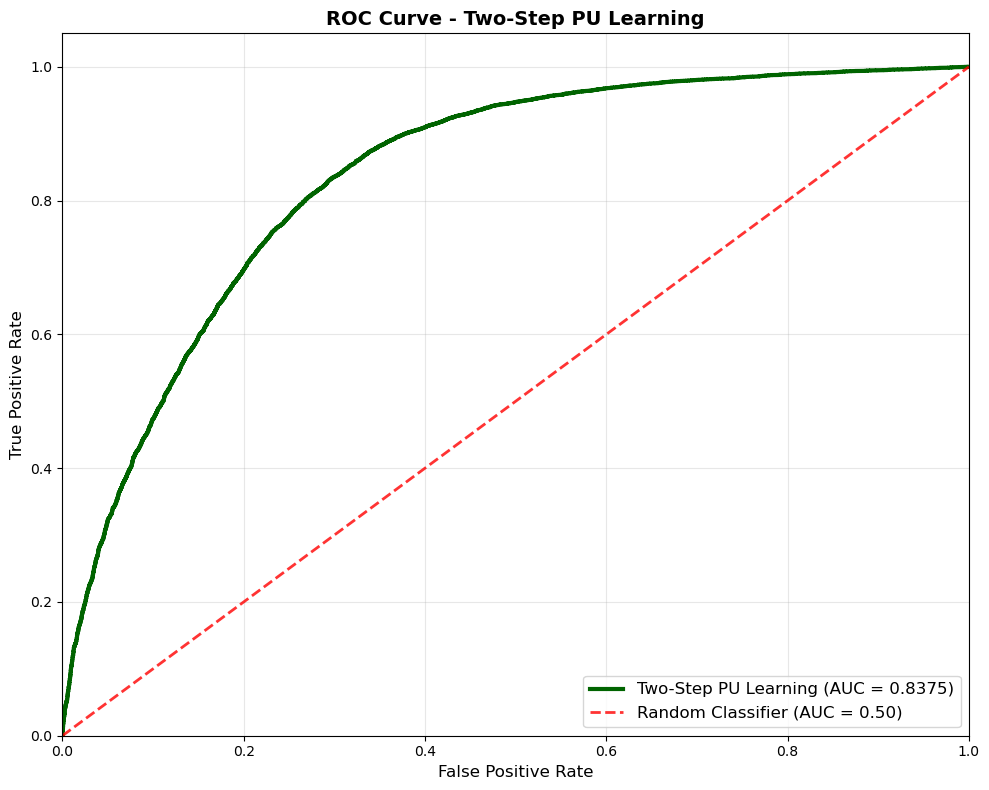

AUC-ROC Score: 0.8375
✓ GOOD: Model shows good discrimination ability


In [95]:
# ==========================
# TWO-STEP PU LEARNING ROC CURVE ANALYSIS
# ==========================

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
import numpy as np

print("\nTWO-STEP PU LEARNING ROC CURVE ANALYSIS")
print("="*50)

# Calculate ROC curve
fpr_twostep, tpr_twostep, thresholds_roc_twostep = roc_curve(y_test, p_final)
auc_twostep = roc_auc_score(y_test, p_final)

# Plot ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr_twostep, tpr_twostep, color='darkgreen', lw=3, 
         label=f'Two-Step PU Learning (AUC = {auc_twostep:.4f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--', alpha=0.8, 
         label='Random Classifier (AUC = 0.50)')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('ROC Curve - Two-Step PU Learning', fontsize=14, fontweight='bold')
plt.legend(loc="lower right", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"AUC-ROC Score: {auc_twostep:.4f}")

# ROC curve interpretation
if auc_twostep >= 0.9:
    print("✓ EXCELLENT: Model shows outstanding discrimination ability")
elif auc_twostep >= 0.8:
    print("✓ GOOD: Model shows good discrimination ability")
elif auc_twostep >= 0.7:
    print("⚠ FAIR: Model shows moderate discrimination ability")
else:
    print("❌ POOR: Model shows weak discrimination ability")



TWO-STEP PU LEARNING PRECISION-RECALL CURVE ANALYSIS


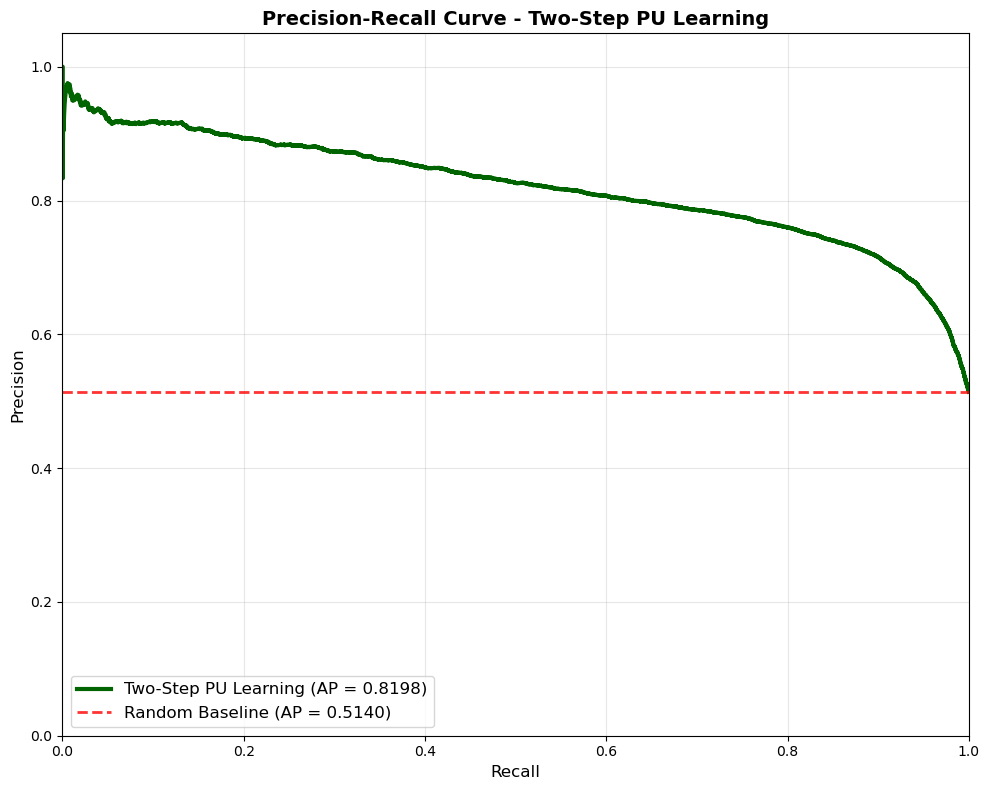

Average Precision: 0.8198
Class Distribution: 13797/26840 = 0.5140
✓ EXCELLENT: Model shows outstanding precision-recall performance


In [96]:
# ==========================
# TWO-STEP PU LEARNING PRECISION-RECALL CURVE ANALYSIS
# ==========================

from sklearn.metrics import precision_recall_curve, average_precision_score

print("\nTWO-STEP PU LEARNING PRECISION-RECALL CURVE ANALYSIS")
print("="*50)

# Calculate Precision-Recall curve
precision_twostep, recall_twostep, thresholds_pr_twostep = precision_recall_curve(y_test, p_final)
avg_precision_twostep = average_precision_score(y_test, p_final)

# Plot Precision-Recall curve
plt.figure(figsize=(10, 8))
plt.plot(recall_twostep, precision_twostep, color='darkgreen', lw=3, 
         label=f'Two-Step PU Learning (AP = {avg_precision_twostep:.4f})')

# Add baseline (random classifier)
baseline_twostep = np.sum(y_test) / len(y_test)
plt.axhline(y=baseline_twostep, color='red', linestyle='--', lw=2, alpha=0.8, 
           label=f'Random Baseline (AP = {baseline_twostep:.4f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve - Two-Step PU Learning', fontsize=14, fontweight='bold')
plt.legend(loc="lower left", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Average Precision: {avg_precision_twostep:.4f}")
print(f"Class Distribution: {np.sum(y_test)}/{len(y_test)} = {baseline_twostep:.4f}")

# PR curve interpretation
if avg_precision_twostep >= 0.8:
    print("✓ EXCELLENT: Model shows outstanding precision-recall performance")
elif avg_precision_twostep >= 0.7:
    print("✓ GOOD: Model shows good precision-recall performance")
elif avg_precision_twostep >= 0.6:
    print("⚠ FAIR: Model shows moderate precision-recall performance")
else:
    print("❌ POOR: Model shows weak precision-recall performance")



TWO-STEP PU LEARNING CONFUSION MATRIX ANALYSIS
Confusion Matrix:
[[ 8235  4808]
 [ 1449 12348]]

Detailed Analysis:
True Positives (TP): 12,348 - Correctly identified real news
True Negatives (TN): 8,235 - Correctly identified fake news
False Positives (FP): 4,808 - Real news classified as fake
False Negatives (FN): 1,449 - Fake news classified as real

Error Rates:
False Positive Rate: 0.3686 (36.86%)
False Negative Rate: 0.1050 (10.50%)
Specificity (True Negative Rate): 0.6314
Sensitivity (True Positive Rate): 0.8950


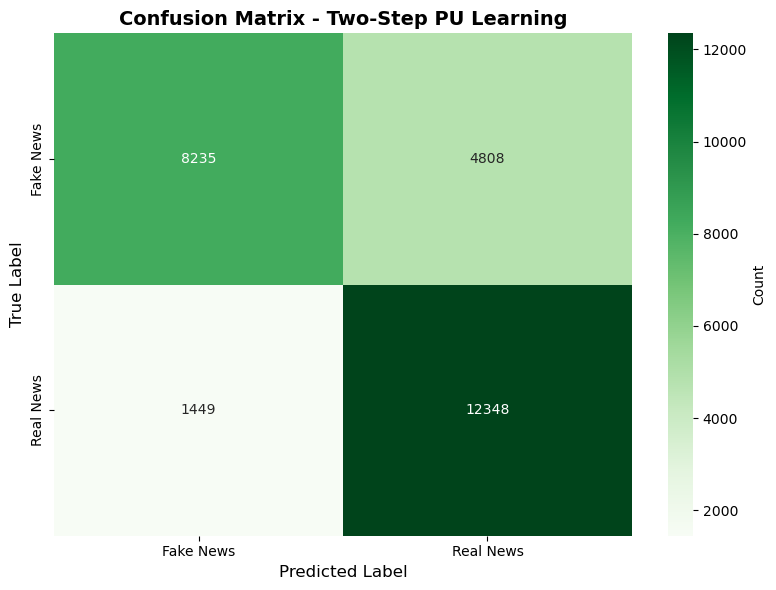

In [97]:
# ==========================
# TWO-STEP PU LEARNING CONFUSION MATRIX ANALYSIS
# ==========================

from sklearn.metrics import confusion_matrix
import seaborn as sns

print("\nTWO-STEP PU LEARNING CONFUSION MATRIX ANALYSIS")
print("="*50)

# Calculate confusion matrix (reuse existing cm or recalculate)
cm_twostep = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm_twostep)

# Extract confusion matrix components
tn_twostep = cm_twostep[0, 0]  # True Negatives
fp_twostep = cm_twostep[0, 1]  # False Positives
fn_twostep = cm_twostep[1, 0]  # False Negatives
tp_twostep = cm_twostep[1, 1]  # True Positives

print(f"\nDetailed Analysis:")
print(f"True Positives (TP): {tp_twostep:,} - Correctly identified real news")
print(f"True Negatives (TN): {tn_twostep:,} - Correctly identified fake news")
print(f"False Positives (FP): {fp_twostep:,} - Real news classified as fake")
print(f"False Negatives (FN): {fn_twostep:,} - Fake news classified as real")

# Calculate rates
fp_rate_twostep = fp_twostep / (fp_twostep + tn_twostep) if (fp_twostep + tn_twostep) > 0 else 0
fn_rate_twostep = fn_twostep / (fn_twostep + tp_twostep) if (fn_twostep + tp_twostep) > 0 else 0
specificity_twostep = tn_twostep / (tn_twostep + fp_twostep) if (tn_twostep + fp_twostep) > 0 else 0
sensitivity_twostep = tp_twostep / (tp_twostep + fn_twostep) if (tp_twostep + fn_twostep) > 0 else 0

print(f"\nError Rates:")
print(f"False Positive Rate: {fp_rate_twostep:.4f} ({fp_rate_twostep*100:.2f}%)")
print(f"False Negative Rate: {fn_rate_twostep:.4f} ({fn_rate_twostep*100:.2f}%)")
print(f"Specificity (True Negative Rate): {specificity_twostep:.4f}")
print(f"Sensitivity (True Positive Rate): {sensitivity_twostep:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_twostep, annot=True, fmt='d', cmap='Greens',
            xticklabels=['Fake News', 'Real News'],
            yticklabels=['Fake News', 'Real News'],
            cbar_kws={'label': 'Count'})
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Confusion Matrix - Two-Step PU Learning', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

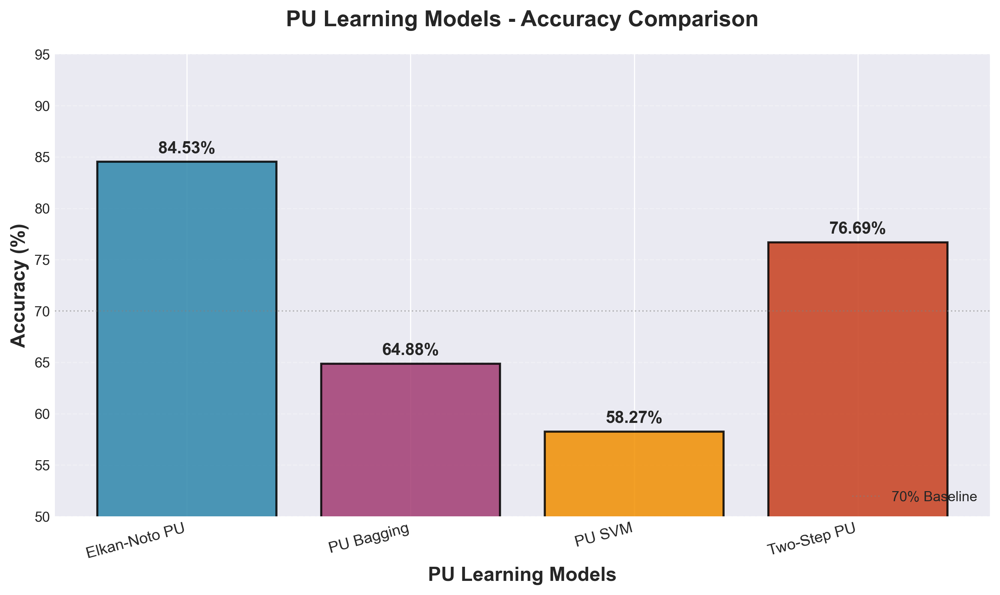

In [136]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Set style for professional presentation
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Data from your metrics table
models = ['Elkan-Noto PU', 'PU Bagging', 'PU SVM', 'Two-Step PU']
accuracy = [84.53, 64.88, 58.27, 76.69]

# Create figure with high DPI for PPT
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

# Create bar chart with gradient colors
colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D']
bars = ax.bar(models, accuracy, color=colors, alpha=0.85, edgecolor='black', linewidth=1.5)

# Add value labels on top of bars
for i, (bar, acc) in enumerate(zip(bars, accuracy)):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 0.5,
            f'{acc:.2f}%',
            ha='center', va='bottom', fontsize=12, fontweight='bold')

# Customize axes
ax.set_ylabel('Accuracy (%)', fontsize=14, fontweight='bold')
ax.set_xlabel('PU Learning Models', fontsize=14, fontweight='bold')
ax.set_title('PU Learning Models - Accuracy Comparison', 
             fontsize=16, fontweight='bold', pad=20)
ax.set_ylim([50, 95])
ax.grid(axis='y', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

# Rotate x-axis labels if needed
plt.xticks(rotation=15, ha='right', fontsize=11)

# Add horizontal reference line at 70%
ax.axhline(y=70, color='gray', linestyle=':', linewidth=1, alpha=0.5, label='70% Baseline')
ax.legend(loc='lower right', fontsize=10)

plt.tight_layout()
plt.savefig('pu_accuracy_comparison.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

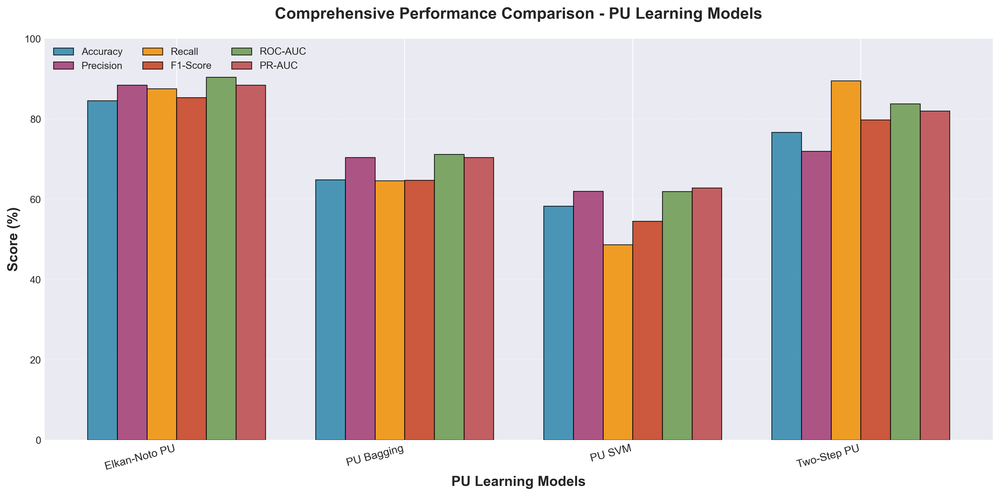

In [137]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Data from your metrics table
data = {
    'Model': ['Elkan-Noto PU', 'PU Bagging', 'PU SVM', 'Two-Step PU'],
    'Accuracy': [84.53, 64.88, 58.27, 76.69],
    'Precision': [88.41, 70.39, 61.99, 71.97],
    'Recall': [87.53, 64.59, 48.66, 89.50],
    'F1-Score': [85.33, 64.76, 54.53, 79.79],
    'ROC-AUC': [90.40, 71.16, 61.92, 83.75],
    'PR-AUC': [88.41, 70.39, 62.80, 81.98]
}

df = pd.DataFrame(data)

# Create grouped bar chart
fig, ax = plt.subplots(figsize=(14, 7), dpi=300)

x = np.arange(len(df['Model']))
width = 0.13
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC', 'PR-AUC']
colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#6A994E', '#BC4749']

for i, (metric, color) in enumerate(zip(metrics, colors)):
    values = df[metric].values
    offset = (i - len(metrics)/2) * width + width/2
    bars = ax.bar(x + offset, values, width, label=metric, color=color, alpha=0.85, 
                  edgecolor='black', linewidth=0.8)

# Customize
ax.set_xlabel('PU Learning Models', fontsize=14, fontweight='bold')
ax.set_ylabel('Score (%)', fontsize=14, fontweight='bold')
ax.set_title('Comprehensive Performance Comparison - PU Learning Models', 
             fontsize=16, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(df['Model'], rotation=15, ha='right', fontsize=11)
ax.legend(loc='upper left', ncol=3, fontsize=10, framealpha=0.9)
ax.set_ylim([0, 100])
ax.grid(axis='y', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

plt.tight_layout()
plt.savefig('pu_multi_metric_comparison.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

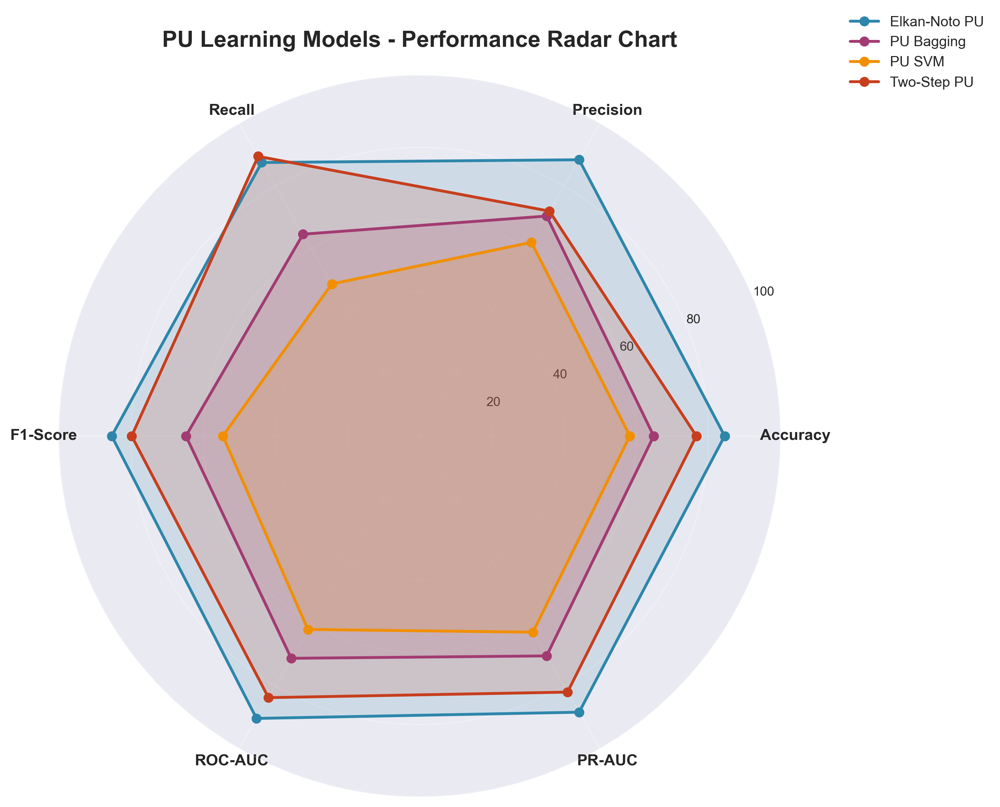

In [138]:
import matplotlib.pyplot as plt
import numpy as np
from math import pi

# Data
models = ['Elkan-Noto PU', 'PU Bagging', 'PU SVM', 'Two-Step PU']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC', 'PR-AUC']

data = {
    'Elkan-Noto PU': [84.53, 88.41, 87.53, 85.33, 90.40, 88.41],
    'PU Bagging': [64.88, 70.39, 64.59, 64.76, 71.16, 70.39],
    'PU SVM': [58.27, 61.99, 48.66, 54.53, 61.92, 62.80],
    'Two-Step PU': [76.69, 71.97, 89.50, 79.79, 83.75, 81.98]
}

# Number of variables
N = len(metrics)

# Compute angle for each metric
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]  # Complete the circle

# Create figure
fig, ax = plt.subplots(figsize=(10, 10), dpi=300, subplot_kw=dict(projection='polar'))

# Colors for each model
colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D']

# Plot each model
for idx, (model, color) in enumerate(zip(models, colors)):
    values = data[model]
    values += values[:1]  # Complete the circle
    
    ax.plot(angles, values, 'o-', linewidth=2, label=model, color=color)
    ax.fill(angles, values, alpha=0.15, color=color)

# Add metric labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(metrics, fontsize=11, fontweight='bold')
ax.set_ylim(0, 100)
ax.set_yticks([20, 40, 60, 80, 100])
ax.set_yticklabels(['20', '40', '60', '80', '100'], fontsize=9)
ax.grid(True, alpha=0.3)

ax.set_title('PU Learning Models - Performance Radar Chart', 
             size=16, fontweight='bold', pad=20)

plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=10)
plt.tight_layout()
plt.savefig('pu_radar_chart.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

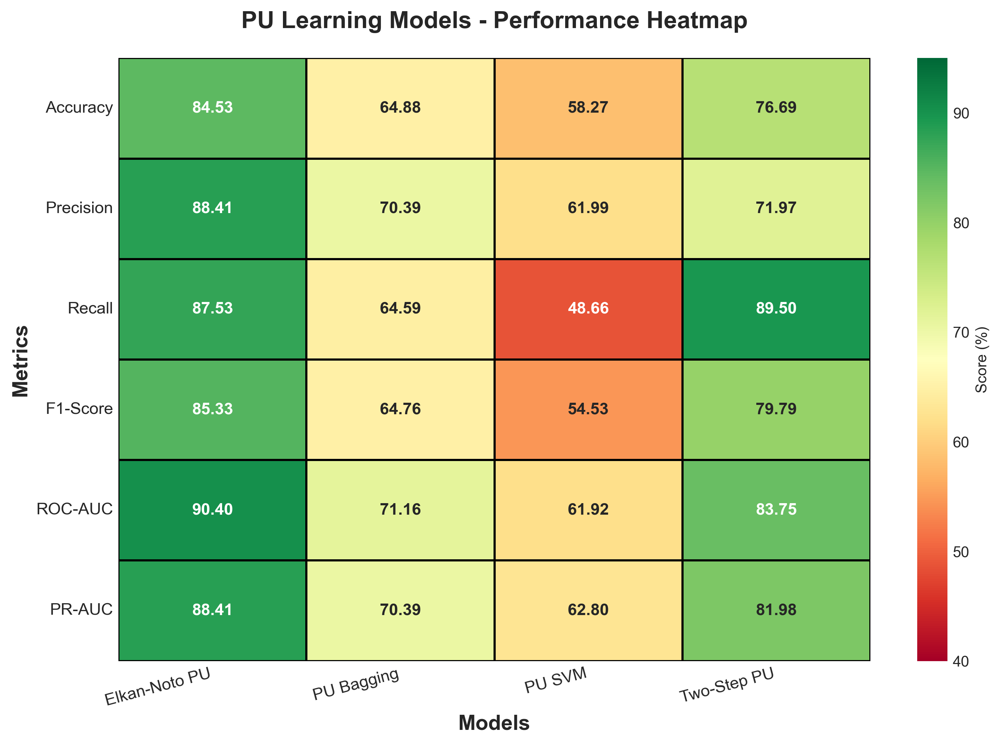

In [139]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Prepare data
data = {
    'Elkan-Noto PU': [84.53, 88.41, 87.53, 85.33, 90.40, 88.41],
    'PU Bagging': [64.88, 70.39, 64.59, 64.76, 71.16, 70.39],
    'PU SVM': [58.27, 61.99, 48.66, 54.53, 61.92, 62.80],
    'Two-Step PU': [76.69, 71.97, 89.50, 79.79, 83.75, 81.98]
}

metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC', 'PR-AUC']
df = pd.DataFrame(data, index=metrics)

# Create heatmap
fig, ax = plt.subplots(figsize=(10, 7), dpi=300)

sns.heatmap(df, annot=True, fmt='.2f', cmap='RdYlGn', vmin=40, vmax=95,
            cbar_kws={'label': 'Score (%)'}, linewidths=1, linecolor='black',
            square=False, ax=ax, annot_kws={'size': 11, 'weight': 'bold'})

ax.set_title('PU Learning Models - Performance Heatmap', 
             fontsize=16, fontweight='bold', pad=20)
ax.set_xlabel('Models', fontsize=14, fontweight='bold')
ax.set_ylabel('Metrics', fontsize=14, fontweight='bold')

plt.xticks(rotation=15, ha='right', fontsize=11)
plt.yticks(rotation=0, fontsize=11)
plt.tight_layout()
plt.savefig('pu_heatmap.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

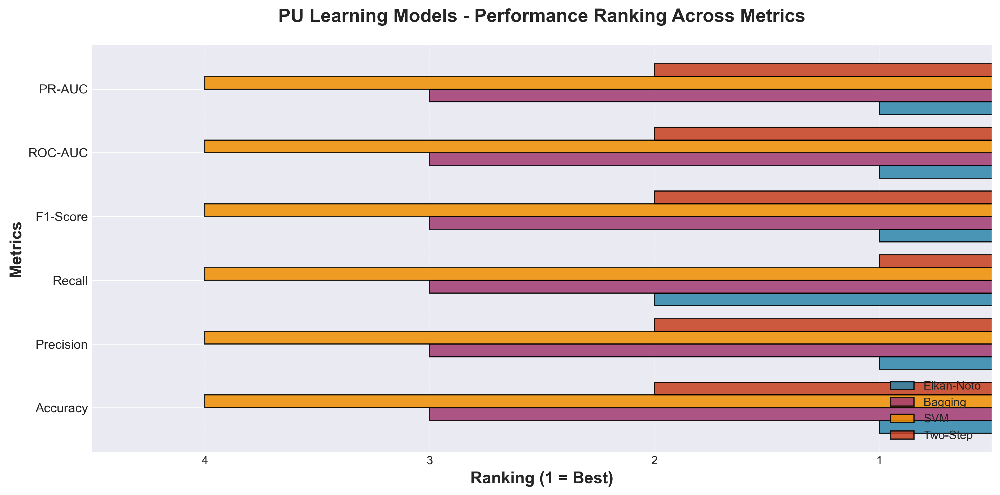

In [142]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Create ranking data
data = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC', 'PR-AUC'],
    'Elkan-Noto PU': [1, 1, 2, 1, 1, 1],  # Rankings (1=best)
    'PU Bagging': [3, 3, 3, 3, 3, 3],
    'PU SVM': [4, 4, 4, 4, 4, 4],
    'Two-Step PU': [2, 2, 1, 2, 2, 2]
}

df_rank = pd.DataFrame(data)

# Create horizontal bar chart for rankings
fig, ax = plt.subplots(figsize=(12, 6), dpi=300)

metrics = df_rank['Metric']
x_pos = np.arange(len(metrics))
width = 0.2

colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D']
models_short = ['Elkan-Noto', 'Bagging', 'SVM', 'Two-Step']

for i, (model, color) in enumerate(zip(['Elkan-Noto PU', 'PU Bagging', 'PU SVM', 'Two-Step PU'], colors)):
    rankings = df_rank[model].values
    bars = ax.barh(x_pos + i*width, rankings, width, label=models_short[i], 
                   color=color, alpha=0.85, edgecolor='black', linewidth=1)

ax.set_xlabel('Ranking (1 = Best)', fontsize=14, fontweight='bold')
ax.set_ylabel('Metrics', fontsize=14, fontweight='bold')
ax.set_title('PU Learning Models - Performance Ranking Across Metrics', 
             fontsize=16, fontweight='bold', pad=20)
ax.set_yticks(x_pos + width * 1.5)
ax.set_yticklabels(metrics, fontsize=11)
ax.set_xlim([0.5, 4.5])
ax.set_xticks([1, 2, 3, 4])
ax.invert_xaxis()  # Best rank (1) on the right
ax.legend(loc='lower right', fontsize=10, framealpha=0.9)
ax.grid(axis='x', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

plt.tight_layout()
plt.savefig('pu_ranking_chart.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

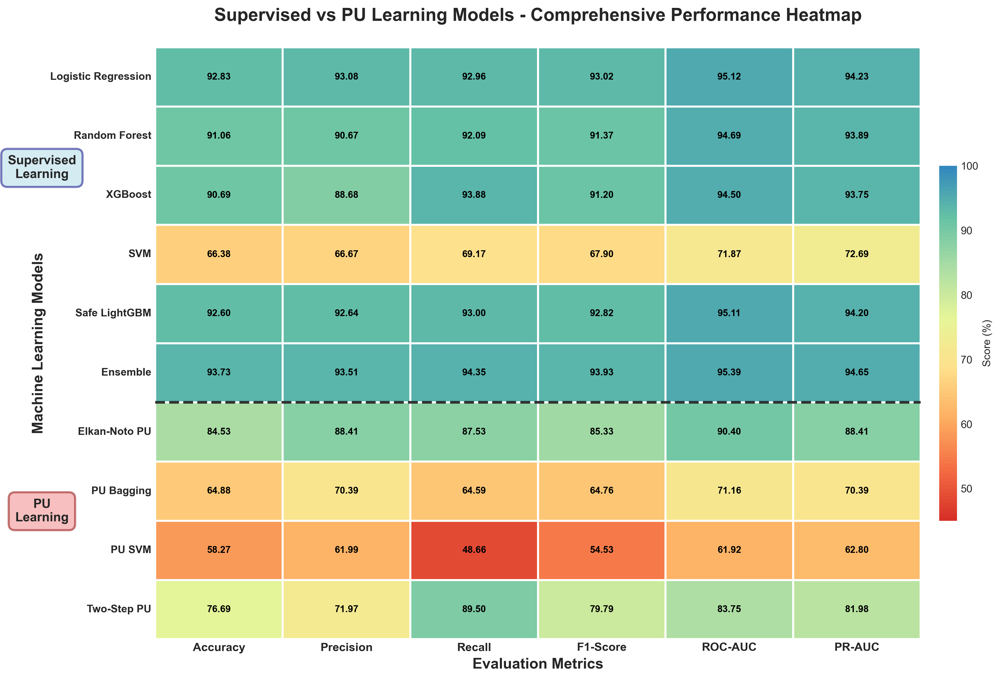


COMBINED PERFORMANCE TABLE
                     Accuracy  Precision  Recall  F1-Score  ROC-AUC  PR-AUC
Logistic Regression     92.83      93.08   92.96     93.02    95.12   94.23
Random Forest           91.06      90.67   92.09     91.37    94.69   93.89
XGBoost                 90.69      88.68   93.88     91.20    94.50   93.75
SVM                     66.38      66.67   69.17     67.90    71.87   72.69
Safe LightGBM           92.60      92.64   93.00     92.82    95.11   94.20
Ensemble                93.73      93.51   94.35     93.93    95.39   94.65
Elkan-Noto PU           84.53      88.41   87.53     85.33    90.40   88.41
PU Bagging              64.88      70.39   64.59     64.76    71.16   70.39
PU SVM                  58.27      61.99   48.66     54.53    61.92   62.80
Two-Step PU             76.69      71.97   89.50     79.79    83.75   81.98

SUMMARY STATISTICS

📊 Supervised Learning Models:
       Accuracy  Precision  Recall  F1-Score  ROC-AUC  PR-AUC
count      6.00       6

In [145]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Set style for professional presentation
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

# ============================================
# SUPERVISED LEARNING MODELS (Complete with Precision)
# ============================================
supervised_scores = {
    "Logistic Regression": {
        'Accuracy': 92.83,
        'Precision': 93.08,
        'Recall': 92.96,
        'F1-Score': 93.02,
        'ROC-AUC': 95.12,
        'PR-AUC': 94.23
    },
    "Random Forest": {
        'Accuracy': 91.06,
        'Precision': 90.67,
        'Recall': 92.09,
        'F1-Score': 91.37,
        'ROC-AUC': 94.69,
        'PR-AUC': 93.89
    },
    "XGBoost": {
        'Accuracy': 90.69,
        'Precision': 88.68,
        'Recall': 93.88,
        'F1-Score': 91.20,
        'ROC-AUC': 94.50,
        'PR-AUC': 93.75
    },
    "SVM": {
        'Accuracy': 66.38,
        'Precision': 66.67,
        'Recall': 69.17,
        'F1-Score': 67.90,
        'ROC-AUC': 71.87,
        'PR-AUC': 72.69
    },
    "Safe LightGBM": {
        'Accuracy': 92.60,
        'Precision': 92.64,
        'Recall': 93.00,
        'F1-Score': 92.82,
        'ROC-AUC': 95.11,
        'PR-AUC': 94.20
    },
    "Ensemble": {
        'Accuracy': 93.73,
        'Precision': 93.51,
        'Recall': 94.35,
        'F1-Score': 93.93,
        'ROC-AUC': 95.39,
        'PR-AUC': 94.65
    }
}

# ============================================
# PU LEARNING MODELS
# ============================================
pu_scores = {
    "Elkan-Noto PU": {
        'Accuracy': 84.53,
        'Precision': 88.41,
        'Recall': 87.53,
        'F1-Score': 85.33,
        'ROC-AUC': 90.40,
        'PR-AUC': 88.41
    },
    "PU Bagging": {
        'Accuracy': 64.88,
        'Precision': 70.39,
        'Recall': 64.59,
        'F1-Score': 64.76,
        'ROC-AUC': 71.16,
        'PR-AUC': 70.39
    },
    "PU SVM": {
        'Accuracy': 58.27,
        'Precision': 61.99,
        'Recall': 48.66,
        'F1-Score': 54.53,
        'ROC-AUC': 61.92,
        'PR-AUC': 62.80
    },
    "Two-Step PU": {
        'Accuracy': 76.69,
        'Precision': 71.97,
        'Recall': 89.50,
        'F1-Score': 79.79,
        'ROC-AUC': 83.75,
        'PR-AUC': 81.98
    }
}

# ============================================
# COMBINE ALL MODELS
# ============================================
combined_data = {**supervised_scores, **pu_scores}

# Create DataFrame
df_combined = pd.DataFrame.from_dict(combined_data, orient='index')

# Define metric order
metric_order = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC', 'PR-AUC']
df_combined = df_combined[metric_order]

# Sort models: Supervised first, then PU Learning
model_order = [
    'Logistic Regression', 'Random Forest', 'XGBoost', 'SVM', 
    'Safe LightGBM', 'Ensemble',
    'Elkan-Noto PU', 'PU Bagging', 'PU SVM', 'Two-Step PU'
]
df_combined = df_combined.reindex(model_order)

# ============================================
# CREATE HEATMAP
# ============================================
fig, ax = plt.subplots(figsize=(14, 9), dpi=300)

# Create custom colormap (red to green gradient)
colors = ['#d73027', '#f46d43', '#fdae61', '#fee08b', '#e6f598', '#abdda4', '#66c2a5', '#3288bd']
n_bins = 100
cmap = LinearSegmentedColormap.from_list('custom_rdylgn', colors, N=n_bins)

# Create heatmap - FIXED: removed duplicate cbar_kws
heatmap = sns.heatmap(
    df_combined,
    annot=True,
    fmt='.2f',
    cmap=cmap,
    vmin=45,
    vmax=100,
    cbar_kws={'label': 'Score (%)', 'shrink': 0.6, 'pad': 0.02},  # Only once!
    linewidths=1.5,
    linecolor='white',
    square=False,
    ax=ax,
    annot_kws={'size': 9, 'weight': 'bold', 'color': 'black'}
)

# Customize title and labels
ax.set_title('Supervised vs PU Learning Models - Comprehensive Performance Heatmap', 
             fontsize=17, fontweight='bold', pad=25)
ax.set_xlabel('Evaluation Metrics', fontsize=14, fontweight='bold')
ax.set_ylabel('Machine Learning Models', fontsize=14, fontweight='bold')

# Rotate labels
plt.xticks(rotation=0, fontsize=11, fontweight='bold')
plt.yticks(rotation=0, fontsize=10, fontweight='bold')

# Add separator line between supervised and PU models
ax.axhline(y=6, color='black', linewidth=2.5, linestyle='--', alpha=0.8)

# Add section labels
fig.text(0.02, 0.75, 'Supervised\nLearning', fontsize=12, fontweight='bold',
         bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.5, edgecolor='navy', linewidth=2),
         ha='center', va='center')
fig.text(0.02, 0.25, 'PU\nLearning', fontsize=12, fontweight='bold',
         bbox=dict(boxstyle='round,pad=0.5', facecolor='lightcoral', alpha=0.5, edgecolor='darkred', linewidth=2),
         ha='center', va='center')

plt.tight_layout()
plt.savefig('supervised_vs_pu_comprehensive_heatmap.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================
# DISPLAY SUMMARY STATISTICS
# ============================================
print("\n" + "="*80)
print("COMBINED PERFORMANCE TABLE")
print("="*80)
print(df_combined.round(2))

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print("\n📊 Supervised Learning Models:")
print(df_combined.iloc[:6].describe().round(2))

print("\n📊 PU Learning Models:")
print(df_combined.iloc[6:].describe().round(2))

print("\n" + "="*80)
print("BEST PERFORMERS BY METRIC")
print("="*80)
for metric in metric_order:
    best_model = df_combined[metric].idxmax()
    best_score = df_combined[metric].max()
    print(f"  {metric:12s}: {best_model:20s} ({best_score:.2f}%)")

print("\n" + "="*80)
print("OVERALL AVERAGE PERFORMANCE")
print("="*80)
print(f"  Supervised Learning Average: {df_combined.iloc[:6].mean().mean():.2f}%")
print(f"  PU Learning Average:          {df_combined.iloc[6:].mean().mean():.2f}%")
print(f"  Overall Average:             {df_combined.mean().mean():.2f}%")

C:\Users\vn212\AppData\Local\Temp\ipykernel_1808\831798254.py:56: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(metrics, rotation=15, ha='right', fontsize=10)


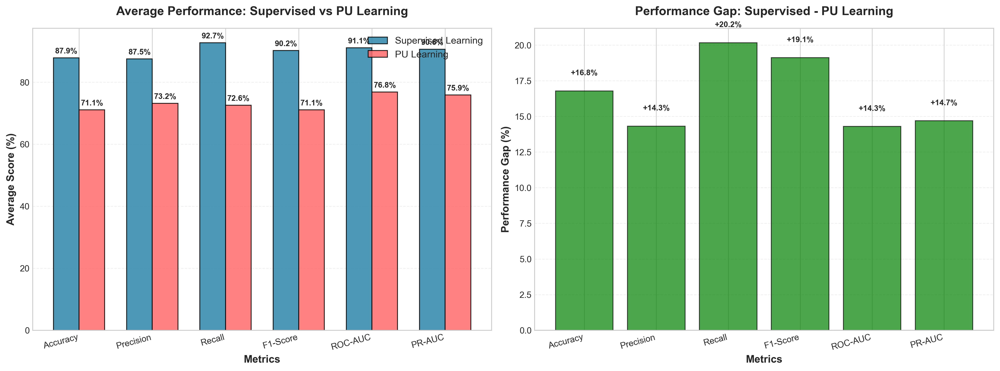

In [146]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Calculate average scores
supervised_avg = {
    'Accuracy': 87.88, 'Precision': 87.51, 'Recall': 92.74, 
    'F1-Score': 90.22, 'ROC-AUC': 91.11, 'PR-AUC': 90.60
}

pu_avg = {
    'Accuracy': 71.09, 'Precision': 73.19, 'Recall': 72.57, 
    'F1-Score': 71.10, 'ROC-AUC': 76.81, 'PR-AUC': 75.90
}

metrics = list(supervised_avg.keys())
supervised_values = [supervised_avg[m] for m in metrics]
pu_values = [pu_avg[m] for m in metrics]
gaps = [s - p for s, p in zip(supervised_values, pu_values)]

x = np.arange(len(metrics))
width = 0.35

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), dpi=300)

# Plot 1: Side-by-side comparison
ax1.bar(x - width/2, supervised_values, width, label='Supervised Learning', 
        color='#2E86AB', alpha=0.85, edgecolor='black', linewidth=1)
ax1.bar(x + width/2, pu_values, width, label='PU Learning', 
        color='#FF6B6B', alpha=0.85, edgecolor='black', linewidth=1)

ax1.set_xlabel('Metrics', fontsize=12, fontweight='bold')
ax1.set_ylabel('Average Score (%)', fontsize=12, fontweight='bold')
ax1.set_title('Average Performance: Supervised vs PU Learning', 
              fontsize=14, fontweight='bold', pad=15)
ax1.set_xticks(x)
ax1.set_xticklabels(metrics, rotation=15, ha='right', fontsize=10)
ax1.legend(fontsize=11, framealpha=0.9)
ax1.grid(axis='y', alpha=0.3, linestyle='--')
ax1.set_axisbelow(True)

# Add value labels
for i, (s, p) in enumerate(zip(supervised_values, pu_values)):
    ax1.text(i - width/2, s + 1, f'{s:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='bold')
    ax1.text(i + width/2, p + 1, f'{p:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='bold')

# Plot 2: Performance gap
colors_gap = ['green' if g > 0 else 'red' for g in gaps]
bars = ax2.bar(metrics, gaps, color=colors_gap, alpha=0.7, edgecolor='black', linewidth=1)

ax2.axhline(y=0, color='black', linestyle='-', linewidth=1)
ax2.set_xlabel('Metrics', fontsize=12, fontweight='bold')
ax2.set_ylabel('Performance Gap (%)', fontsize=12, fontweight='bold')
ax2.set_title('Performance Gap: Supervised - PU Learning', 
              fontsize=14, fontweight='bold', pad=15)
ax2.set_xticklabels(metrics, rotation=15, ha='right', fontsize=10)
ax2.grid(axis='y', alpha=0.3, linestyle='--')
ax2.set_axisbelow(True)

# Add value labels
for i, (bar, gap) in enumerate(zip(bars, gaps)):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + (1 if height > 0 else -3),
             f'{gap:+.1f}%', ha='center', va='bottom' if height > 0 else 'top', 
             fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig('performance_gap_analysis.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

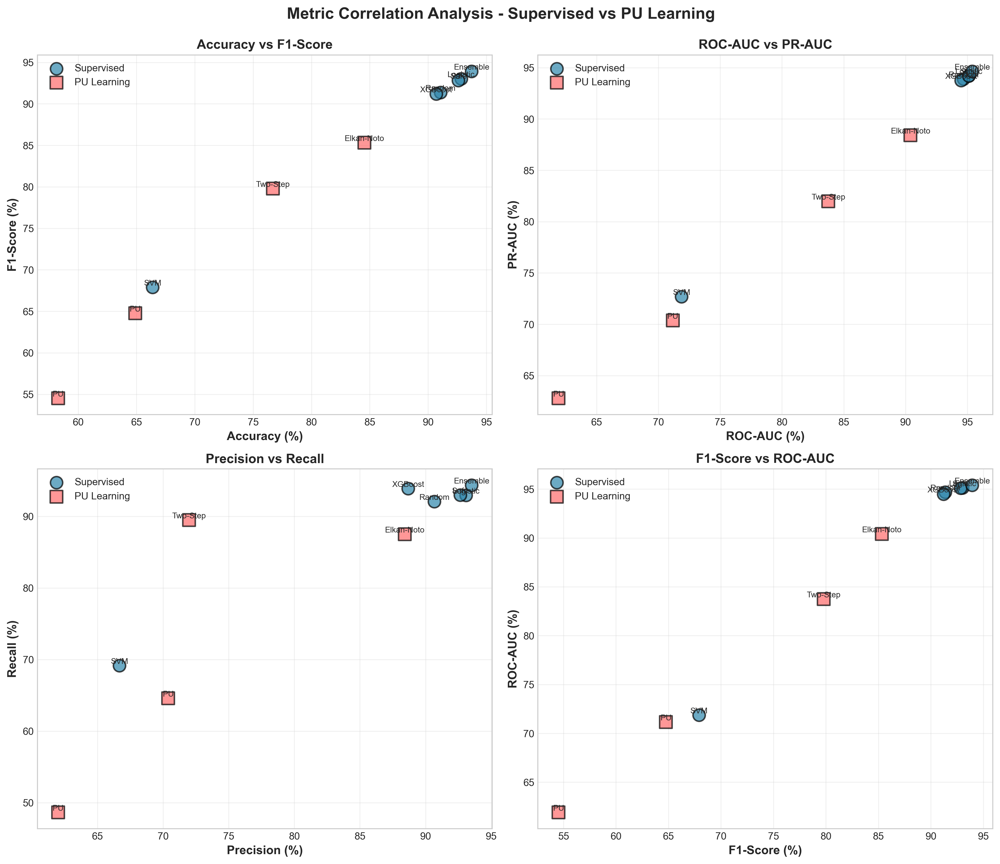

In [147]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Prepare data
supervised_scores = {
    "Logistic Regression": {'Accuracy': 92.83, 'Precision': 93.08, 'Recall': 92.96, 'F1-Score': 93.02, 'ROC-AUC': 95.12, 'PR-AUC': 94.23},
    "Random Forest": {'Accuracy': 91.06, 'Precision': 90.67, 'Recall': 92.09, 'F1-Score': 91.37, 'ROC-AUC': 94.69, 'PR-AUC': 93.89},
    "XGBoost": {'Accuracy': 90.69, 'Precision': 88.68, 'Recall': 93.88, 'F1-Score': 91.20, 'ROC-AUC': 94.50, 'PR-AUC': 93.75},
    "SVM": {'Accuracy': 66.38, 'Precision': 66.67, 'Recall': 69.17, 'F1-Score': 67.90, 'ROC-AUC': 71.87, 'PR-AUC': 72.69},
    "Safe LightGBM": {'Accuracy': 92.60, 'Precision': 92.64, 'Recall': 93.00, 'F1-Score': 92.82, 'ROC-AUC': 95.11, 'PR-AUC': 94.20},
    "Ensemble": {'Accuracy': 93.73, 'Precision': 93.51, 'Recall': 94.35, 'F1-Score': 93.93, 'ROC-AUC': 95.39, 'PR-AUC': 94.65}
}

pu_scores = {
    "Elkan-Noto PU": {'Accuracy': 84.53, 'Precision': 88.41, 'Recall': 87.53, 'F1-Score': 85.33, 'ROC-AUC': 90.40, 'PR-AUC': 88.41},
    "PU Bagging": {'Accuracy': 64.88, 'Precision': 70.39, 'Recall': 64.59, 'F1-Score': 64.76, 'ROC-AUC': 71.16, 'PR-AUC': 70.39},
    "PU SVM": {'Accuracy': 58.27, 'Precision': 61.99, 'Recall': 48.66, 'F1-Score': 54.53, 'ROC-AUC': 61.92, 'PR-AUC': 62.80},
    "Two-Step PU": {'Accuracy': 76.69, 'Precision': 71.97, 'Recall': 89.50, 'F1-Score': 79.79, 'ROC-AUC': 83.75, 'PR-AUC': 81.98}
}

all_models = {**supervised_scores, **pu_scores}
df = pd.DataFrame.from_dict(all_models, orient='index')

# Create scatter plots for key metric pairs
fig, axes = plt.subplots(2, 2, figsize=(14, 12), dpi=300)

# Accuracy vs F1-Score
ax1 = axes[0, 0]
supervised_mask = df.index.isin(list(supervised_scores.keys()))
ax1.scatter(df.loc[supervised_mask, 'Accuracy'], df.loc[supervised_mask, 'F1-Score'], 
           s=150, c='#2E86AB', alpha=0.7, edgecolors='black', linewidth=1.5, label='Supervised', zorder=3)
ax1.scatter(df.loc[~supervised_mask, 'Accuracy'], df.loc[~supervised_mask, 'F1-Score'], 
           s=150, c='#FF6B6B', alpha=0.7, edgecolors='black', linewidth=1.5, label='PU Learning', zorder=3, marker='s')

for idx in df.index:
    ax1.annotate(idx.split()[0] if len(idx.split()) > 1 else idx[:8], 
                (df.loc[idx, 'Accuracy'], df.loc[idx, 'F1-Score']),
                fontsize=8, ha='center', va='bottom')

ax1.set_xlabel('Accuracy (%)', fontsize=12, fontweight='bold')
ax1.set_ylabel('F1-Score (%)', fontsize=12, fontweight='bold')
ax1.set_title('Accuracy vs F1-Score', fontsize=13, fontweight='bold')
ax1.legend(fontsize=10)
ax1.grid(True, alpha=0.3)
ax1.set_axisbelow(True)

# ROC-AUC vs PR-AUC
ax2 = axes[0, 1]
ax2.scatter(df.loc[supervised_mask, 'ROC-AUC'], df.loc[supervised_mask, 'PR-AUC'], 
           s=150, c='#2E86AB', alpha=0.7, edgecolors='black', linewidth=1.5, label='Supervised', zorder=3)
ax2.scatter(df.loc[~supervised_mask, 'ROC-AUC'], df.loc[~supervised_mask, 'PR-AUC'], 
           s=150, c='#FF6B6B', alpha=0.7, edgecolors='black', linewidth=1.5, label='PU Learning', zorder=3, marker='s')

for idx in df.index:
    ax2.annotate(idx.split()[0] if len(idx.split()) > 1 else idx[:8], 
                (df.loc[idx, 'ROC-AUC'], df.loc[idx, 'PR-AUC']),
                fontsize=8, ha='center', va='bottom')

ax2.set_xlabel('ROC-AUC (%)', fontsize=12, fontweight='bold')
ax2.set_ylabel('PR-AUC (%)', fontsize=12, fontweight='bold')
ax2.set_title('ROC-AUC vs PR-AUC', fontsize=13, fontweight='bold')
ax2.legend(fontsize=10)
ax2.grid(True, alpha=0.3)
ax2.set_axisbelow(True)

# Precision vs Recall
ax3 = axes[1, 0]
ax3.scatter(df.loc[supervised_mask, 'Precision'], df.loc[supervised_mask, 'Recall'], 
           s=150, c='#2E86AB', alpha=0.7, edgecolors='black', linewidth=1.5, label='Supervised', zorder=3)
ax3.scatter(df.loc[~supervised_mask, 'Precision'], df.loc[~supervised_mask, 'Recall'], 
           s=150, c='#FF6B6B', alpha=0.7, edgecolors='black', linewidth=1.5, label='PU Learning', zorder=3, marker='s')

for idx in df.index:
    ax3.annotate(idx.split()[0] if len(idx.split()) > 1 else idx[:8], 
                (df.loc[idx, 'Precision'], df.loc[idx, 'Recall']),
                fontsize=8, ha='center', va='bottom')

ax3.set_xlabel('Precision (%)', fontsize=12, fontweight='bold')
ax3.set_ylabel('Recall (%)', fontsize=12, fontweight='bold')
ax3.set_title('Precision vs Recall', fontsize=13, fontweight='bold')
ax3.legend(fontsize=10)
ax3.grid(True, alpha=0.3)
ax3.set_axisbelow(True)

# F1-Score vs ROC-AUC
ax4 = axes[1, 1]
ax4.scatter(df.loc[supervised_mask, 'F1-Score'], df.loc[supervised_mask, 'ROC-AUC'], 
           s=150, c='#2E86AB', alpha=0.7, edgecolors='black', linewidth=1.5, label='Supervised', zorder=3)
ax4.scatter(df.loc[~supervised_mask, 'F1-Score'], df.loc[~supervised_mask, 'ROC-AUC'], 
           s=150, c='#FF6B6B', alpha=0.7, edgecolors='black', linewidth=1.5, label='PU Learning', zorder=3, marker='s')

for idx in df.index:
    ax4.annotate(idx.split()[0] if len(idx.split()) > 1 else idx[:8], 
                (df.loc[idx, 'F1-Score'], df.loc[idx, 'ROC-AUC']),
                fontsize=8, ha='center', va='bottom')

ax4.set_xlabel('F1-Score (%)', fontsize=12, fontweight='bold')
ax4.set_ylabel('ROC-AUC (%)', fontsize=12, fontweight='bold')
ax4.set_title('F1-Score vs ROC-AUC', fontsize=13, fontweight='bold')
ax4.legend(fontsize=10)
ax4.grid(True, alpha=0.3)
ax4.set_axisbelow(True)

plt.suptitle('Metric Correlation Analysis - Supervised vs PU Learning', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('scatter_matrix_comparison.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

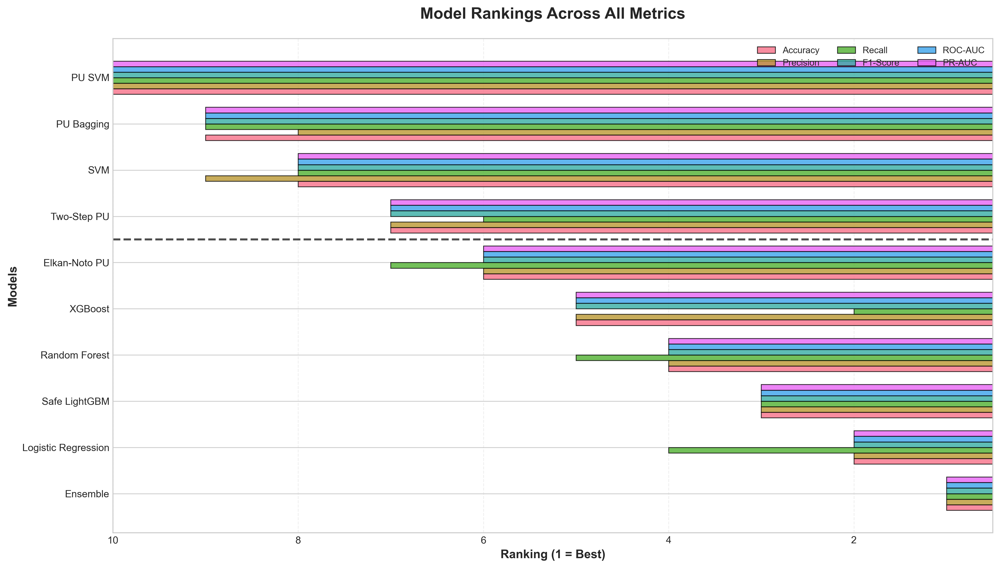

In [148]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Prepare data
supervised_scores = {
    "Logistic Regression": {'Accuracy': 92.83, 'Precision': 93.08, 'Recall': 92.96, 'F1-Score': 93.02, 'ROC-AUC': 95.12, 'PR-AUC': 94.23},
    "Random Forest": {'Accuracy': 91.06, 'Precision': 90.67, 'Recall': 92.09, 'F1-Score': 91.37, 'ROC-AUC': 94.69, 'PR-AUC': 93.89},
    "XGBoost": {'Accuracy': 90.69, 'Precision': 88.68, 'Recall': 93.88, 'F1-Score': 91.20, 'ROC-AUC': 94.50, 'PR-AUC': 93.75},
    "SVM": {'Accuracy': 66.38, 'Precision': 66.67, 'Recall': 69.17, 'F1-Score': 67.90, 'ROC-AUC': 71.87, 'PR-AUC': 72.69},
    "Safe LightGBM": {'Accuracy': 92.60, 'Precision': 92.64, 'Recall': 93.00, 'F1-Score': 92.82, 'ROC-AUC': 95.11, 'PR-AUC': 94.20},
    "Ensemble": {'Accuracy': 93.73, 'Precision': 93.51, 'Recall': 94.35, 'F1-Score': 93.93, 'ROC-AUC': 95.39, 'PR-AUC': 94.65}
}

pu_scores = {
    "Elkan-Noto PU": {'Accuracy': 84.53, 'Precision': 88.41, 'Recall': 87.53, 'F1-Score': 85.33, 'ROC-AUC': 90.40, 'PR-AUC': 88.41},
    "PU Bagging": {'Accuracy': 64.88, 'Precision': 70.39, 'Recall': 64.59, 'F1-Score': 64.76, 'ROC-AUC': 71.16, 'PR-AUC': 70.39},
    "PU SVM": {'Accuracy': 58.27, 'Precision': 61.99, 'Recall': 48.66, 'F1-Score': 54.53, 'ROC-AUC': 61.92, 'PR-AUC': 62.80},
    "Two-Step PU": {'Accuracy': 76.69, 'Precision': 71.97, 'Recall': 89.50, 'F1-Score': 79.79, 'ROC-AUC': 83.75, 'PR-AUC': 81.98}
}

all_models = {**supervised_scores, **pu_scores}
df = pd.DataFrame.from_dict(all_models, orient='index')

# Calculate rankings (1 = best)
rankings = df.rank(ascending=False, method='min')

# Calculate average ranking
rankings['Avg Rank'] = rankings.mean(axis=1)
rankings = rankings.sort_values('Avg Rank')

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC', 'PR-AUC']
y_pos = np.arange(len(rankings))
colors_map = {model: '#2E86AB' if model in supervised_scores else '#FF6B6B' 
              for model in rankings.index}

# Create horizontal bar chart
width = 0.12
for i, metric in enumerate(metrics):
    offset = (i - len(metrics)/2) * width + width/2
    bars = ax.barh(y_pos + offset, rankings[metric], width, 
                   label=metric, alpha=0.8, edgecolor='black', linewidth=0.8)

ax.set_yticks(y_pos)
ax.set_yticklabels(rankings.index, fontsize=10)
ax.set_xlabel('Ranking (1 = Best)', fontsize=12, fontweight='bold')
ax.set_ylabel('Models', fontsize=12, fontweight='bold')
ax.set_title('Model Rankings Across All Metrics', fontsize=16, fontweight='bold', pad=20)
ax.invert_xaxis()  # Best rank (1) on the right
ax.set_xlim([10, 0.5])
ax.legend(loc='upper right', fontsize=9, ncol=3, framealpha=0.9)
ax.grid(axis='x', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

# Add separator
ax.axhline(y=5.5, color='black', linewidth=2, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('ranking_comparison.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

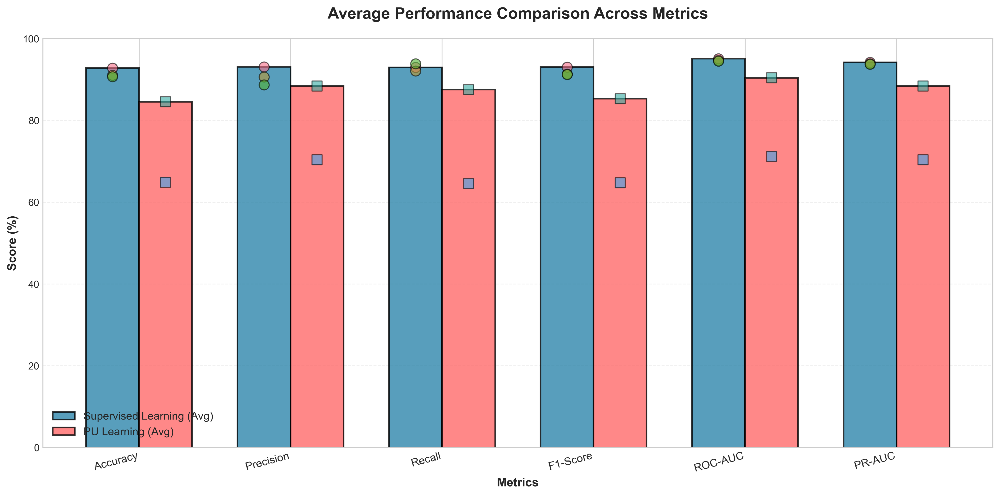

In [149]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Prepare data
supervised_scores = {
    "Logistic Regression": [92.83, 93.08, 92.96, 93.02, 95.12, 94.23],
    "Random Forest": [91.06, 90.67, 92.09, 91.37, 94.69, 93.89],
    "XGBoost": [90.69, 88.68, 93.88, 91.20, 94.50, 93.75],
    "SVM": [66.38, 66.67, 69.17, 67.90, 71.87, 72.69],
    "Safe LightGBM": [92.60, 92.64, 93.00, 92.82, 95.11, 94.20],
    "Ensemble": [93.73, 93.51, 94.35, 93.93, 95.39, 94.65]
}

pu_scores = {
    "Elkan-Noto PU": [84.53, 88.41, 87.53, 85.33, 90.40, 88.41],
    "PU Bagging": [64.88, 70.39, 64.59, 64.76, 71.16, 70.39],
    "PU SVM": [58.27, 61.99, 48.66, 54.53, 61.92, 62.80],
    "Two-Step PU": [76.69, 71.97, 89.50, 79.79, 83.75, 81.98]
}

metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC', 'PR-AUC']

# Calculate averages
supervised_avg = np.mean([list(supervised_scores.values())], axis=0)[0]
pu_avg = np.mean([list(pu_scores.values())], axis=0)[0]

fig, ax = plt.subplots(figsize=(14, 7), dpi=300)

x = np.arange(len(metrics))
width = 0.35

# Create stacked bars showing distribution
ax.bar(x - width/2, supervised_avg, width, label='Supervised Learning (Avg)', 
       color='#2E86AB', alpha=0.8, edgecolor='black', linewidth=1.5)
ax.bar(x + width/2, pu_avg, width, label='PU Learning (Avg)', 
       color='#FF6B6B', alpha=0.8, edgecolor='black', linewidth=1.5)

# Add individual model markers
for model, scores in list(supervised_scores.items())[:3]:  # Top 3
    ax.scatter(x - width/2, scores, s=100, marker='o', alpha=0.6, 
              edgecolors='black', linewidth=1, zorder=3)

for model, scores in list(pu_scores.items())[:2]:  # Top 2
    ax.scatter(x + width/2, scores, s=100, marker='s', alpha=0.6, 
              edgecolors='black', linewidth=1, zorder=3)

ax.set_xlabel('Metrics', fontsize=12, fontweight='bold')
ax.set_ylabel('Score (%)', fontsize=12, fontweight='bold')
ax.set_title('Average Performance Comparison Across Metrics', 
             fontsize=16, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(metrics, rotation=15, ha='right', fontsize=11)
ax.legend(fontsize=11, framealpha=0.9)
ax.set_ylim([0, 100])
ax.grid(axis='y', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

plt.tight_layout()
plt.savefig('stacked_comparison.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

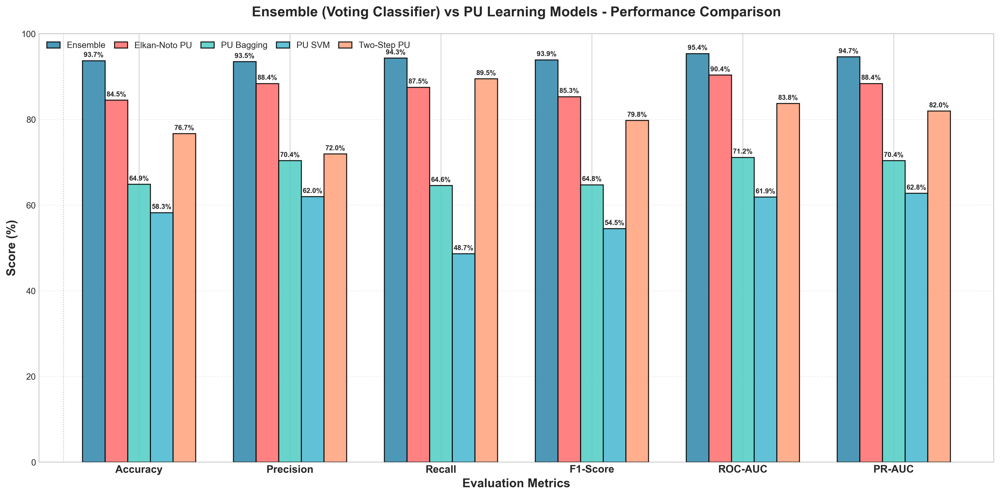


ENSEMBLE vs PU LEARNING MODELS - PERFORMANCE COMPARISON
               Accuracy  Precision  Recall  F1-Score  ROC-AUC  PR-AUC
Ensemble          93.73      93.51   94.35     93.93    95.39   94.65
Elkan-Noto PU     84.53      88.41   87.53     85.33    90.40   88.41
PU Bagging        64.88      70.39   64.59     64.76    71.16   70.39
PU SVM            58.27      61.99   48.66     54.53    61.92   62.80
Two-Step PU       76.69      71.97   89.50     79.79    83.75   81.98

PERFORMANCE GAP (Ensemble - PU Models)

Elkan-Noto PU:
  Average Gap: 6.83%
  Individual Gaps: {'Accuracy': '9.20%', 'Precision': '5.10%', 'Recall': '6.82%', 'F1-Score': '8.60%', 'ROC-AUC': '4.99%', 'PR-AUC': '6.24%'}

PU Bagging:
  Average Gap: 26.56%
  Individual Gaps: {'Accuracy': '28.85%', 'Precision': '23.12%', 'Recall': '29.76%', 'F1-Score': '29.17%', 'ROC-AUC': '24.23%', 'PR-AUC': '24.26%'}

PU SVM:
  Average Gap: 36.23%
  Individual Gaps: {'Accuracy': '35.46%', 'Precision': '31.52%', 'Recall': '45.69%', 'F1-S

In [150]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# ============================================
# DATA
# ============================================
# Ensemble (Voting Classifier) - Best Supervised Model
ensemble_scores = {
    'Accuracy': 93.73,
    'Precision': 93.51,
    'Recall': 94.35,
    'F1-Score': 93.93,
    'ROC-AUC': 95.39,
    'PR-AUC': 94.65
}

# PU Learning Models
pu_scores = {
    "Elkan-Noto PU": {
        'Accuracy': 84.53,
        'Precision': 88.41,
        'Recall': 87.53,
        'F1-Score': 85.33,
        'ROC-AUC': 90.40,
        'PR-AUC': 88.41
    },
    "PU Bagging": {
        'Accuracy': 64.88,
        'Precision': 70.39,
        'Recall': 64.59,
        'F1-Score': 64.76,
        'ROC-AUC': 71.16,
        'PR-AUC': 70.39
    },
    "PU SVM": {
        'Accuracy': 58.27,
        'Precision': 61.99,
        'Recall': 48.66,
        'F1-Score': 54.53,
        'ROC-AUC': 61.92,
        'PR-AUC': 62.80
    },
    "Two-Step PU": {
        'Accuracy': 76.69,
        'Precision': 71.97,
        'Recall': 89.50,
        'F1-Score': 79.79,
        'ROC-AUC': 83.75,
        'PR-AUC': 81.98
    }
}

# ============================================
# PREPARE DATA FOR PLOTTING
# ============================================
# Combine all models
all_models = {"Ensemble": ensemble_scores, **pu_scores}
df = pd.DataFrame.from_dict(all_models, orient='index')

# Define metrics order
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC', 'PR-AUC']
df = df[metrics]

# Reorder models: Ensemble first, then PU models
model_order = ['Ensemble', 'Elkan-Noto PU', 'PU Bagging', 'PU SVM', 'Two-Step PU']
df = df.reindex(model_order)

# ============================================
# CREATE GROUPED BAR CHART
# ============================================
fig, ax = plt.subplots(figsize=(16, 8), dpi=300)

x = np.arange(len(metrics))
width = 0.15  # Width of each bar

# Define colors
colors = {
    'Ensemble': '#2E86AB',      # Blue for Ensemble
    'Elkan-Noto PU': '#FF6B6B',  # Red
    'PU Bagging': '#4ECDC4',     # Teal
    'PU SVM': '#45B7D1',         # Light Blue
    'Two-Step PU': '#FFA07A'     # Light Salmon
}

# Plot bars for each model
for i, model in enumerate(model_order):
    values = [df.loc[model, m] for m in metrics]
    offset = (i - len(model_order)/2) * width + width/2
    bars = ax.bar(x + offset, values, width, label=model, 
                  color=colors[model], alpha=0.85, edgecolor='black', 
                  linewidth=1.2, zorder=3)
    
    # Add value labels on top of bars
    for j, (bar, val) in enumerate(zip(bars, values)):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f'{val:.1f}%',
                ha='center', va='bottom', fontsize=8, fontweight='bold')

# Customize axes
ax.set_xlabel('Evaluation Metrics', fontsize=14, fontweight='bold')
ax.set_ylabel('Score (%)', fontsize=14, fontweight='bold')
ax.set_title('Ensemble (Voting Classifier) vs PU Learning Models - Performance Comparison', 
             fontsize=16, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(metrics, fontsize=12, fontweight='bold')
ax.legend(loc='upper left', ncol=5, fontsize=10, framealpha=0.9, 
          columnspacing=1, handlelength=1.5)
ax.set_ylim([0, 100])
ax.grid(axis='y', alpha=0.3, linestyle='--', zorder=0)
ax.set_axisbelow(True)

# Add separator line after Ensemble
ax.axvline(x=-0.5, color='gray', linewidth=1, linestyle=':', alpha=0.5)

plt.tight_layout()
plt.savefig('ensemble_vs_pu_models.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================
# DISPLAY SUMMARY TABLE
# ============================================
print("\n" + "="*80)
print("ENSEMBLE vs PU LEARNING MODELS - PERFORMANCE COMPARISON")
print("="*80)
print(df.round(2))
print("\n" + "="*80)
print("PERFORMANCE GAP (Ensemble - PU Models)")
print("="*80)
for model in pu_scores.keys():
    gaps = [ensemble_scores[m] - pu_scores[model][m] for m in metrics]
    avg_gap = np.mean(gaps)
    print(f"\n{model}:")
    print(f"  Average Gap: {avg_gap:.2f}%")
    print(f"  Individual Gaps: {dict(zip(metrics, [f'{g:.2f}%' for g in gaps]))}")

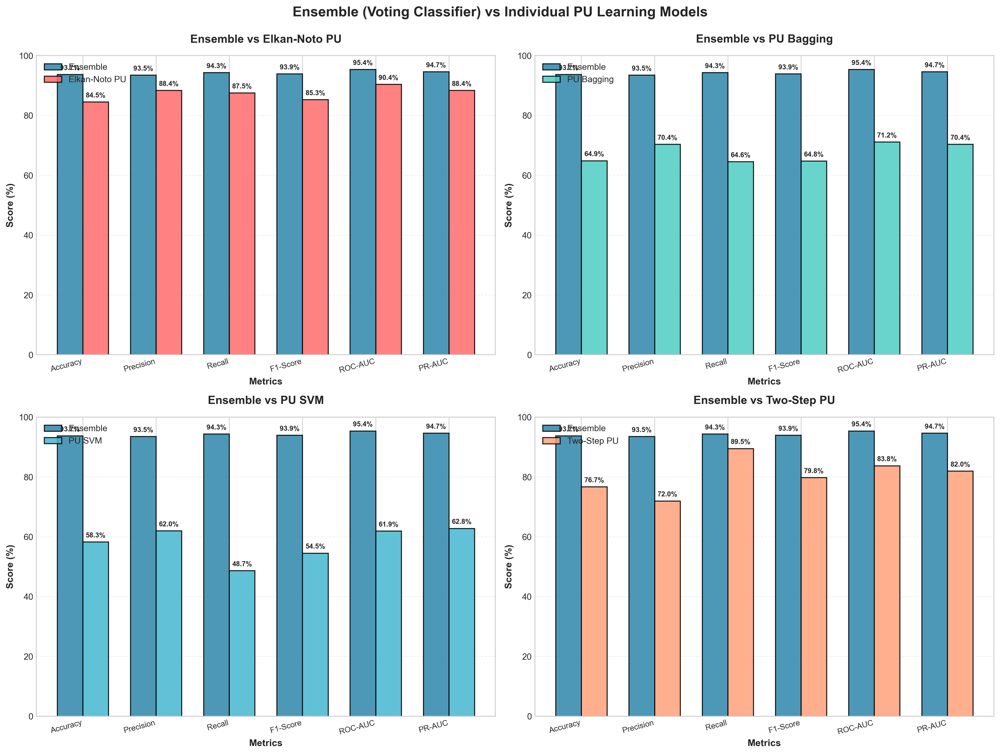

In [151]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Data
ensemble_scores = {
    'Accuracy': 93.73, 'Precision': 93.51, 'Recall': 94.35,
    'F1-Score': 93.93, 'ROC-AUC': 95.39, 'PR-AUC': 94.65
}

pu_scores = {
    "Elkan-Noto PU": {'Accuracy': 84.53, 'Precision': 88.41, 'Recall': 87.53, 
                      'F1-Score': 85.33, 'ROC-AUC': 90.40, 'PR-AUC': 88.41},
    "PU Bagging": {'Accuracy': 64.88, 'Precision': 70.39, 'Recall': 64.59, 
                   'F1-Score': 64.76, 'ROC-AUC': 71.16, 'PR-AUC': 70.39},
    "PU SVM": {'Accuracy': 58.27, 'Precision': 61.99, 'Recall': 48.66, 
               'F1-Score': 54.53, 'ROC-AUC': 61.92, 'PR-AUC': 62.80},
    "Two-Step PU": {'Accuracy': 76.69, 'Precision': 71.97, 'Recall': 89.50, 
                   'F1-Score': 79.79, 'ROC-AUC': 83.75, 'PR-AUC': 81.98}
}

metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC', 'PR-AUC']

# Create subplots for each PU model
fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=300)
axes = axes.flatten()

pu_models = list(pu_scores.keys())
colors_pu = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A']

for idx, (pu_model, color) in enumerate(zip(pu_models, colors_pu)):
    ax = axes[idx]
    
    x = np.arange(len(metrics))
    width = 0.35
    
    # Get values
    ensemble_vals = [ensemble_scores[m] for m in metrics]
    pu_vals = [pu_scores[pu_model][m] for m in metrics]
    
    # Create bars
    bars1 = ax.bar(x - width/2, ensemble_vals, width, label='Ensemble', 
                   color='#2E86AB', alpha=0.85, edgecolor='black', linewidth=1.2)
    bars2 = ax.bar(x + width/2, pu_vals, width, label=pu_model, 
                   color=color, alpha=0.85, edgecolor='black', linewidth=1.2)
    
    # Add value labels
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                   f'{height:.1f}%', ha='center', va='bottom', 
                   fontsize=8, fontweight='bold')
    
    # Customize
    ax.set_xlabel('Metrics', fontsize=11, fontweight='bold')
    ax.set_ylabel('Score (%)', fontsize=11, fontweight='bold')
    ax.set_title(f'Ensemble vs {pu_model}', fontsize=13, fontweight='bold', pad=15)
    ax.set_xticks(x)
    ax.set_xticklabels(metrics, rotation=15, ha='right', fontsize=9)
    ax.legend(loc='upper left', fontsize=10, framealpha=0.9)
    ax.set_ylim([0, 100])
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.set_axisbelow(True)

plt.suptitle('Ensemble (Voting Classifier) vs Individual PU Learning Models', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('ensemble_vs_pu_individual.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

C:\Users\vn212\AppData\Local\Temp\ipykernel_1808\3464384135.py:171: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(models, rotation=15, ha='right', fontsize=10)


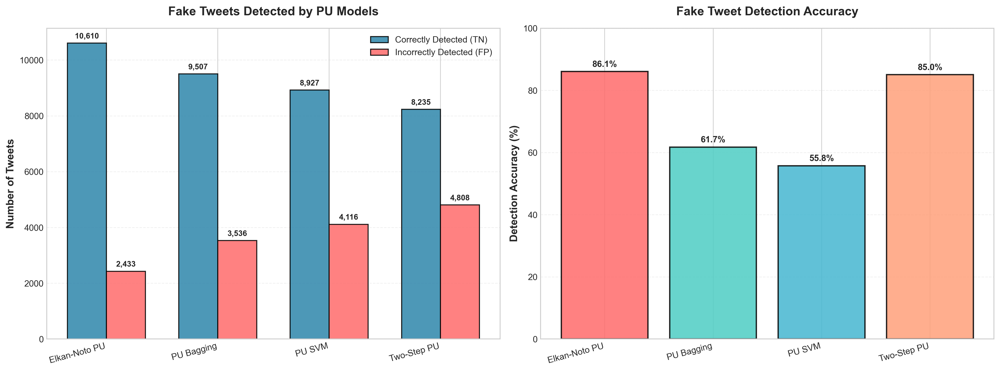


FAKE TWEET DETECTION SUMMARY - PU LEARNING MODELS
              Total Detected Correct (TN) Incorrect (FP)  \
Elkan-Noto PU          13043        10610           2433   
PU Bagging             13043         9507           3536   
PU SVM                 13043         8927           4116   
Two-Step PU            13043         8235           4808   

              Detection Accuracy (%) False Positive Rate (%)  
Elkan-Noto PU              86.050284               16.767746  
PU Bagging                 61.749805               30.898287  
PU SVM                     55.758901                38.00554  
Two-Step PU                85.037175               28.025181  

DETAILED BREAKDOWN

Elkan-Noto PU:
  Total Fake Tweets Detected: 13,043
    • Correctly Detected (TN): 10,610
    • Incorrectly Detected (FP): 2,433
  Total Actual Fake Tweets: 12,330
  Detection Accuracy: 86.05%
  False Positive Rate: 16.77%

PU Bagging:
  Total Fake Tweets Detected: 13,043
    • Correctly Detected (TN): 9,507
  

In [155]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix

# ============================================
# CALCULATE FAKE TWEET DETECTION FROM EXISTING VARIABLES
# ============================================
# Using the confusion matrix components already calculated in your code

# Elkan-Noto PU (from lines 3313-3316)
# Note: You may need to recalculate if y_pred was overwritten
# For Elkan-Noto, use: y_pred_elkan = (p_test >= pu_clf.threshold).astype(int)
# Or use the existing cm_elkan if available

# PU Bagging (from lines 3735-3738)
# y_pred_bagging is already available (line 3630)

# PU SVM (from lines 4017-4020)
# y_pred_svm_pu is already available (line 3864)

# Two-Step PU (from lines 4386-4389)
# y_pred is available but might be overwritten - use cm_twostep or recalculate

# ============================================
# OPTION 1: Use existing confusion matrix components
# ============================================
# If the variables are still in scope, use them directly:

results = {}

# Elkan-Noto PU
if 'tn_elkan' in globals() and 'fp_elkan' in globals():
    results['Elkan-Noto PU'] = {
        'total_fake_detected': tn_elkan + fp_elkan,
        'correctly_detected_fake': tn_elkan,
        'incorrectly_detected_fake': fp_elkan,
        'total_actual_fake': tn_elkan + fn_elkan,
        'detection_accuracy': (tn_elkan / (tn_elkan + fn_elkan) * 100) if (tn_elkan + fn_elkan) > 0 else 0,
        'false_positive_rate': (fp_elkan / (fp_elkan + tp_elkan) * 100) if (fp_elkan + tp_elkan) > 0 else 0
    }

# PU Bagging
if 'tn_bagging' in globals() and 'fp_bagging' in globals():
    results['PU Bagging'] = {
        'total_fake_detected': tn_bagging + fp_bagging,
        'correctly_detected_fake': tn_bagging,
        'incorrectly_detected_fake': fp_bagging,
        'total_actual_fake': tn_bagging + fn_bagging,
        'detection_accuracy': (tn_bagging / (tn_bagging + fn_bagging) * 100) if (tn_bagging + fn_bagging) > 0 else 0,
        'false_positive_rate': (fp_bagging / (fp_bagging + tp_bagging) * 100) if (fp_bagging + tp_bagging) > 0 else 0
    }

# PU SVM
if 'tn_svm_pu' in globals() and 'fp_svm_pu' in globals():
    results['PU SVM'] = {
        'total_fake_detected': tn_svm_pu + fp_svm_pu,
        'correctly_detected_fake': tn_svm_pu,
        'incorrectly_detected_fake': fp_svm_pu,
        'total_actual_fake': tn_svm_pu + fn_svm_pu,
        'detection_accuracy': (tn_svm_pu / (tn_svm_pu + fn_svm_pu) * 100) if (tn_svm_pu + fn_svm_pu) > 0 else 0,
        'false_positive_rate': (fp_svm_pu / (fp_svm_pu + tp_svm_pu) * 100) if (fp_svm_pu + tp_svm_pu) > 0 else 0
    }

# Two-Step PU
if 'tn_twostep' in globals() and 'fp_twostep' in globals():
    results['Two-Step PU'] = {
        'total_fake_detected': tn_twostep + fp_twostep,
        'correctly_detected_fake': tn_twostep,
        'incorrectly_detected_fake': fp_twostep,
        'total_actual_fake': tn_twostep + fn_twostep,
        'detection_accuracy': (tn_twostep / (tn_twostep + fn_twostep) * 100) if (tn_twostep + fn_twostep) > 0 else 0,
        'false_positive_rate': (fp_twostep / (fp_twostep + tp_twostep) * 100) if (fp_twostep + tp_twostep) > 0 else 0
    }

# ============================================
# OPTION 2: Recalculate from predictions (MORE RELIABLE)
# ============================================
# This is safer if variables might have been overwritten

# Recalculate confusion matrices from predictions
pu_models_predictions = {}

# Elkan-Noto PU - need to get y_pred_elkan
# If p_test and pu_clf.threshold are available:
if 'p_test' in globals() and 'pu_clf' in globals():
    y_pred_elkan = (p_test >= pu_clf.threshold).astype(int)
    pu_models_predictions['Elkan-Noto PU'] = (y_test, y_pred_elkan)

# PU Bagging - already has y_pred_bagging
if 'y_pred_bagging' in globals():
    pu_models_predictions['PU Bagging'] = (y_test, y_pred_bagging)

# PU SVM - already has y_pred_svm_pu
if 'y_pred_svm_pu' in globals() and 'y_test_eval' in globals():
    pu_models_predictions['PU SVM'] = (y_test_eval, y_pred_svm_pu)
elif 'y_pred_svm_pu' in globals() and 'y_test' in globals():
    pu_models_predictions['PU SVM'] = (y_test, y_pred_svm_pu)

# Two-Step PU - need to get y_pred_twostep
# If p_final and opt_threshold are available:
if 'p_final' in globals() and 'opt_threshold' in globals():
    y_pred_twostep = (p_final >= opt_threshold).astype(int)
    pu_models_predictions['Two-Step PU'] = (y_test, y_pred_twostep)

# Calculate results from predictions
results = {}
for model_name, (y_true, y_pred) in pu_models_predictions.items():
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    
    total_fake_detected = tn + fp  # All predictions labeled as 0 (Fake)
    total_actual_fake = tn + fn    # Total actual fake tweets in test set
    correctly_detected = tn         # Correctly identified fake tweets
    incorrectly_detected = fp      # Real tweets incorrectly labeled as fake
    
    results[model_name] = {
        'total_fake_detected': total_fake_detected,
        'correctly_detected_fake': correctly_detected,
        'incorrectly_detected_fake': incorrectly_detected,
        'total_actual_fake': total_actual_fake,
        'detection_accuracy': (tn / total_actual_fake * 100) if total_actual_fake > 0 else 0,
        'false_positive_rate': (fp / (fp + tp) * 100) if (fp + tp) > 0 else 0,
        'confusion_matrix': cm
    }

# ============================================
# CREATE VISUALIZATION
# ============================================
fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=300)

models = list(results.keys())
total_detected = [results[m]['total_fake_detected'] for m in models]
correct = [results[m]['correctly_detected_fake'] for m in models]
incorrect = [results[m]['incorrectly_detected_fake'] for m in models]

# Plot 1: Total Fake Tweets Detected (Correct vs Incorrect)
ax1 = axes[0]
x = np.arange(len(models))
width = 0.35
bars1 = ax1.bar(x - width/2, correct, width, label='Correctly Detected (TN)', 
                color='#2E86AB', alpha=0.85, edgecolor='black', linewidth=1.2)
bars2 = ax1.bar(x + width/2, incorrect, width, label='Incorrectly Detected (FP)', 
                color='#FF6B6B', alpha=0.85, edgecolor='black', linewidth=1.2)

ax1.set_ylabel('Number of Tweets', fontsize=12, fontweight='bold')
ax1.set_title('Fake Tweets Detected by PU Models', fontsize=14, fontweight='bold', pad=15)
ax1.set_xticks(x)
ax1.set_xticklabels(models, rotation=15, ha='right', fontsize=10)
ax1.legend(fontsize=10, framealpha=0.9)
ax1.grid(axis='y', alpha=0.3, linestyle='--')
ax1.set_axisbelow(True)

# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        if height > 0:
            ax1.text(bar.get_x() + bar.get_width()/2., height + max(max(correct), max(incorrect))*0.01,
                    f'{int(height):,}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# Plot 2: Detection Accuracy
ax2 = axes[1]
detection_acc = [results[m]['detection_accuracy'] for m in models]
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A']
bars = ax2.bar(models, detection_acc, color=colors, alpha=0.85, 
               edgecolor='black', linewidth=1.5)

ax2.set_ylabel('Detection Accuracy (%)', fontsize=12, fontweight='bold')
ax2.set_title('Fake Tweet Detection Accuracy', fontsize=14, fontweight='bold', pad=15)
ax2.set_xticklabels(models, rotation=15, ha='right', fontsize=10)
ax2.set_ylim([0, 100])
ax2.grid(axis='y', alpha=0.3, linestyle='--')
ax2.set_axisbelow(True)

# Add value labels
for bar, val in zip(bars, detection_acc):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 1,
            f'{val:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig('fake_tweet_detection_pu_models.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================
# PRINT SUMMARY TABLE
# ============================================
print("\n" + "="*80)
print("FAKE TWEET DETECTION SUMMARY - PU LEARNING MODELS")
print("="*80)

df_summary = pd.DataFrame(results).T
df_summary = df_summary[['total_fake_detected', 'correctly_detected_fake', 
                         'incorrectly_detected_fake', 'detection_accuracy', 
                         'false_positive_rate']]
df_summary.columns = ['Total Detected', 'Correct (TN)', 'Incorrect (FP)', 
                     'Detection Accuracy (%)', 'False Positive Rate (%)']
print(df_summary.round(2))

print("\n" + "="*80)
print("DETAILED BREAKDOWN")
print("="*80)
for model_name, stats in results.items():
    print(f"\n{model_name}:")
    print(f"  Total Fake Tweets Detected: {stats['total_fake_detected']:,}")
    print(f"    • Correctly Detected (TN): {stats['correctly_detected_fake']:,}")
    print(f"    • Incorrectly Detected (FP): {stats['incorrectly_detected_fake']:,}")
    print(f"  Total Actual Fake Tweets: {stats['total_actual_fake']:,}")
    print(f"  Detection Accuracy: {stats['detection_accuracy']:.2f}%")
    print(f"  False Positive Rate: {stats['false_positive_rate']:.2f}%")

In [98]:
!pip instl nbformat nbconvert


ERROR: unknown command "instl" - maybe you meant "install"



In [99]:
# pip install nbformat nbconvert
import nbformat
from nbconvert import PythonExporter
from pathlib import Path

ipynb_path = Path(r"C:/Users/vn212/Downloads/OneDrive_1_11-7-2025/Data Science Project_PU-Copy1.ipynb")
py_path    = Path(r"C:/Users/vn212/Downloads/OneDrive_1_11-7-2025/project_Actual.py")

# Always read ipynb as UTF-8
with ipynb_path.open("r", encoding="utf-8") as f:
    nb = nbformat.read(f, as_version=4)

body, _ = PythonExporter().from_notebook_node(nb)

with py_path.open("w", encoding="utf-8", newline="\n") as f:
    f.write(body)

print(f"Saved: {py_path}")


Saved: C:\Users\vn212\Downloads\OneDrive_1_11-7-2025\project_Actual.py


In [100]:
target_col = 'BinaryNumTarget'

# Compute the correlation matrix on numeric data
corr_matrix = df_numeric.corr()

# Get the absolute correlation of each feature with the target
target_corr = corr_matrix[target_col].abs()

# Sort the correlation values in descending order
target_corr_sorted = target_corr.sort_values(ascending=False)
print("Correlation with target (descending):\n", target_corr_sorted)

NameError: name 'df_numeric' is not defined

In [ ]:
corr_threshold = 0.05

# (Optional) If there are features you consider critical for domain reasons,
# keep them regardless of correlation value.
domain_critical_features = ['BotScore', 'BotScoreBinary', 'cred','normalize_influence','','','','','','']  # exampl

In [ ]:
# Get the list of features above the threshold
selected_features = target_corr[target_corr >= corr_threshold].index.tolist()

# Combine with domain-critical features
selected_features = list(set(selected_features + domain_critical_features))

# Remove the target from the feature list if present
if target_col in selected_features:
    selected_features.remove(target_col)

# Create a new DataFrame with selected features + target
df_corr_selected = df[selected_features + [target_col]].copy()

df_corr_selected.info()

KeyError: "[''] not in index"

In [ ]:
corr_threshold = 0.05

# Select features whose absolute correlation with the target is above the threshold
selected_features = target_corr[target_corr >= corr_threshold].index.tolist()

# Remove the target column from the feature list if it's included
if target_col in selected_features:
    selected_features.remove(target_col)

print("Features selected based on correlation threshold of", corr_threshold, ":\n", selected_features)

Features selected based on correlation threshold of 0.05 :
 ['statuses_count', 'cred', 'normalize_influence', 'hashtags', 'URLs', 'unique_count', 'NORP_percentage', 'PERSON_percentage', 'MONEY_percentage', 'CARDINAL_percentage', 'Word count', 'present_verbs', 'past_verbs', 'adjectives', 'pronouns', 'TOs', 'exclamation', 'capitals', 'short_word_freq']


In [ ]:
df_selected = df_numeric[selected_features + [target_col]].copy()

# Check the structure of the new DataFrame
df_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134198 entries, 0 to 134197
Data columns (total 20 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   statuses_count       134198 non-null  float64
 1   cred                 134198 non-null  float64
 2   normalize_influence  134198 non-null  float64
 3   hashtags             134198 non-null  float64
 4   URLs                 134198 non-null  float64
 5   unique_count         134198 non-null  int64  
 6   NORP_percentage      134198 non-null  float64
 7   PERSON_percentage    134198 non-null  float64
 8   MONEY_percentage     134198 non-null  float64
 9   CARDINAL_percentage  134198 non-null  float64
 10  Word count           134198 non-null  int64  
 11  present_verbs        134198 non-null  int64  
 12  past_verbs           134198 non-null  int64  
 13  adjectives           134198 non-null  int64  
 14  pronouns             134198 non-null  int64  
 15  TOs              

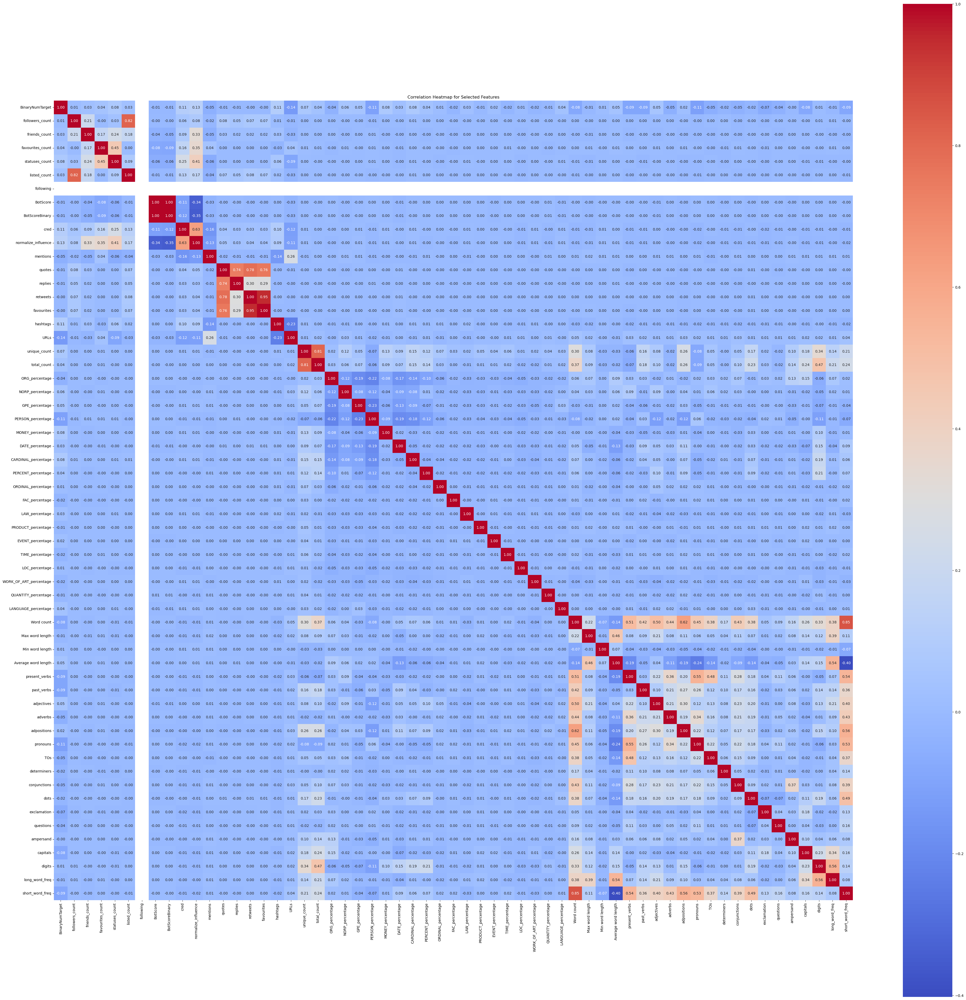

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_model is your DataFrame containing only the columns you want for modeling.
# If you haven't created it yet, refer to the previous code snippet that selects necessary columns.

# Select only numeric columns (ignoring text columns like 'tweet')
numeric_cols = df.select_dtypes(include=[np.number]).columns

# Compute the correlation matrix
corr_matrix = df[numeric_cols].corr()

# Set up the matplotlib figure
plt.figure(figsize=(50,50))

# Generate a heatmap with annotations
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)

plt.title("Correlation Heatmap for Selected Features")
plt.show()


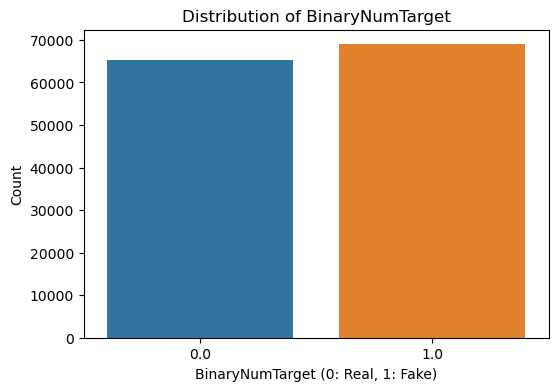

In [ ]:
plt.figure(figsize=(6,4))
sns.countplot(x='BinaryNumTarget', data=df)
plt.title("Distribution of BinaryNumTarget")
plt.xlabel("BinaryNumTarget (0: Real, 1: Fake)")
plt.ylabel("Count")
plt.show()

C:\Users\nandu\AppData\Local\Temp\ipykernel_26992\490240493.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\nandu\AppData\Local\Temp\ipykernel_26992\490240493.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\nandu\AppData\Local\Temp\ipykernel_26992\490240493.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\nandu\AppData\Local\Temp\ipykernel_26992\490240493.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\nandu\AppData\Local\Temp\ipykernel_26992\490240493.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\nandu\AppData\Local\Temp\ipykernel_26992\490240493.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\nandu\AppData\Local\Temp\ipykernel_26992\490240493.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\nandu\AppDa

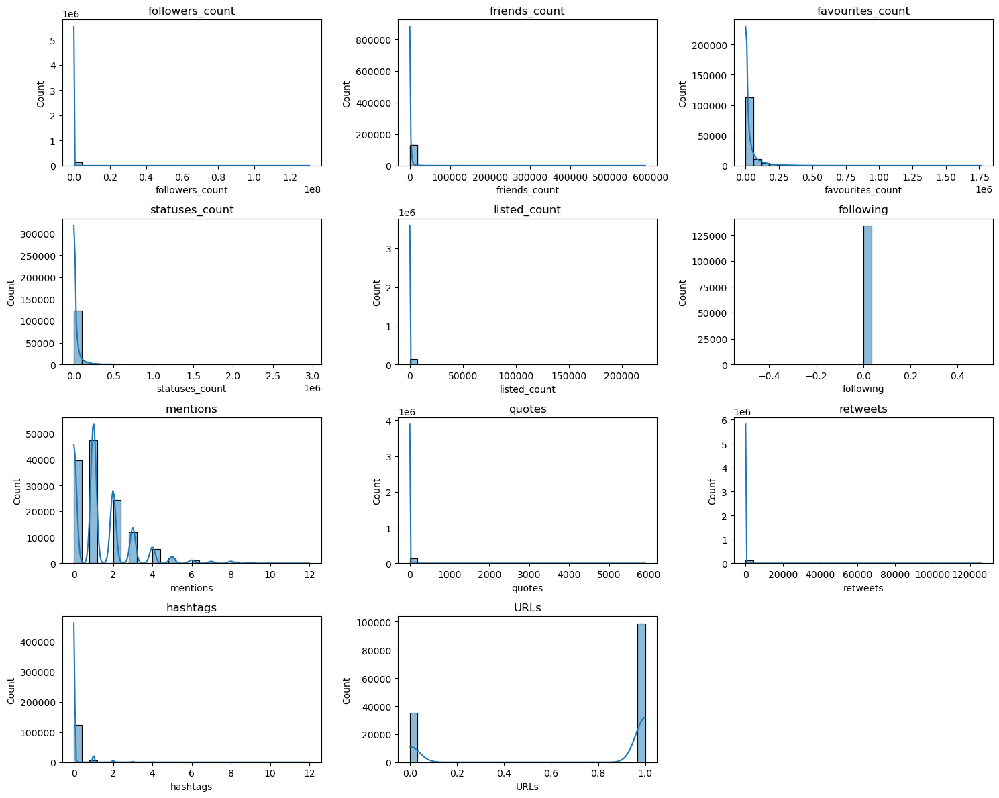

In [ ]:
user_engagement_features = [
    'followers_count', 'friends_count', 'favourites_count', 
    'statuses_count', 'listed_count', 'following',
    'mentions', 'quotes', 'retweets', 'hashtags', 'URLs'
]

plt.figure(figsize=(15, 12))
for i, feature in enumerate(user_engagement_features):
    plt.subplot(4, 3, i+1)
    sns.histplot(df[feature], bins=30, kde=True)
    plt.title(feature)
    plt.tight_layout()
plt.show()

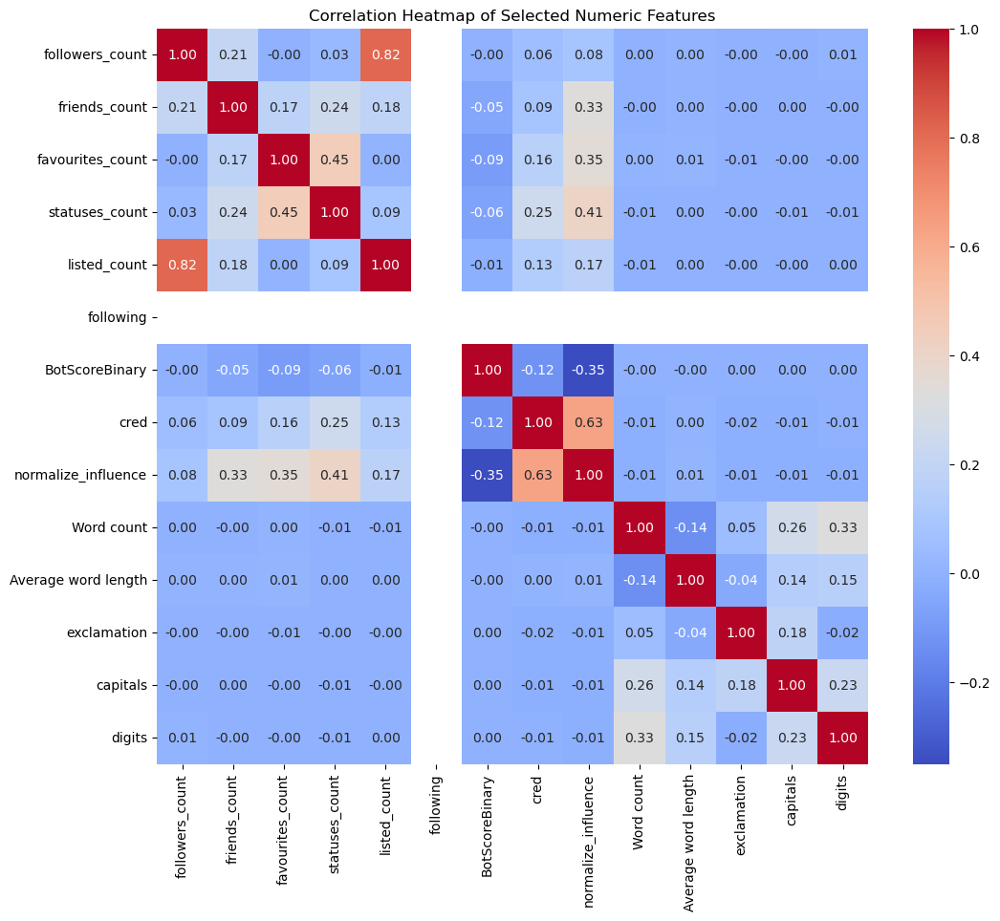

In [ ]:
selected_numeric_cols = [
    'followers_count', 'friends_count', 'favourites_count', 
    'statuses_count', 'listed_count', 'following',
    'BotScoreBinary', 'cred', 'normalize_influence',
    'Word count', 'Average word length', 'exclamation', 'capitals', 'digits'
]

# Compute correlation matrix
corr_matrix = df[selected_numeric_cols].corr()

plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Heatmap of Selected Numeric Features")
plt.show()